## Remove the # below to install the dependencies. You only need to run this once. Running the whole project in a virtual environment is advisable.

In [ ]:
#!pip install pandas numpy sentence-transformers hdbscan umap-learn scikit-learn matplotlib


In [ ]:
import pandas as pd
import numpy as np
import hdbscan
import umap
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
from sklearn.preprocessing import StandardScaler

df = pd.read_csv("output_AAUM-Login Support.csv")
text_columns = ["Title", "Servicename", "Description", "Feed"]  # Adjust based on actual dataset
df.dropna(subset=text_columns, inplace=True)


c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


FileNotFoundError: [Errno 2] No such file or directory: 'output_AAUM-Login Support.csv'

In [34]:
# Load BERT model (Sentence-BERT for semantic similarity)
model = SentenceTransformer("all-MiniLM-L6-v2")

# Generate embeddings for each column separately and store them
column_embeddings = {}
for col in text_columns:
    print(f"Embedding column: {col}")
    column_embeddings[col] = model.encode(df[col].astype(str).tolist(), show_progress_bar=True)
final_embeddings = np.hstack([column_embeddings[col] for col in text_columns])


Embedding column: Title


Batches: 0it [00:00, ?it/s]


Embedding column: Servicename


Batches: 0it [00:00, ?it/s]


Embedding column: Description


Batches: 0it [00:00, ?it/s]


Embedding column: Feed


Batches: 0it [00:00, ?it/s]


In [31]:
umap_model = umap.UMAP(n_neighbors=15, n_components=50, metric="cosine").fit_transform(final_embeddings)
scaler = StandardScaler()
umap_embeddings = scaler.fit_transform(umap_model)


c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


ValueError: Expected 2D array, got 1D array instead:
array=[].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [ ]:
# HDBSCAN clustering
clusterer = hdbscan.HDBSCAN(min_cluster_size=5, min_samples=3, metric="euclidean", cluster_selection_method="eom")
cluster_labels = clusterer.fit_predict(umap_embeddings)

# Assign cluster labels to DataFrame
df["Cluster"] = cluster_labels


c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [32]:
umap_2d = umap.UMAP(n_neighbors=15, n_components=2, metric="cosine").fit_transform(final_embeddings)

plt.figure(figsize=(10, 6))
plt.scatter(umap_2d[:, 0], umap_2d[:, 1], c=df["Cluster"], cmap="Spectral", s=10)
plt.colorbar(label="Cluster")
plt.title("HDBSCAN Clusters Visualization")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.show()


c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


ValueError: Expected 2D array, got 1D array instead:
array=[].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [33]:

num_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
print(f"Number of clusters found: {num_clusters}")

print(df["Cluster"].value_counts())
for cluster in df["Cluster"].unique():
    if cluster != -1:  
        print(f"\nCluster {cluster} Examples:")
        print(df[df["Cluster"] == cluster][text_columns].sample(3))  


Number of clusters found: 212


KeyError: 'Cluster'

In [ ]:
df.to_csv("output_AAUM-Login Support_with_clusters.csv", index=False)  # Save DataFrame with cluster labels to CSV file

# Run the block below to run the script



# Run the cell below to the script


Processing: ITS-AcademicTechnologyConsultation.csv
Embedding column: Title


Batches: 100%|██████████| 1/1 [00:00<00:00, 13.93it/s]


Embedding column: Servicename


Batches: 100%|██████████| 1/1 [00:00<00:00, 28.88it/s]


Embedding column: Description


Batches: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


Embedding column: Feed


Batches: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-AcademicTechnologyConsultation.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-AccesstoEmployee-HeldDataforU-MUnits-ForusebyHRStaffonly.csv
Embedding column: Title


Batches: 100%|██████████| 7/7 [00:00<00:00, 20.65it/s]


Embedding column: Servicename


Batches: 100%|██████████| 7/7 [00:00<00:00, 22.04it/s]


Embedding column: Description


Batches: 100%|██████████| 7/7 [00:01<00:00,  5.47it/s]


Embedding column: Feed


Batches: 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


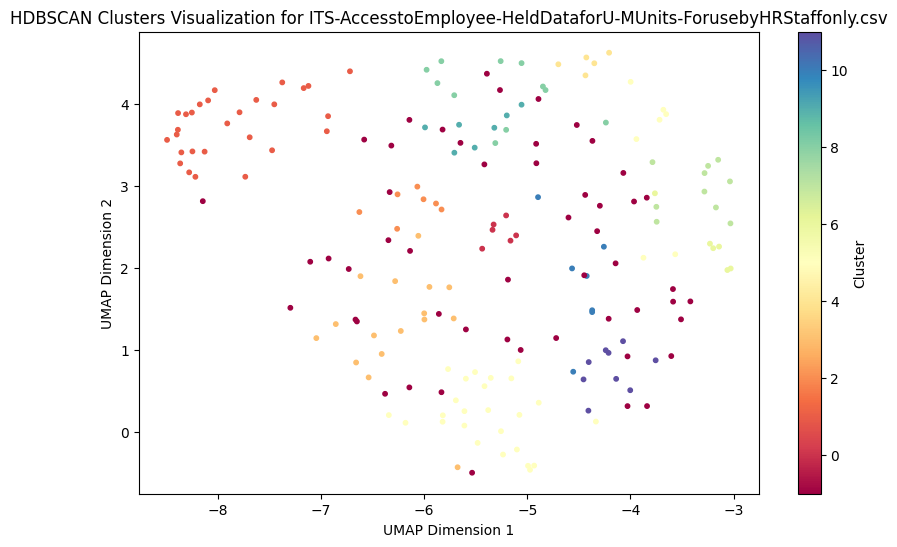

Number of clusters found in ITS-AccesstoEmployee-HeldDataforU-MUnits-ForusebyHRStaffonly.csv: 12
Cluster
-1     52
 5     32
 1     28
 3     16
 8     11
 7     10
 11     9
 10     7
 9      7
 2      7
 6      6
 0      6
 4      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AccesstoEmployee-HeldDataforU-MUnits-ForusebyHRStaffonly.csv

Processing: ITS-AccountDeprovisioning.csv
Embedding column: Title


Batches: 100%|██████████| 15/15 [00:00<00:00, 18.10it/s]


Embedding column: Servicename


Batches: 100%|██████████| 15/15 [00:00<00:00, 25.06it/s]


Embedding column: Description


Batches: 100%|██████████| 15/15 [00:03<00:00,  4.31it/s]


Embedding column: Feed


Batches: 100%|██████████| 15/15 [00:08<00:00,  1.75it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


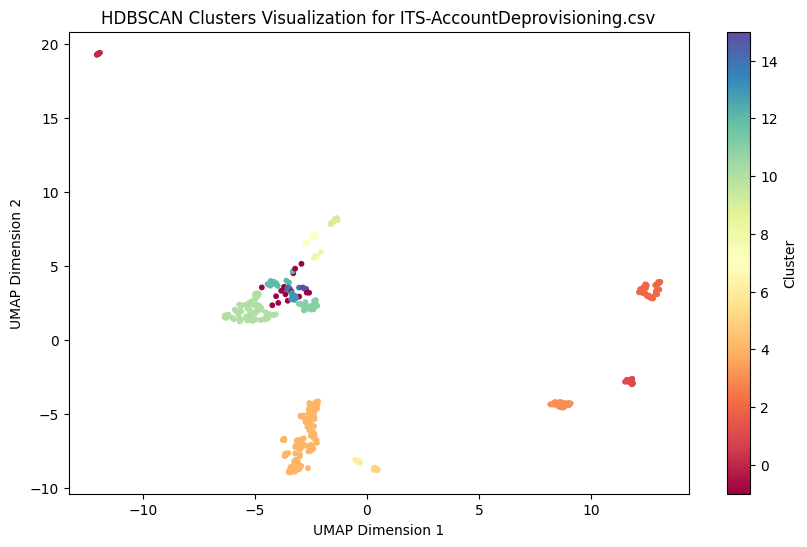

Number of clusters found in ITS-AccountDeprovisioning.csv: 16
Cluster
 4     120
 10     84
 2      46
 3      31
 11     26
 9      18
 12     17
 1      16
 7      15
-1      15
 0      13
 5      12
 14     10
 6       9
 13      8
 8       6
 15      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AccountDeprovisioning.csv

Processing: ITS-AccountsPayableModule.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 20.41it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 31.92it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.25it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


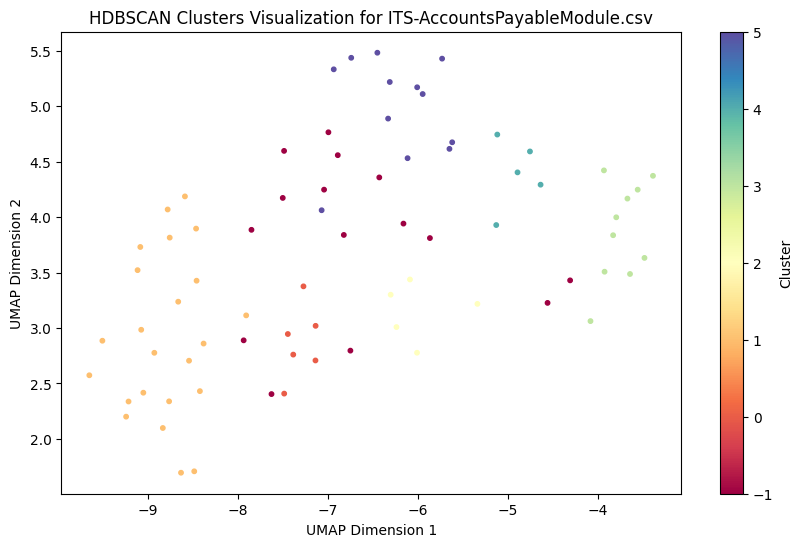

Number of clusters found in ITS-AccountsPayableModule.csv: 6
Cluster
 1    23
-1    15
 5    12
 3    10
 0     6
 4     5
 2     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AccountsPayableModule.csv

Processing: ITS-ActiveDirectory(UMROOT).csv
Embedding column: Title


Batches: 100%|██████████| 20/20 [00:00<00:00, 20.25it/s]


Embedding column: Servicename


Batches: 100%|██████████| 20/20 [00:01<00:00, 12.49it/s]


Embedding column: Description


Batches: 100%|██████████| 20/20 [00:06<00:00,  3.12it/s]


Embedding column: Feed


Batches: 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


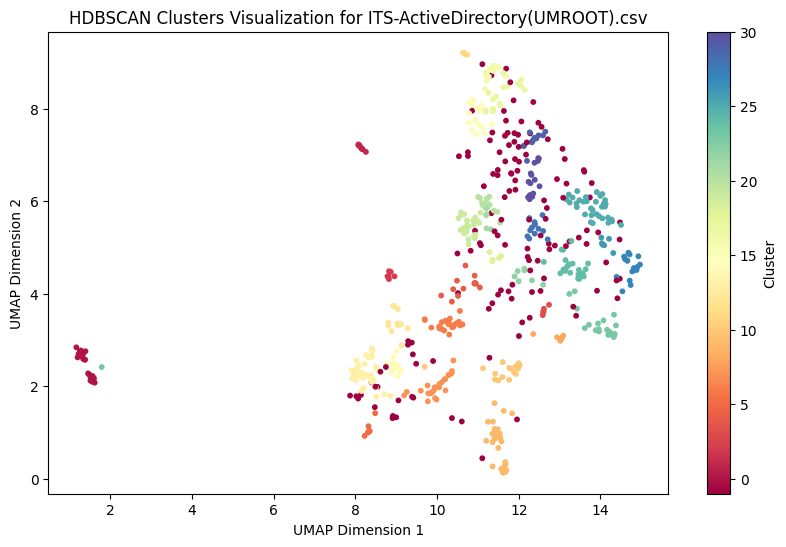

Number of clusters found in ITS-ActiveDirectory(UMROOT).csv: 31
Cluster
-1     131
 13     40
 25     34
 9      32
 0      29
 23     25
 7      25
 6      23
 24     23
 19     22
 15     18
 30     17
 27     17
 17     17
 10     16
 16     16
 14     13
 28     12
 12     12
 20     12
 29     12
 4      12
 1      11
 5       7
 22      7
 26      6
 8       6
 11      6
 18      6
 21      6
 2       6
 3       5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ActiveDirectory(UMROOT).csv

Processing: ITS-ActiveDirectoryAccountSupport.csv
Embedding column: Title


Batches: 100%|██████████| 6/6 [00:00<00:00, 23.55it/s]


Embedding column: Servicename


Batches: 100%|██████████| 6/6 [00:00<00:00, 33.63it/s]


Embedding column: Description


Batches: 100%|██████████| 6/6 [00:01<00:00,  4.23it/s]


Embedding column: Feed


Batches: 100%|██████████| 6/6 [00:02<00:00,  2.35it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


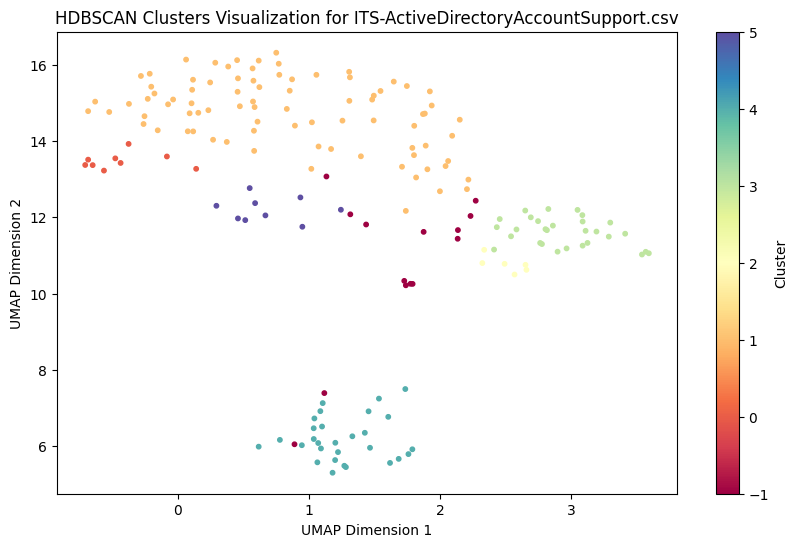

Number of clusters found in ITS-ActiveDirectoryAccountSupport.csv: 6
Cluster
 1    83
 3    29
 4    29
-1    14
 5     9
 0     9
 2     6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ActiveDirectoryAccountSupport.csv

Processing: ITS-AdministrationFinance.csv
Embedding column: Title


Batches: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


Embedding column: Servicename


Batches: 100%|██████████| 1/1 [00:00<00:00, 19.74it/s]


Embedding column: Description


Batches: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


Embedding column: Feed


Batches: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-AdministrationFinance.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-AdministrationPurchasing.csv
Embedding column: Title


Batches: 100%|██████████| 70/70 [00:04<00:00, 14.56it/s]


Embedding column: Servicename


Batches: 100%|██████████| 70/70 [00:02<00:00, 30.16it/s]


Embedding column: Description


Batches: 100%|██████████| 70/70 [00:24<00:00,  2.81it/s]


Embedding column: Feed


Batches: 100%|██████████| 70/70 [00:41<00:00,  1.69it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


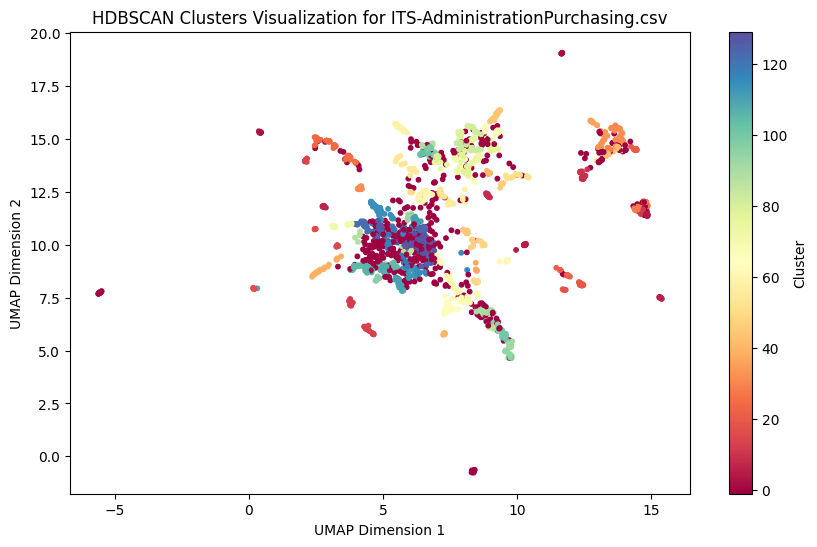

Number of clusters found in ITS-AdministrationPurchasing.csv: 130
Cluster
-1      508
 127     63
 114     60
 63      40
 58      32
       ... 
 42       5
 29       5
 46       5
 38       5
 85       5
Name: count, Length: 131, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AdministrationPurchasing.csv

Processing: ITS-AdministrativeSystemsTraining(MyLINC).csv
Embedding column: Title


Batches: 100%|██████████| 143/143 [00:07<00:00, 17.91it/s]


Embedding column: Servicename


Batches: 100%|██████████| 143/143 [00:06<00:00, 23.09it/s]


Embedding column: Description


Batches: 100%|██████████| 143/143 [00:38<00:00,  3.72it/s]


Embedding column: Feed


Batches: 100%|██████████| 143/143 [01:21<00:00,  1.75it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


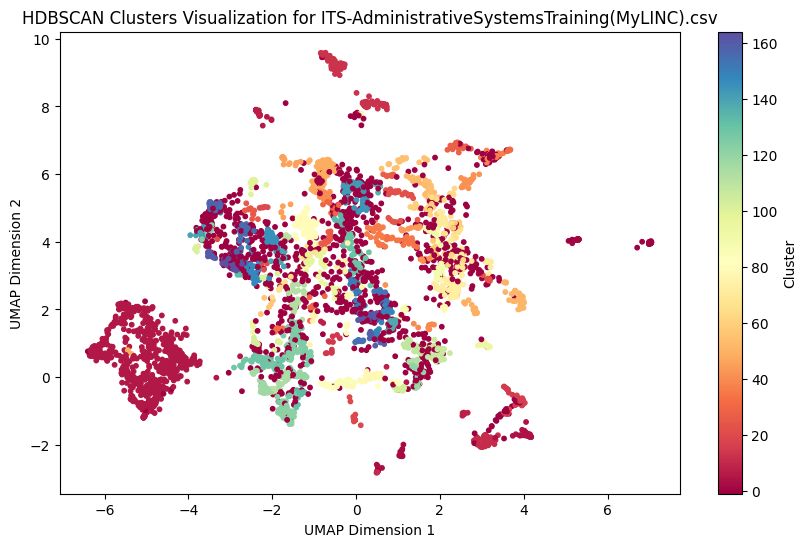

Number of clusters found in ITS-AdministrativeSystemsTraining(MyLINC).csv: 165
Cluster
-1      1121
 5       678
 13       88
 79       85
 48       83
        ... 
 109       5
 62        5
 50        5
 45        5
 61        5
Name: count, Length: 166, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AdministrativeSystemsTraining(MyLINC).csv

Processing: ITS-AmazonWebServicesatU-M(AWS).csv
Embedding column: Title


Batches: 100%|██████████| 10/10 [00:00<00:00, 16.62it/s]


Embedding column: Servicename


Batches: 100%|██████████| 10/10 [00:00<00:00, 24.20it/s]


Embedding column: Description


Batches: 100%|██████████| 10/10 [00:04<00:00,  2.18it/s]


Embedding column: Feed


Batches: 100%|██████████| 10/10 [00:04<00:00,  2.15it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


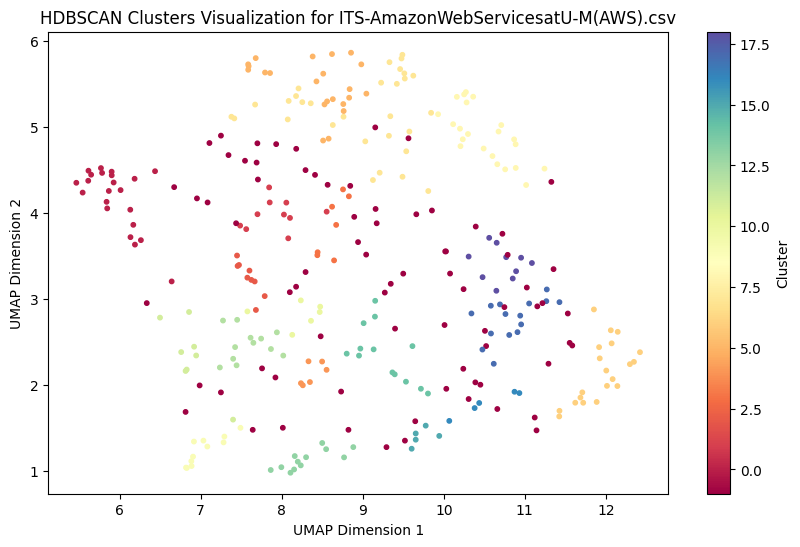

Number of clusters found in ITS-AmazonWebServicesatU-M(AWS).csv: 19
Cluster
-1     75
 7     30
 5     22
 8     22
 0     22
 6     20
 17    15
 14    13
 12    12
 13    12
 9     11
 1     10
 18    10
 2      9
 11     8
 3      7
 4      6
 10     6
 15     5
 16     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AmazonWebServicesatU-M(AWS).csv

Processing: ITS-AmazonWebServicesatU-M(AWS)AccountRequests.csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 28.37it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 21.18it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:00<00:00,  5.18it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


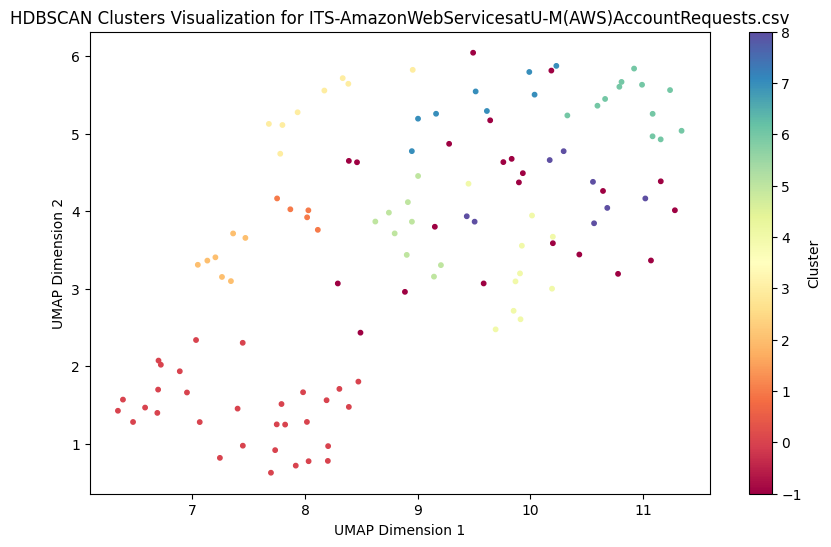

Number of clusters found in ITS-AmazonWebServicesatU-M(AWS)AccountRequests.csv: 9
Cluster
 0    31
-1    22
 6    12
 4    10
 5     9
 7     8
 3     8
 8     8
 2     7
 1     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AmazonWebServicesatU-M(AWS)AccountRequests.csv

Processing: ITS-AndrewFileSystem(AFS).csv
Embedding column: Title


Batches: 100%|██████████| 23/23 [00:01<00:00, 16.87it/s]


Embedding column: Servicename


Batches: 100%|██████████| 23/23 [00:01<00:00, 15.17it/s]


Embedding column: Description


Batches: 100%|██████████| 23/23 [00:06<00:00,  3.77it/s]


Embedding column: Feed


Batches: 100%|██████████| 23/23 [00:12<00:00,  1.80it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


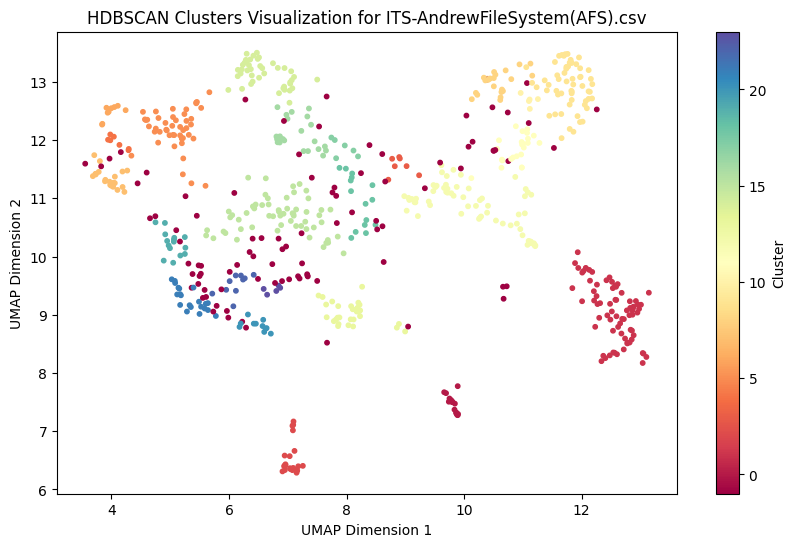

Number of clusters found in ITS-AndrewFileSystem(AFS).csv: 24
Cluster
-1     94
 1     75
 12    62
 15    59
 9     58
 5     46
 14    42
 13    30
 11    24
 8     23
 16    22
 2     22
 7     21
 21    21
 0     16
 19    15
 18    15
 20    11
 22    10
 6      9
 4      7
 3      7
 17     6
 10     5
 23     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AndrewFileSystem(AFS).csv

Processing: ITS-AndrewFileSystem(AFS)GroupsRequest.csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 24.84it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 27.40it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:00<00:00,  5.66it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:01<00:00,  3.01it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


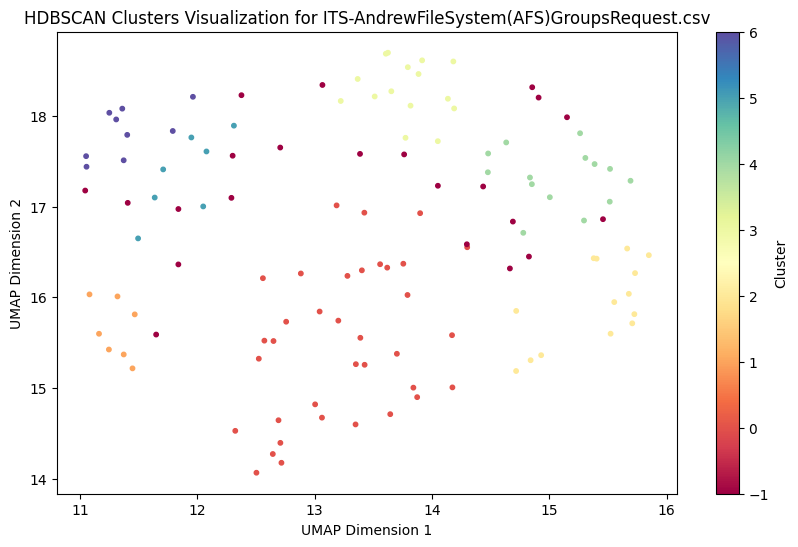

Number of clusters found in ITS-AndrewFileSystem(AFS)GroupsRequest.csv: 7
Cluster
 0    36
-1    22
 3    15
 2    14
 4    14
 6     9
 1     7
 5     7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AndrewFileSystem(AFS)GroupsRequest.csv

Processing: ITS-APIDirectory.csv
Embedding column: Title


Batches: 100%|██████████| 12/12 [00:01<00:00, 11.68it/s]


Embedding column: Servicename


Batches: 100%|██████████| 12/12 [00:00<00:00, 19.61it/s]


Embedding column: Description


Batches: 100%|██████████| 12/12 [00:03<00:00,  3.08it/s]


Embedding column: Feed


Batches: 100%|██████████| 12/12 [00:06<00:00,  1.95it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


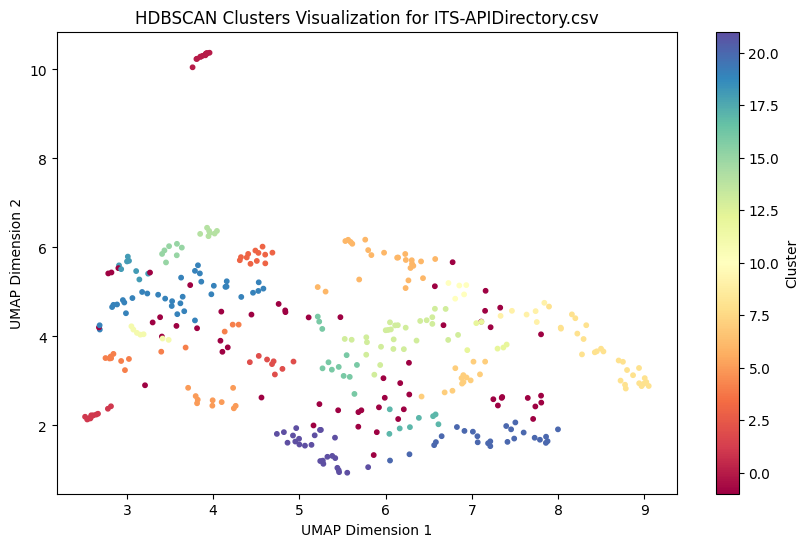

Number of clusters found in ITS-APIDirectory.csv: 22
Cluster
-1     57
 19    35
 8     27
 13    27
 21    25
 20    25
 6     24
 7     13
 4     13
 3     12
 16    12
 0     12
 1     11
 5     10
 17     8
 18     8
 2      8
 15     7
 11     7
 14     7
 9      6
 12     6
 10     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-APIDirectory.csv

Processing: ITS-APIDirectoryAccessRequest.csv
Embedding column: Title


Batches: 100%|██████████| 8/8 [00:00<00:00, 16.00it/s]


Embedding column: Servicename


Batches: 100%|██████████| 8/8 [00:00<00:00, 20.74it/s]


Embedding column: Description


Batches: 100%|██████████| 8/8 [00:01<00:00,  5.67it/s]


Embedding column: Feed


Batches: 100%|██████████| 8/8 [00:03<00:00,  2.07it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


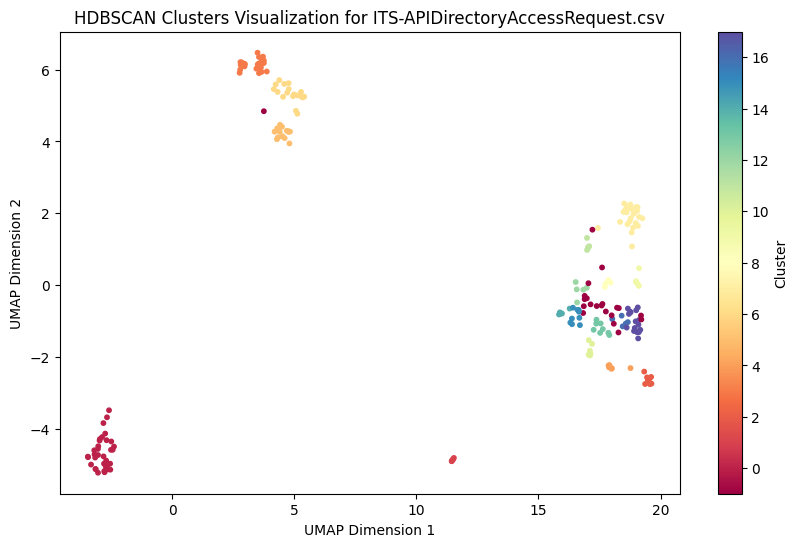

Number of clusters found in ITS-APIDirectoryAccessRequest.csv: 18
Cluster
 0     35
 3     24
 7     24
-1     21
 6     19
 17    16
 5     15
 2     10
 15     9
 13     8
 4      6
 1      6
 10     6
 12     5
 9      5
 16     5
 14     5
 8      5
 11     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-APIDirectoryAccessRequest.csv

Processing: ITS-ARC-ExportControlledSoftwareAgreement.csv
Skipping ITS-ARC-ExportControlledSoftwareAgreement.csv (no valid data after dropping NaNs)

Processing: ITS-ARC-UMRCP.csv
Embedding column: Title


Batches: 100%|██████████| 28/28 [00:01<00:00, 24.10it/s]


Embedding column: Servicename


Batches: 100%|██████████| 28/28 [00:00<00:00, 31.03it/s]


Embedding column: Description


Batches: 100%|██████████| 28/28 [00:15<00:00,  1.77it/s]


Embedding column: Feed


Batches: 100%|██████████| 28/28 [00:16<00:00,  1.72it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


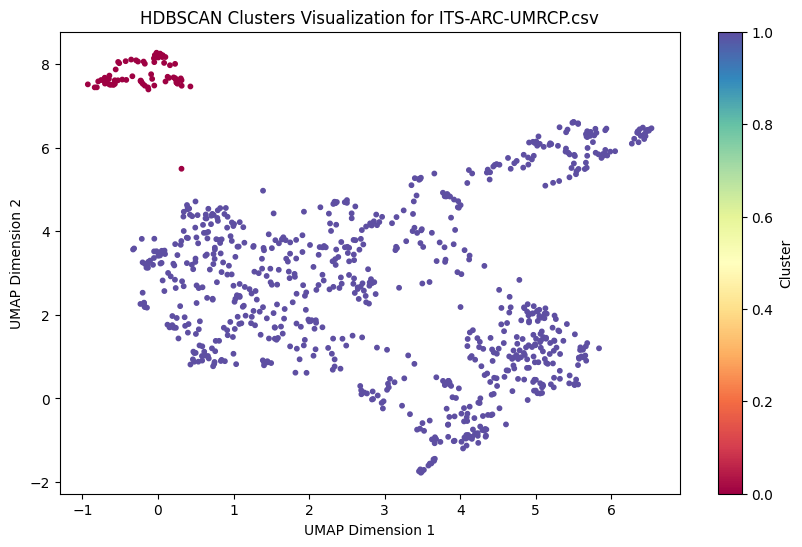

Number of clusters found in ITS-ARC-UMRCP.csv: 2
Cluster
1    800
0     73
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ARC-UMRCP.csv

Processing: ITS-ARC.csv
Embedding column: Title


Batches: 100%|██████████| 255/255 [00:14<00:00, 17.22it/s]


Embedding column: Servicename


Batches: 100%|██████████| 255/255 [00:07<00:00, 34.12it/s]


Embedding column: Description


Batches: 100%|██████████| 255/255 [01:57<00:00,  2.17it/s]


Embedding column: Feed


Batches: 100%|██████████| 255/255 [02:09<00:00,  1.97it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


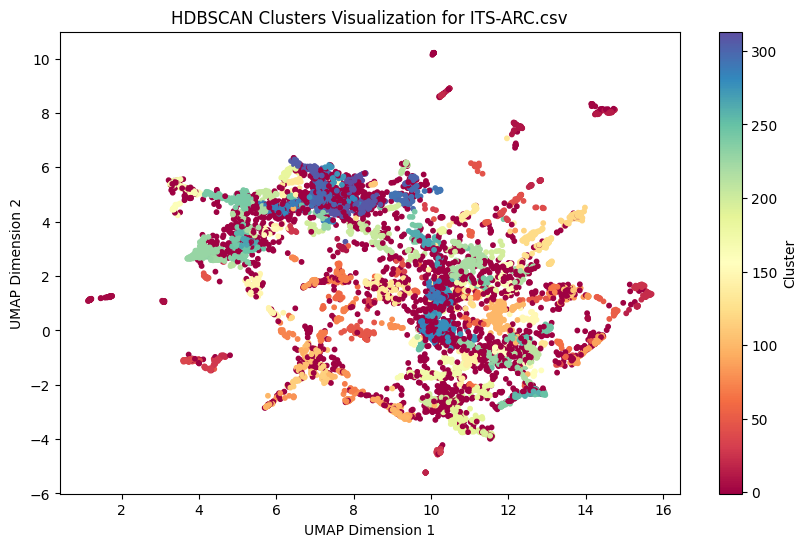

Number of clusters found in ITS-ARC.csv: 314
Cluster
-1      2439
 99      197
 228     170
 241     162
 219     158
        ... 
 49        5
 40        5
 55        5
 101       5
 29        5
Name: count, Length: 315, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ARC.csv

Processing: ITS-ARCAccount.csv
Embedding column: Title


Batches: 100%|██████████| 21/21 [00:00<00:00, 35.03it/s]


Embedding column: Servicename


Batches: 100%|██████████| 21/21 [00:00<00:00, 39.30it/s]


Embedding column: Description


Batches: 100%|██████████| 21/21 [00:01<00:00, 16.31it/s]


Embedding column: Feed


Batches: 100%|██████████| 21/21 [00:11<00:00,  1.90it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


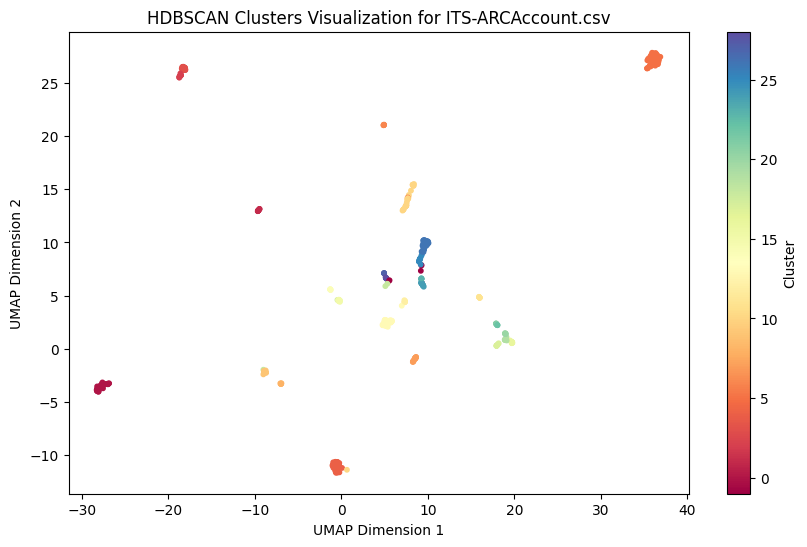

Number of clusters found in ITS-ARCAccount.csv: 29
Cluster
 5     119
 4      92
 13     51
 26     47
 0      44
 10     37
 3      35
 9      22
 7      22
 15     18
 24     18
 1      15
 25     14
 16     13
 2      11
 17     10
 12      9
 6       8
 20      8
 11      8
 28      8
 19      7
 8       7
 23      7
 14      6
-1       6
 22      5
 27      5
 21      5
 18      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ARCAccount.csv

Processing: ITS-ARCLogin.csv
Embedding column: Title


Batches: 100%|██████████| 258/258 [00:07<00:00, 33.41it/s]


Embedding column: Servicename


Batches: 100%|██████████| 258/258 [00:08<00:00, 30.16it/s]


Embedding column: Description


Batches: 100%|██████████| 258/258 [00:18<00:00, 14.31it/s]


Embedding column: Feed


Batches: 100%|██████████| 258/258 [02:40<00:00,  1.60it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


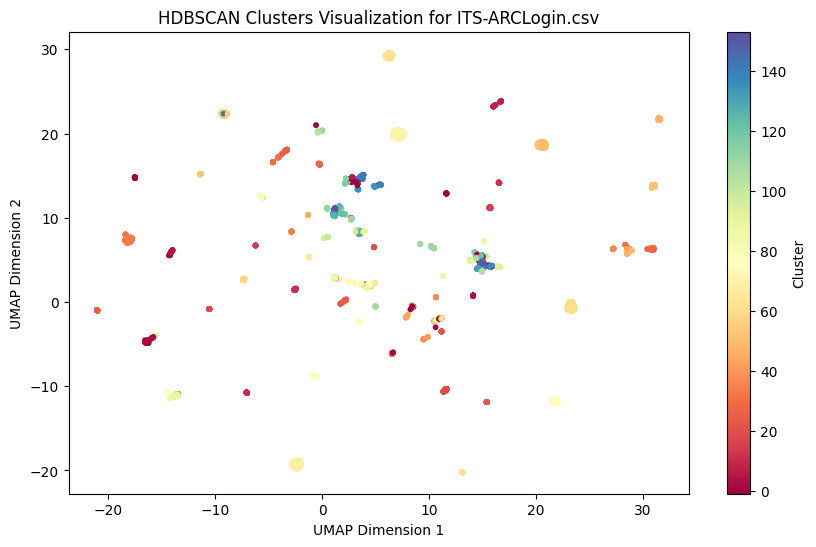

Number of clusters found in ITS-ARCLogin.csv: 154
Cluster
68     720
50     601
70     543
62     529
60     524
      ... 
111      5
153      5
32       5
6        5
141      5
Name: count, Length: 155, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ARCLogin.csv

Processing: ITS-Armis2(HIPAA-AlignedSlurmCluster).csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 13.87it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 12.49it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.65it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


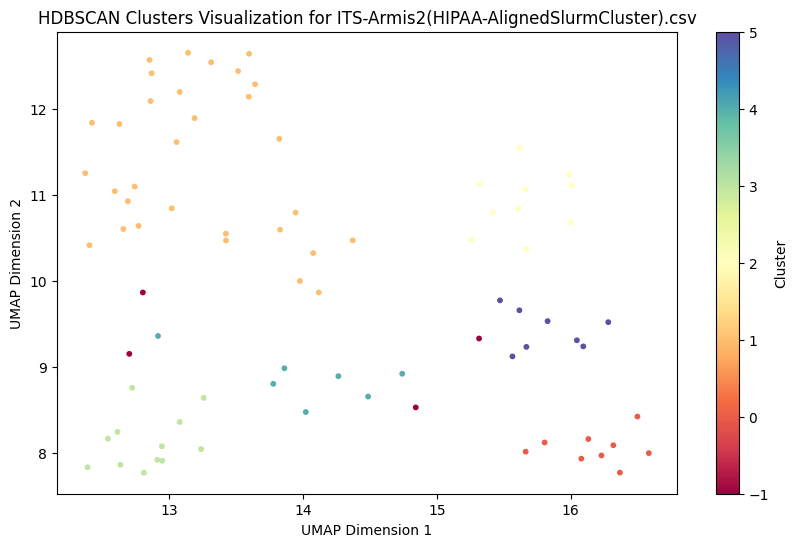

Number of clusters found in ITS-Armis2(HIPAA-AlignedSlurmCluster).csv: 6
Cluster
 1    31
 3    12
 2    10
 0     9
 5     8
 4     7
-1     4
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Armis2(HIPAA-AlignedSlurmCluster).csv

Processing: ITS-ArtificialIntelligence(AI).csv
Embedding column: Title


Batches: 100%|██████████| 58/58 [00:03<00:00, 15.08it/s]


Embedding column: Servicename


Batches: 100%|██████████| 58/58 [00:02<00:00, 28.39it/s]


Embedding column: Description


Batches: 100%|██████████| 58/58 [00:19<00:00,  2.96it/s]


Embedding column: Feed


Batches: 100%|██████████| 58/58 [00:31<00:00,  1.85it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


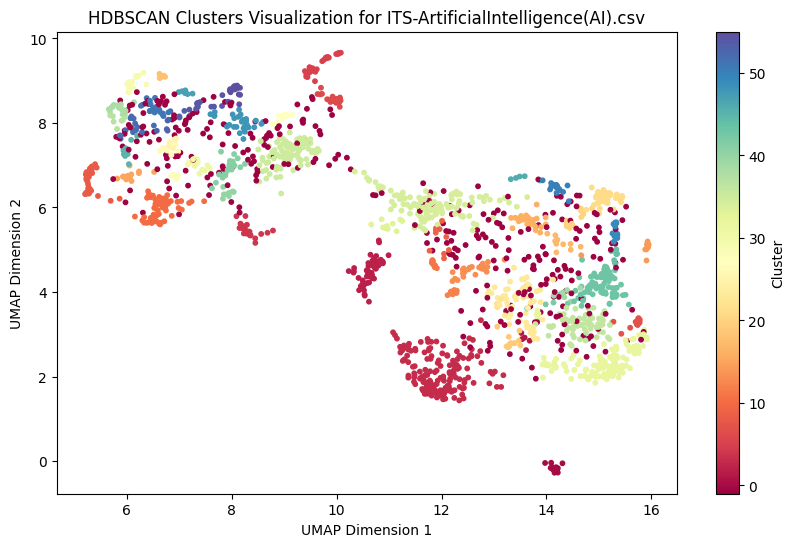

Number of clusters found in ITS-ArtificialIntelligence(AI).csv: 56
Cluster
-1     331
 3     166
 32    133
 34    120
 35     96
 43     77
 36     67
 10     61
 2      58
 21     52
 23     52
 8      34
 48     33
 5      27
 6      27
 16     26
 4      25
 13     25
 0      22
 41     21
 51     20
 15     20
 50     19
 38     18
 55     16
 52     15
 29     15
 54     14
 49     13
 19     13
 9      11
 12     11
 53     11
 33     11
 20     11
 14     10
 7      10
 17     10
 30      9
 27      9
 45      9
 26      9
 40      8
 11      8
 22      8
 31      7
 37      7
 39      7
 47      7
 44      6
 24      6
 42      5
 28      5
 1       5
 46      5
 18      5
 25      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ArtificialIntelligence(AI).csv

Processing: ITS-AssistiveTechAssistance.csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00, 22.05it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 39.57it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:00<00:00,  2.83it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


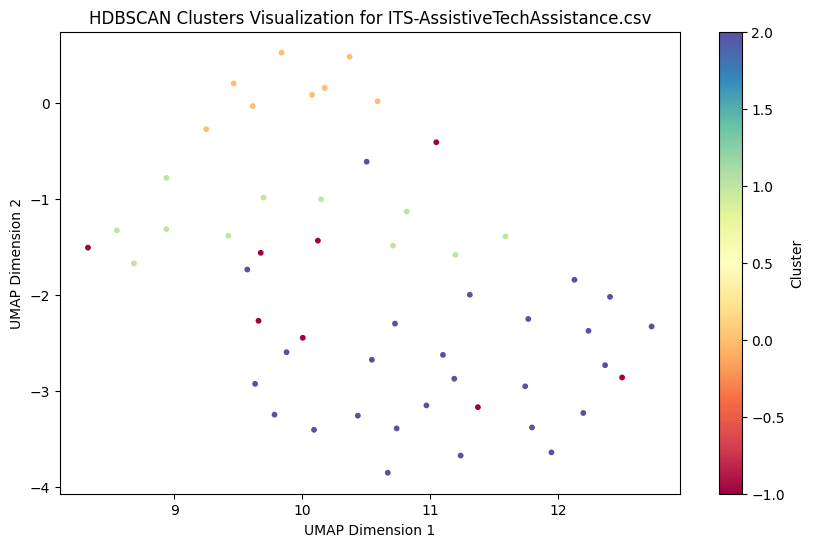

Number of clusters found in ITS-AssistiveTechAssistance.csv: 3
Cluster
 2    26
 1    11
-1     8
 0     8
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AssistiveTechAssistance.csv

Processing: ITS-AUDGeneralService.csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 37.48it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


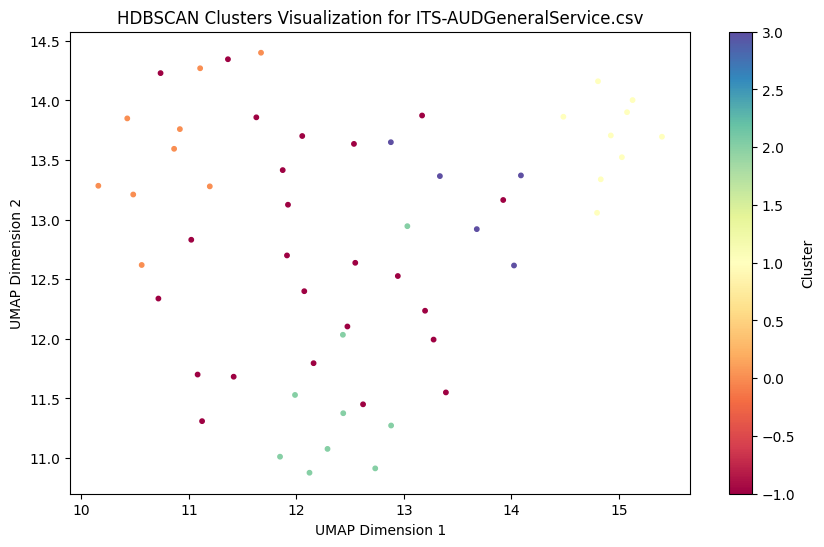

Number of clusters found in ITS-AUDGeneralService.csv: 4
Cluster
-1    24
 0     9
 2     9
 1     9
 3     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AUDGeneralService.csv

Processing: ITS-Audiovisual(AV)Service.csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 10.04it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 14.93it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:01<00:00,  3.12it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:01<00:00,  2.61it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


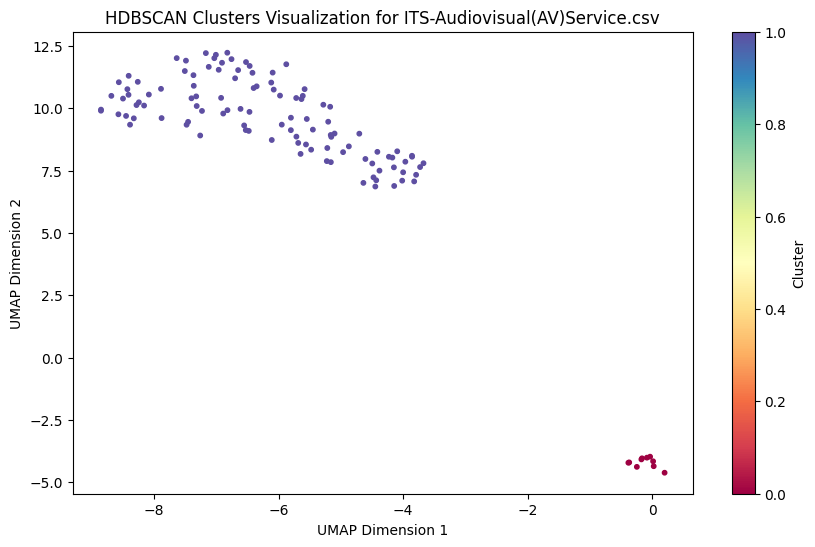

Number of clusters found in ITS-Audiovisual(AV)Service.csv: 2
Cluster
1    108
0     10
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Audiovisual(AV)Service.csv

Processing: ITS-AuthenticatedSMTP.csv
Embedding column: Title


Batches: 100%|██████████| 8/8 [00:00<00:00, 26.07it/s]


Embedding column: Servicename


Batches: 100%|██████████| 8/8 [00:00<00:00, 15.59it/s]


Embedding column: Description


Batches: 100%|██████████| 8/8 [00:02<00:00,  3.31it/s]


Embedding column: Feed


Batches: 100%|██████████| 8/8 [00:02<00:00,  2.94it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


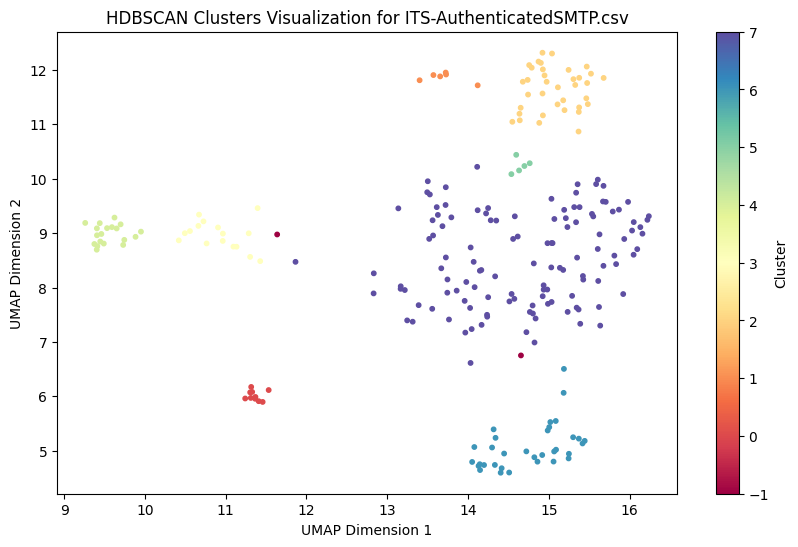

Number of clusters found in ITS-AuthenticatedSMTP.csv: 8
Cluster
 7    122
 2     36
 6     33
 4     19
 3     16
 0     10
 1      6
 5      5
-1      2
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-AuthenticatedSMTP.csv

Processing: ITS-BenefitsAdministrationModule.csv
Embedding column: Title


Batches: 100%|██████████| 10/10 [00:00<00:00, 18.65it/s]


Embedding column: Servicename


Batches: 100%|██████████| 10/10 [00:00<00:00, 17.45it/s]


Embedding column: Description


Batches: 100%|██████████| 10/10 [00:03<00:00,  3.26it/s]


Embedding column: Feed


Batches: 100%|██████████| 10/10 [00:05<00:00,  1.90it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


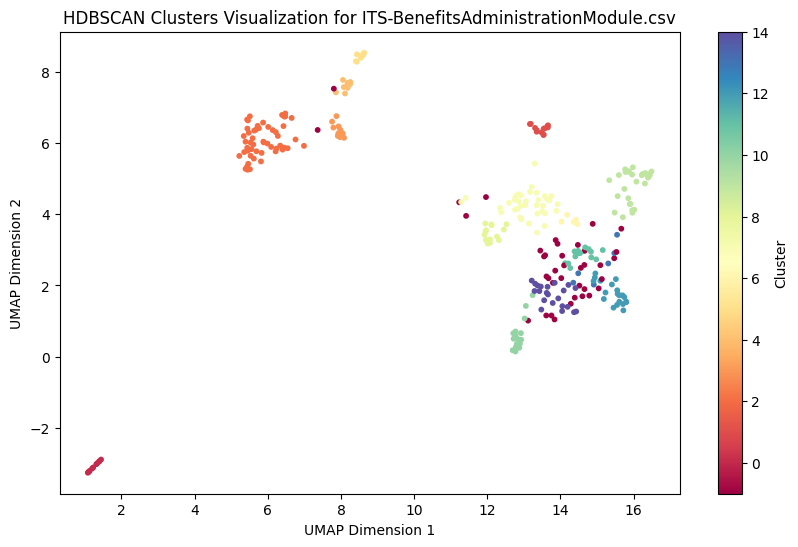

Number of clusters found in ITS-BenefitsAdministrationModule.csv: 15
Cluster
 2     52
-1     38
 7     37
 9     29
 14    22
 12    20
 10    17
 11    14
 8     14
 1     13
 3     12
 0     11
 4     10
 5      9
 13     6
 6      6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-BenefitsAdministrationModule.csv

Processing: ITS-BeyondTrust.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 22.17it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 52.65it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


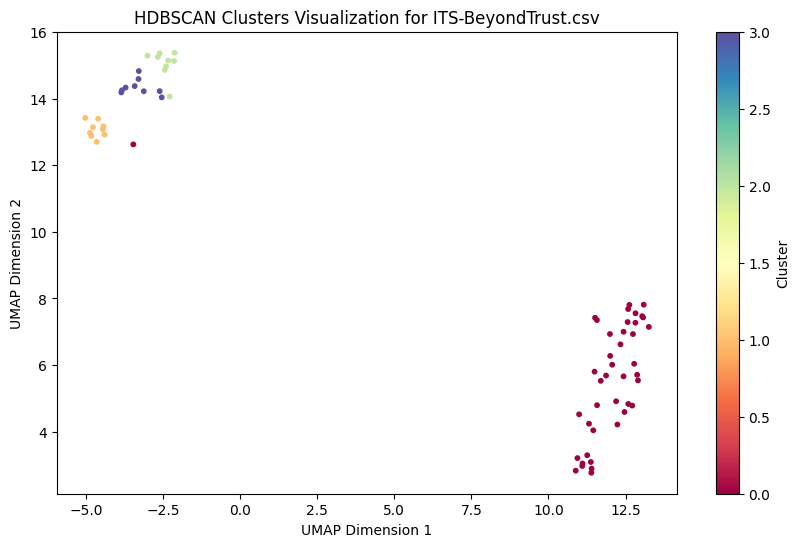

Number of clusters found in ITS-BeyondTrust.csv: 4
Cluster
0    42
3     9
2     9
1     9
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-BeyondTrust.csv

Processing: ITS-BlueCat.csv
Embedding column: Title


Batches: 100%|██████████| 5/5 [00:00<00:00,  9.43it/s]


Embedding column: Servicename


Batches: 100%|██████████| 5/5 [00:00<00:00, 17.79it/s]


Embedding column: Description


Batches: 100%|██████████| 5/5 [00:01<00:00,  2.66it/s]


Embedding column: Feed


Batches: 100%|██████████| 5/5 [00:02<00:00,  1.94it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


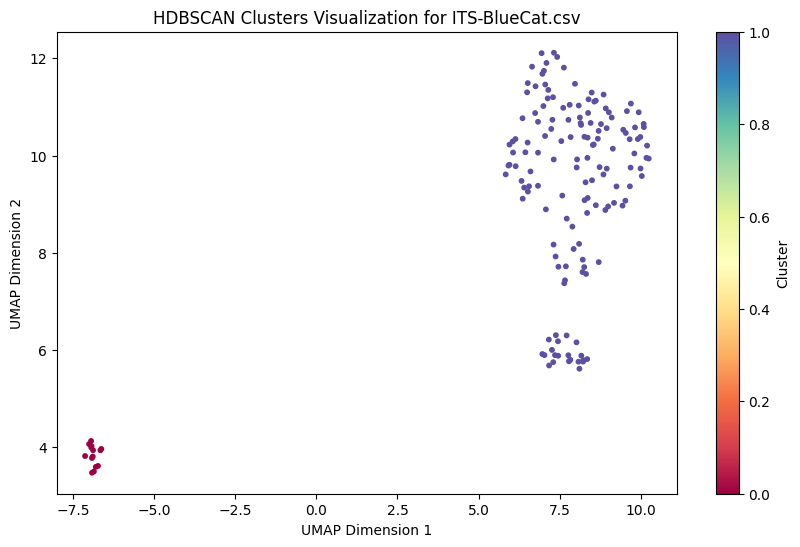

Number of clusters found in ITS-BlueCat.csv: 2
Cluster
1    145
0     14
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-BlueCat.csv

Processing: ITS-BusinessObjects.csv
Embedding column: Title


Batches: 100%|██████████| 48/48 [00:03<00:00, 15.58it/s]


Embedding column: Servicename


Batches: 100%|██████████| 48/48 [00:02<00:00, 23.67it/s]


Embedding column: Description


Batches: 100%|██████████| 48/48 [00:15<00:00,  3.06it/s]


Embedding column: Feed


Batches: 100%|██████████| 48/48 [00:28<00:00,  1.71it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


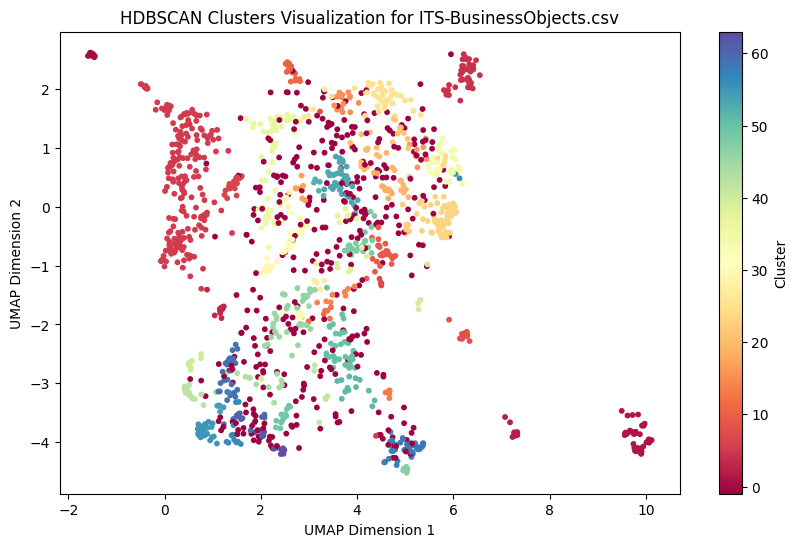

Number of clusters found in ITS-BusinessObjects.csv: 64
Cluster
-1     378
 5     204
 23     53
 1      44
 25     44
      ... 
 24      5
 27      5
 28      5
 52      5
 61      5
Name: count, Length: 65, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-BusinessObjects.csv

Processing: ITS-CableTelevision.csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00, 20.62it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 45.47it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.69it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-CableTelevision.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-CampusCommunityModule.csv
Embedding column: Title


Batches: 100%|██████████| 25/25 [00:01<00:00, 22.96it/s]


Embedding column: Servicename


Batches: 100%|██████████| 25/25 [00:00<00:00, 29.62it/s]


Embedding column: Description


Batches: 100%|██████████| 25/25 [00:09<00:00,  2.66it/s]


Embedding column: Feed


Batches: 100%|██████████| 25/25 [00:13<00:00,  1.80it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


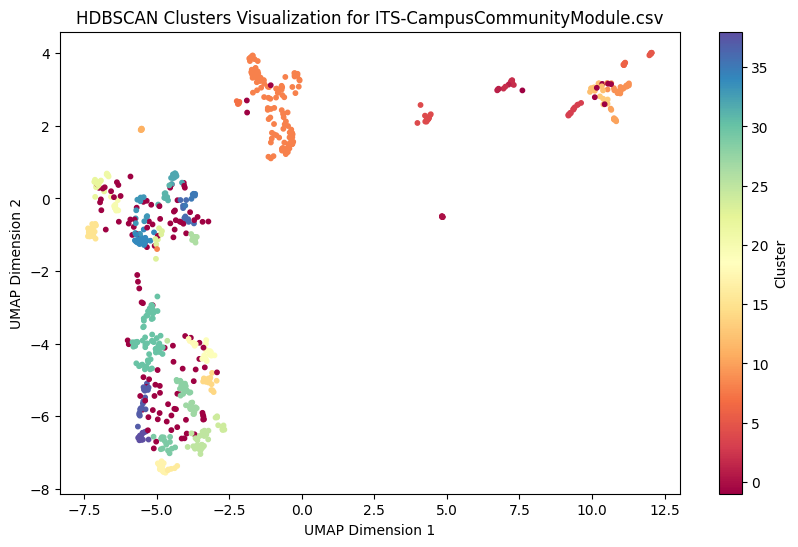

Number of clusters found in ITS-CampusCommunityModule.csv: 39
Cluster
 8     127
-1     125
 30     61
 25     32
 9      24
 15     22
 34     20
 28     20
 4      18
 37     17
 38     16
 17     16
 22     16
 29     15
 3      15
 19     14
 14     14
 27     14
 32     13
 33     13
 26     12
 12     12
 2      12
 36     11
 24     11
 10     10
 5      10
 20     10
 31      9
 0       8
 35      8
 13      8
 23      8
 18      7
 11      7
 7       7
 6       6
 1       5
 16      5
 21      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-CampusCommunityModule.csv

Processing: ITS-CampusComputingSites.csv
Embedding column: Title


Batches: 100%|██████████| 62/62 [00:04<00:00, 13.47it/s]


Embedding column: Servicename


Batches: 100%|██████████| 62/62 [00:01<00:00, 32.89it/s]


Embedding column: Description


Batches: 100%|██████████| 62/62 [00:21<00:00,  2.95it/s]


Embedding column: Feed


Batches: 100%|██████████| 62/62 [00:26<00:00,  2.32it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


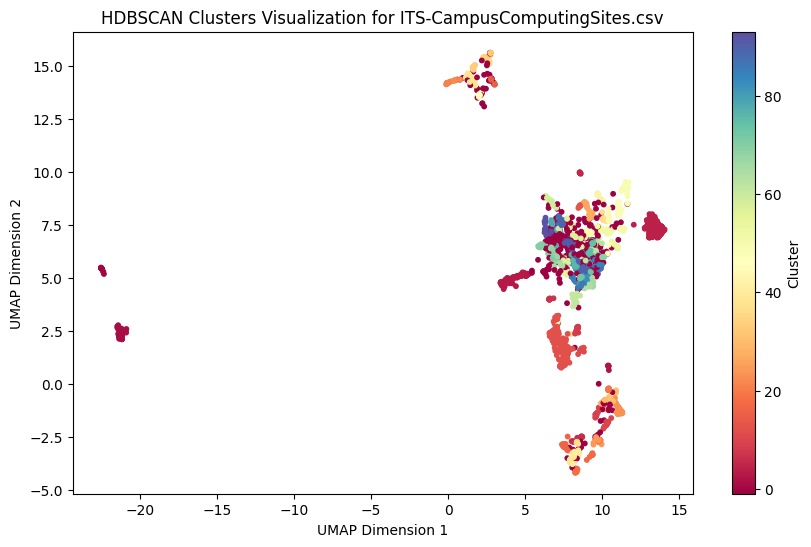

Number of clusters found in ITS-CampusComputingSites.csv: 94
Cluster
-1     325
 12    167
 4     142
 3     109
 1      88
      ... 
 56      5
 55      5
 71      5
 64      5
 30      5
Name: count, Length: 95, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-CampusComputingSites.csv

Processing: ITS-CampusComputingSitesPrinting.csv
Embedding column: Title


Batches: 100%|██████████| 99/99 [00:06<00:00, 14.28it/s]


Embedding column: Servicename


Batches: 100%|██████████| 99/99 [00:03<00:00, 27.57it/s]


Embedding column: Description


Batches: 100%|██████████| 99/99 [00:19<00:00,  5.09it/s]


Embedding column: Feed


Batches: 100%|██████████| 99/99 [00:35<00:00,  2.75it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


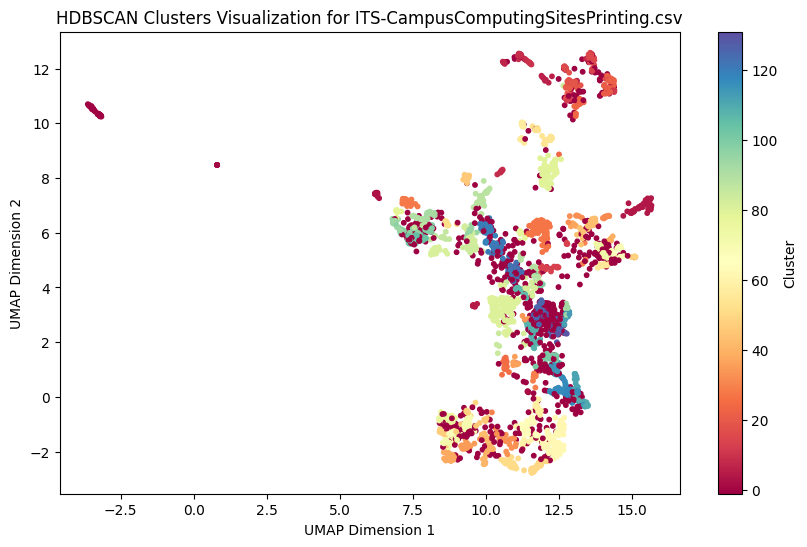

Number of clusters found in ITS-CampusComputingSitesPrinting.csv: 132
Cluster
-1      768
 80     135
 27     102
 79      93
 4       85
       ... 
 85       5
 102      5
 124      5
 87       5
 65       5
Name: count, Length: 133, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-CampusComputingSitesPrinting.csv

Processing: ITS-CampusComputingSitesSoftwareDeploymentRequest.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 29.41it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 28.85it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  5.16it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


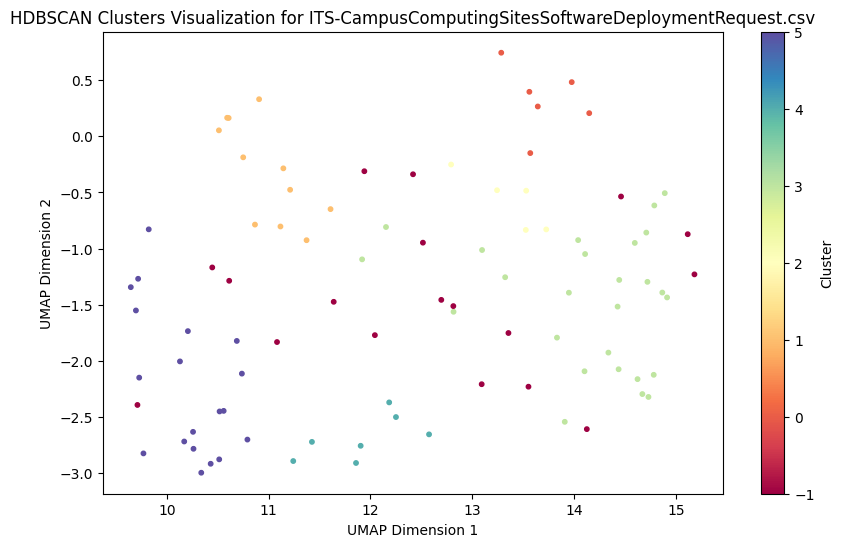

Number of clusters found in ITS-CampusComputingSitesSoftwareDeploymentRequest.csv: 6
Cluster
 3    26
 5    19
-1    18
 1    11
 4     7
 0     6
 2     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-CampusComputingSitesSoftwareDeploymentRequest.csv

Processing: ITS-CampusComputingSitesSoftwareException.csv
Embedding column: Title


Batches: 100%|██████████| 6/6 [00:00<00:00, 15.96it/s]


Embedding column: Servicename


Batches: 100%|██████████| 6/6 [00:00<00:00, 14.02it/s]


Embedding column: Description


Batches: 100%|██████████| 6/6 [00:01<00:00,  4.74it/s]


Embedding column: Feed


Batches: 100%|██████████| 6/6 [00:02<00:00,  2.22it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


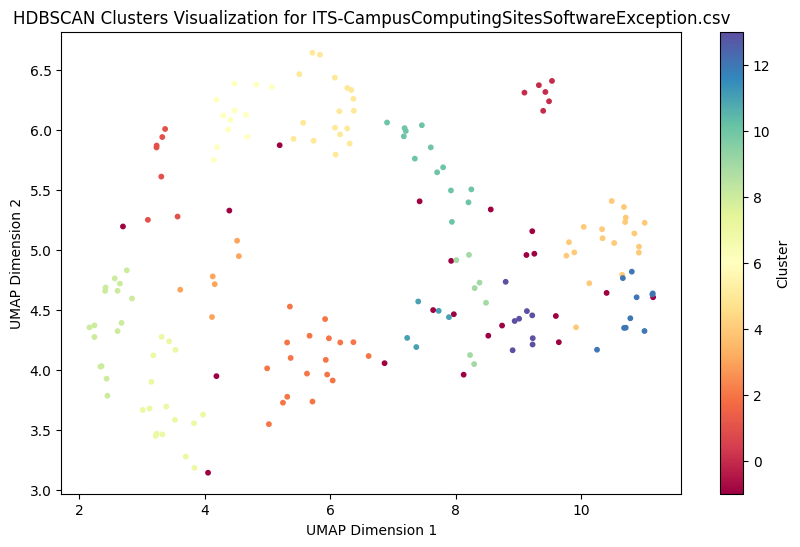

Number of clusters found in ITS-CampusComputingSitesSoftwareException.csv: 14
Cluster
-1     21
 2     18
 4     18
 5     17
 7     16
 8     16
 10    13
 6     12
 12    10
 13     8
 1      7
 9      7
 0      6
 3      6
 11     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-CampusComputingSitesSoftwareException.csv

Processing: ITS-CampusComputingSitesSpaceReservationSystem.csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 30.33it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 28.95it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


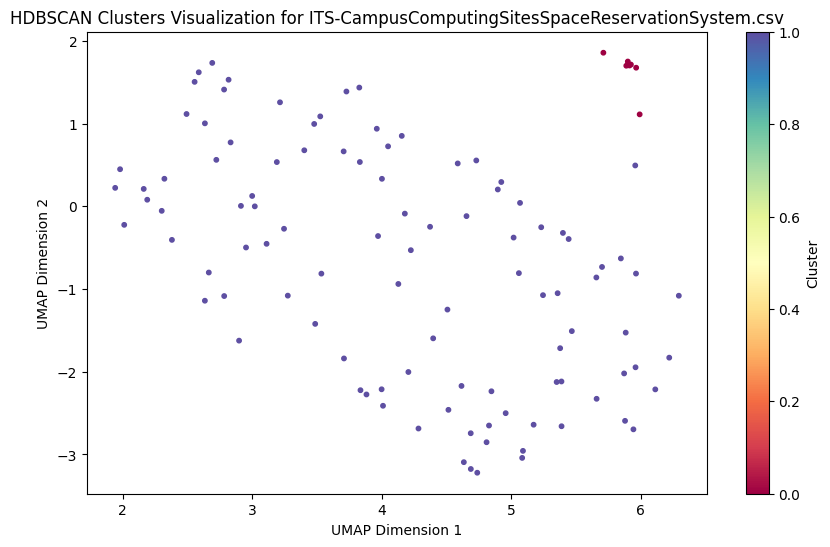

Number of clusters found in ITS-CampusComputingSitesSpaceReservationSystem.csv: 2
Cluster
1    102
0      7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-CampusComputingSitesSpaceReservationSystem.csv

Processing: ITS-Canvas.csv
Embedding column: Title


Batches: 100%|██████████| 292/292 [00:15<00:00, 18.41it/s]


Embedding column: Servicename


Batches: 100%|██████████| 292/292 [00:09<00:00, 32.11it/s]


Embedding column: Description


Batches: 100%|██████████| 292/292 [01:26<00:00,  3.37it/s]


Embedding column: Feed


Batches: 100%|██████████| 292/292 [02:53<00:00,  1.69it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


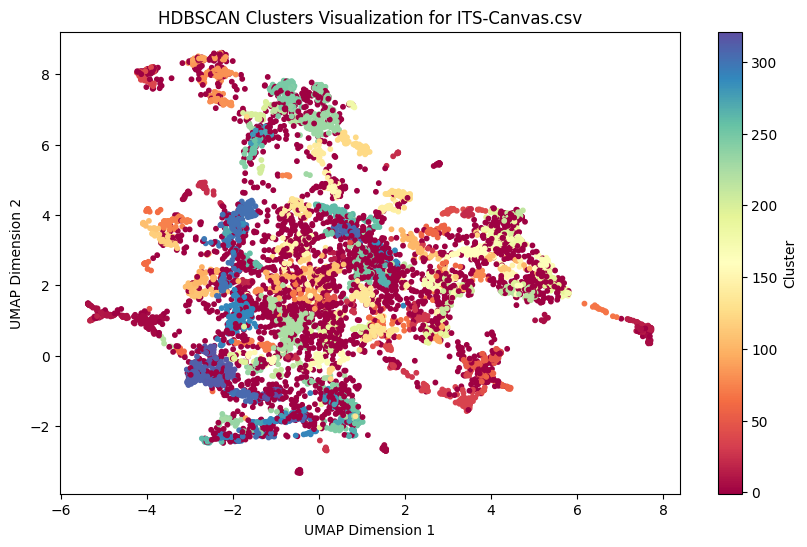

Number of clusters found in ITS-Canvas.csv: 322
Cluster
-1      3302
 224     166
 301     159
 231     152
 289     139
        ... 
 164       5
 312       5
 279       5
 316       5
 197       5
Name: count, Length: 323, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Canvas.csv

Processing: ITS-CanvasCatalog.csv
Embedding column: Title


Batches: 100%|██████████| 7/7 [00:00<00:00, 12.80it/s]


Embedding column: Servicename


Batches: 100%|██████████| 7/7 [00:00<00:00, 21.28it/s]


Embedding column: Description


Batches: 100%|██████████| 7/7 [00:02<00:00,  3.27it/s]


Embedding column: Feed


Batches: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


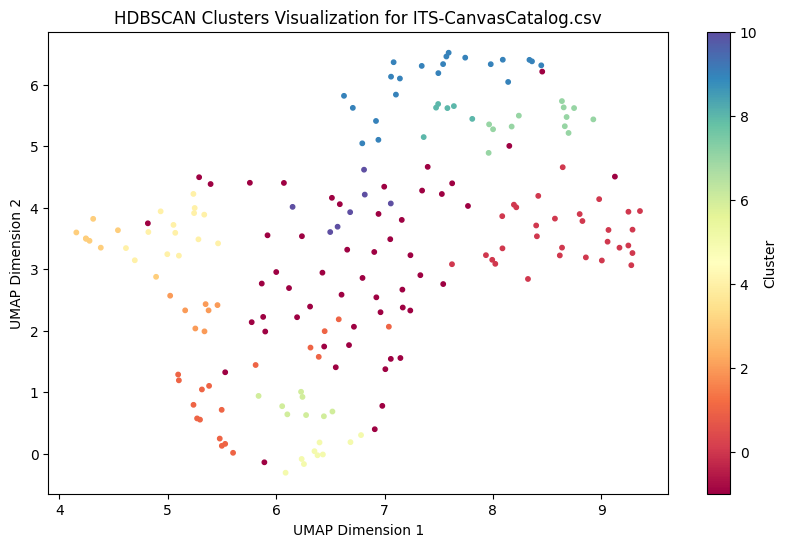

Number of clusters found in ITS-CanvasCatalog.csv: 11
Cluster
-1     53
 0     30
 9     21
 1     18
 4     14
 7     12
 5      9
 3      8
 6      8
 2      7
 10     7
 8      6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-CanvasCatalog.csv

Processing: ITS-CanvasToutRequests.csv
Embedding column: Title


Batches: 100%|██████████| 1/1 [00:00<00:00, 20.00it/s]


Embedding column: Servicename


Batches: 100%|██████████| 1/1 [00:00<00:00, 35.72it/s]

Embedding column: Description



Batches: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


Embedding column: Feed


Batches: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-CanvasToutRequests.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-Cloudflare.csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 14.18it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 38.83it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:01<00:00,  3.09it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:02<00:00,  1.70it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


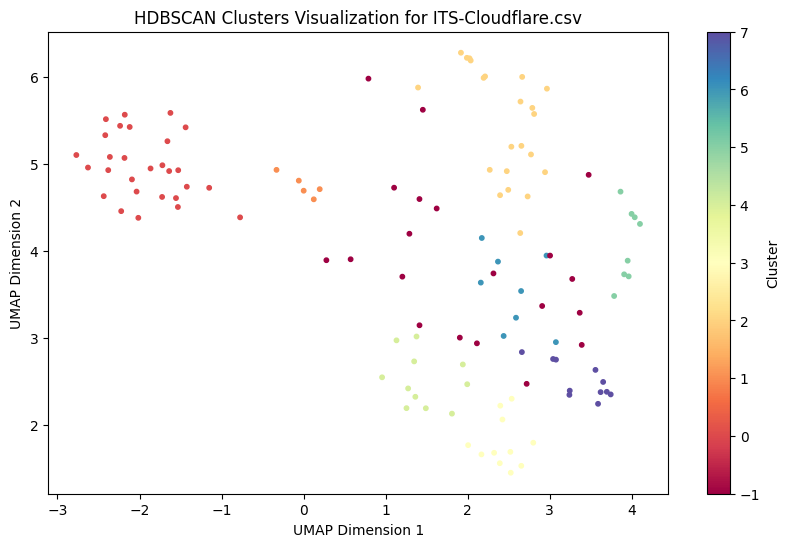

Number of clusters found in ITS-Cloudflare.csv: 8
Cluster
 0    28
 2    22
-1    20
 7    11
 3    11
 4    11
 6     8
 5     8
 1     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Cloudflare.csv

Processing: ITS-Communications.csv
Embedding column: Title


Batches: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]


Embedding column: Servicename


Batches: 100%|██████████| 50/50 [00:01<00:00, 36.25it/s]


Embedding column: Description


Batches: 100%|██████████| 50/50 [00:13<00:00,  3.79it/s]


Embedding column: Feed


Batches: 100%|██████████| 50/50 [00:25<00:00,  2.00it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


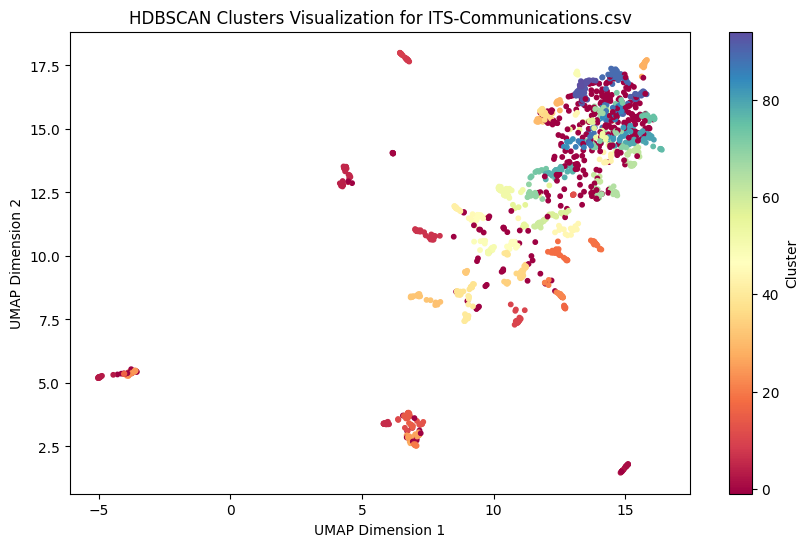

Number of clusters found in ITS-Communications.csv: 95
Cluster
-1     337
 52     38
 89     37
 7      37
 18     35
      ... 
 72      5
 45      5
 87      5
 65      5
 41      5
Name: count, Length: 96, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Communications.csv

Processing: ITS-ContactCenters.csv
Embedding column: Title


Batches: 100%|██████████| 7/7 [00:00<00:00, 23.26it/s]


Embedding column: Servicename


Batches: 100%|██████████| 7/7 [00:00<00:00, 44.03it/s]


Embedding column: Description


Batches: 100%|██████████| 7/7 [00:01<00:00,  3.99it/s]


Embedding column: Feed


Batches: 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


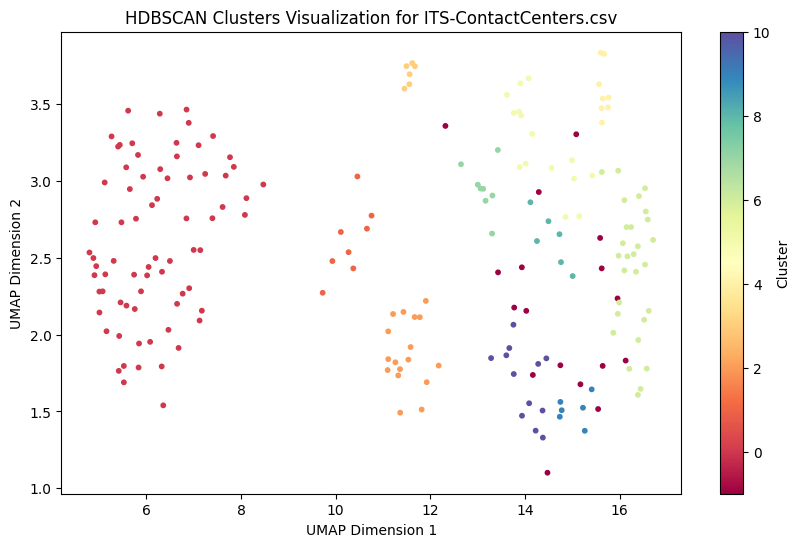

Number of clusters found in ITS-ContactCenters.csv: 11
Cluster
 0     73
 6     28
 2     17
-1     17
 5     15
 10    12
 4      8
 7      8
 1      8
 3      6
 9      6
 8      6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ContactCenters.csv

Processing: ITS-ContainerService.csv
Embedding column: Title


Batches: 100%|██████████| 8/8 [00:00<00:00, 22.99it/s]


Embedding column: Servicename


Batches: 100%|██████████| 8/8 [00:00<00:00, 38.83it/s]


Embedding column: Description


Batches: 100%|██████████| 8/8 [00:03<00:00,  2.18it/s]


Embedding column: Feed


Batches: 100%|██████████| 8/8 [00:04<00:00,  1.97it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


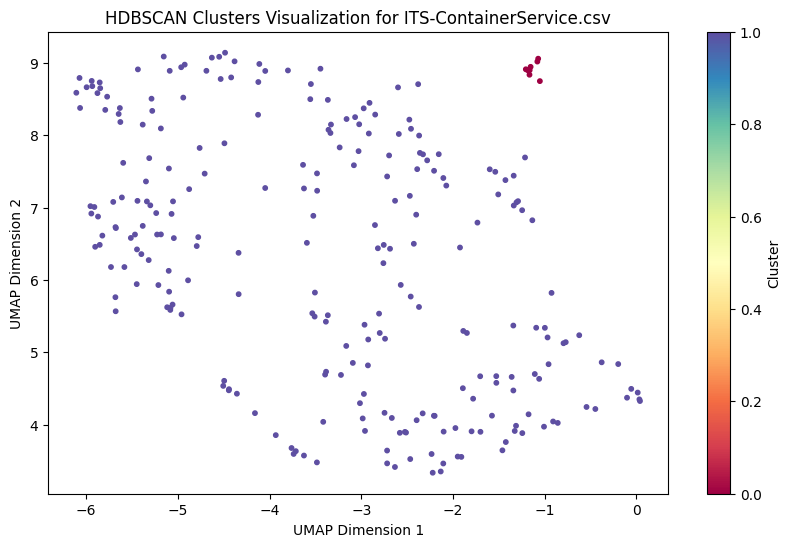

Number of clusters found in ITS-ContainerService.csv: 2
Cluster
1    248
0      8
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ContainerService.csv

Processing: ITS-CoreNetwork(Backbone&CommonEquipment)AnnArbor.csv
Embedding column: Title


Batches: 100%|██████████| 12/12 [00:01<00:00, 10.93it/s]


Embedding column: Servicename


Batches: 100%|██████████| 12/12 [00:00<00:00, 13.59it/s]


Embedding column: Description


Batches: 100%|██████████| 12/12 [00:04<00:00,  2.47it/s]


Embedding column: Feed


Batches: 100%|██████████| 12/12 [00:06<00:00,  1.95it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


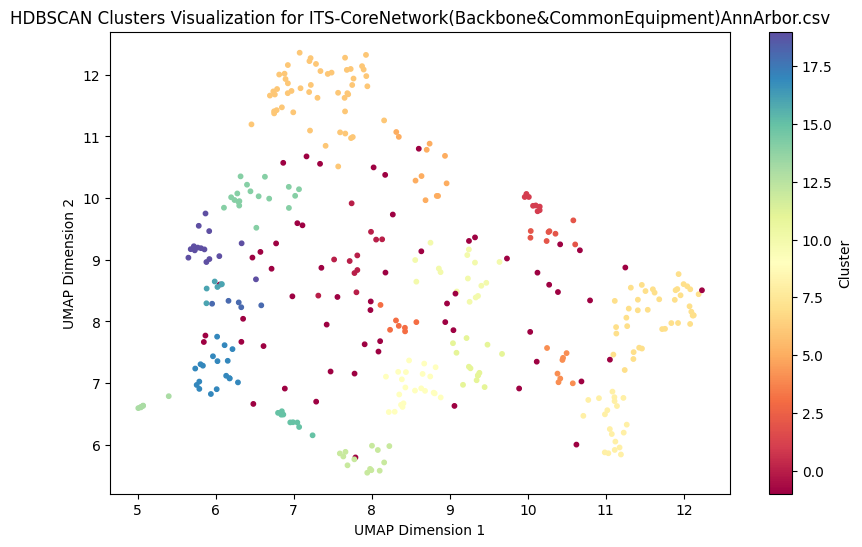

Number of clusters found in ITS-CoreNetwork(Backbone&CommonEquipment)AnnArbor.csv: 20
Cluster
-1     58
 6     51
 7     40
 9     22
 8     20
 14    18
 17    18
 10    16
 19    15
 12    13
 11    13
 0     11
 5     11
 15     9
 2      8
 1      8
 4      8
 3      7
 16     6
 13     6
 18     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-CoreNetwork(Backbone&CommonEquipment)AnnArbor.csv

Processing: ITS-DataCenterAccessRequest.csv
Embedding column: Title


Batches: 100%|██████████| 1/1 [00:00<00:00, 11.09it/s]


Embedding column: Servicename


Batches: 100%|██████████| 1/1 [00:00<00:00, 25.89it/s]


Embedding column: Description


Batches: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


Embedding column: Feed


Batches: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-DataCenterAccessRequest.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-DataCenterEngineering.csv
Embedding column: Title


Batches: 100%|██████████| 17/17 [00:01<00:00, 15.25it/s]


Embedding column: Servicename


Batches: 100%|██████████| 17/17 [00:00<00:00, 22.06it/s]


Embedding column: Description


Batches: 100%|██████████| 17/17 [00:04<00:00,  3.75it/s]


Embedding column: Feed


Batches: 100%|██████████| 17/17 [00:06<00:00,  2.55it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


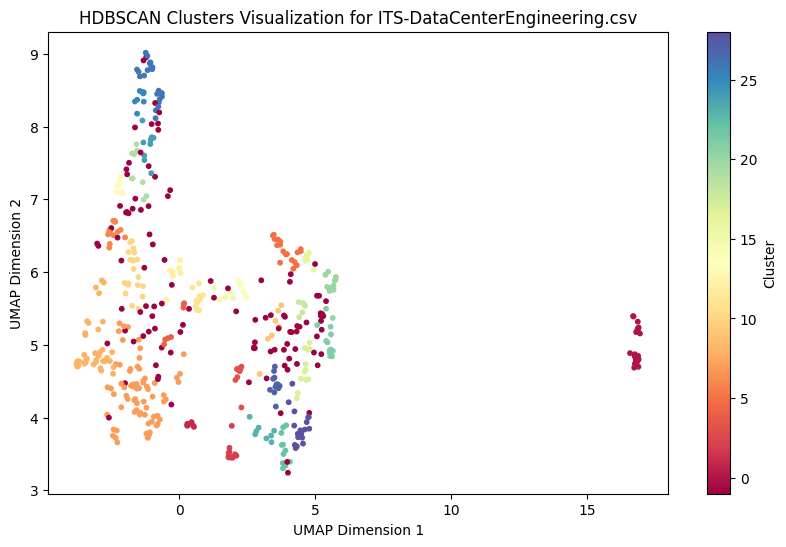

Number of clusters found in ITS-DataCenterEngineering.csv: 29
Cluster
-1     110
 7      71
 8      37
 0      25
 26     21
 10     20
 28     18
 5      18
 6      13
 20     12
 21     12
 2      12
 27     12
 17     12
 22     11
 3      10
 11     10
 19     10
 12      9
 24      9
 23      8
 25      8
 16      8
 4       7
 13      7
 9       7
 14      6
 1       6
 18      5
 15      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DataCenterEngineering.csv

Processing: ITS-DataCenterFirewalls.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 16.31it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 25.65it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


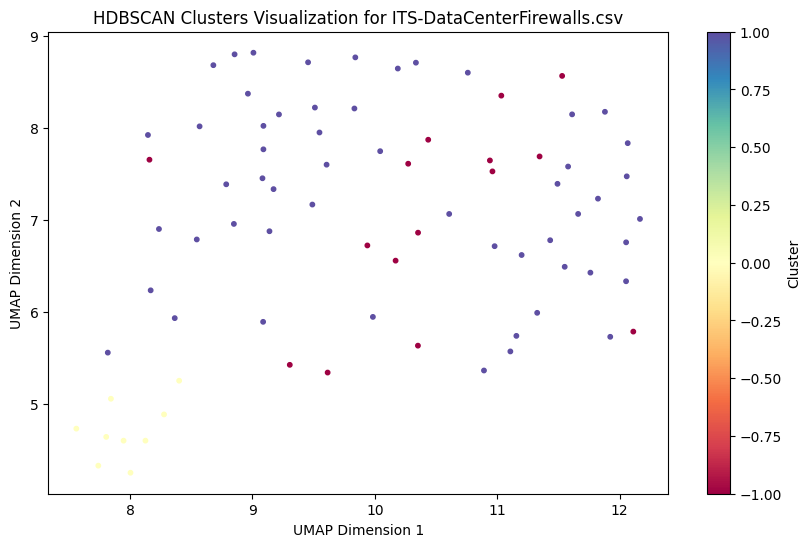

Number of clusters found in ITS-DataCenterFirewalls.csv: 2
Cluster
 1    54
-1    15
 0     9
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DataCenterFirewalls.csv

Processing: ITS-DataCenterOperations.csv
Embedding column: Title


Batches: 100%|██████████| 21/21 [00:02<00:00,  9.69it/s]


Embedding column: Servicename


Batches: 100%|██████████| 21/21 [00:00<00:00, 31.88it/s]


Embedding column: Description


Batches: 100%|██████████| 21/21 [00:09<00:00,  2.31it/s]


Embedding column: Feed


Batches: 100%|██████████| 21/21 [00:05<00:00,  4.15it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


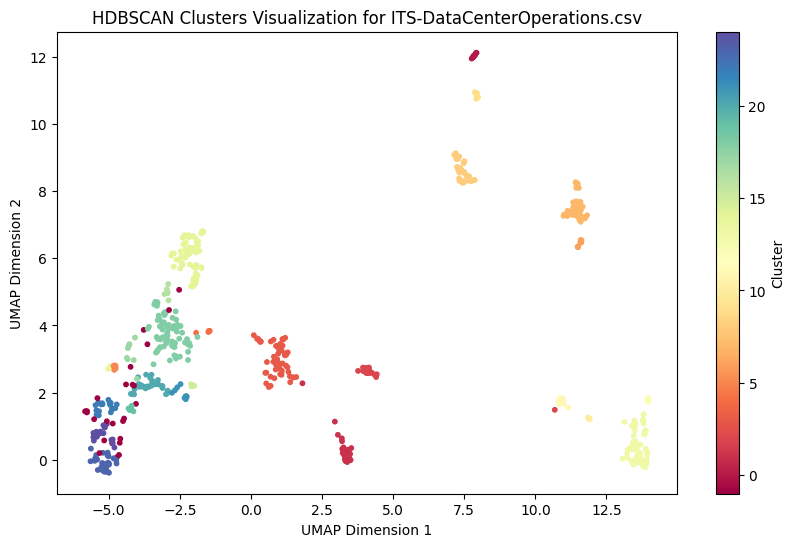

Number of clusters found in ITS-DataCenterOperations.csv: 25
Cluster
 14    72
 18    71
 3     61
 13    60
 7     45
 8     37
 23    34
 1     32
 20    29
-1     27
 2     24
 24    22
 11    19
 22    19
 0     13
 21    10
 9      9
 17     9
 12     8
 6      7
 4      7
 10     6
 16     6
 5      5
 19     5
 15     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DataCenterOperations.csv

Processing: ITS-DataDenResearchArchive.csv
Embedding column: Title


Batches: 100%|██████████| 29/29 [00:01<00:00, 19.26it/s]


Embedding column: Servicename


Batches: 100%|██████████| 29/29 [00:00<00:00, 34.69it/s]


Embedding column: Description


Batches: 100%|██████████| 29/29 [00:13<00:00,  2.16it/s]


Embedding column: Feed


Batches: 100%|██████████| 29/29 [00:06<00:00,  4.26it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


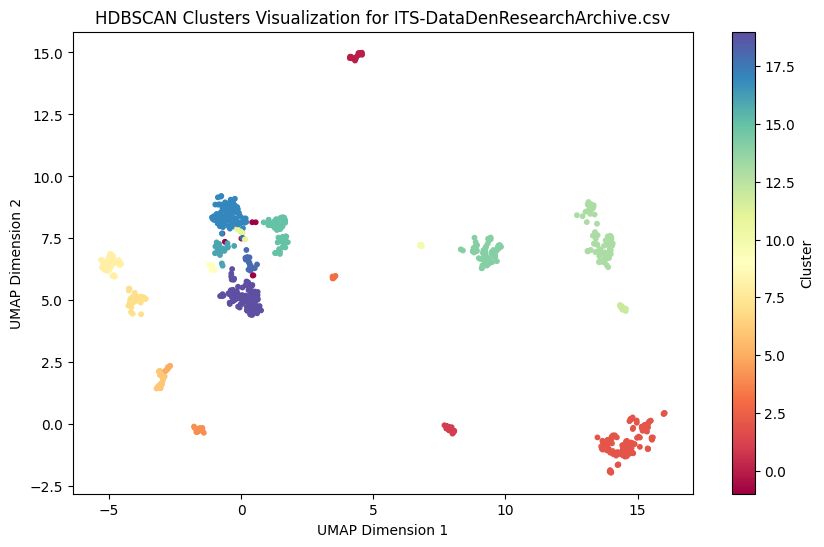

Number of clusters found in ITS-DataDenResearchArchive.csv: 20
Cluster
 2     135
 19    116
 17    107
 13     91
 14     79
 15     72
 8      64
 7      45
 6      28
 1      27
 0      26
 16     23
 4      21
 12     19
 18     17
 3      10
 10      9
 5       9
-1       7
 11      7
 9       6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DataDenResearchArchive.csv

Processing: ITS-DataRequest.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 20.52it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 33.33it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.82it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


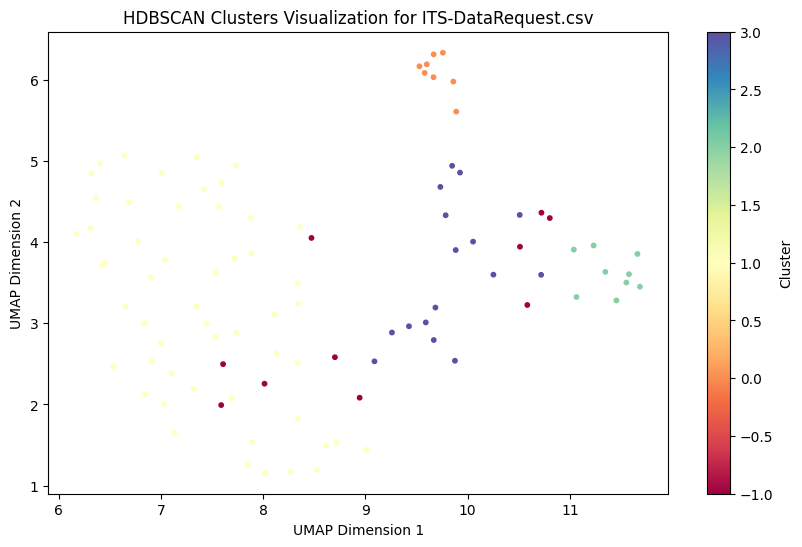

Number of clusters found in ITS-DataRequest.csv: 4
Cluster
 1    53
 3    16
-1    10
 2     9
 0     8
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DataRequest.csv

Processing: ITS-DataScienceConsulting.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 10.83it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 18.18it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:01<00:00,  1.69it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


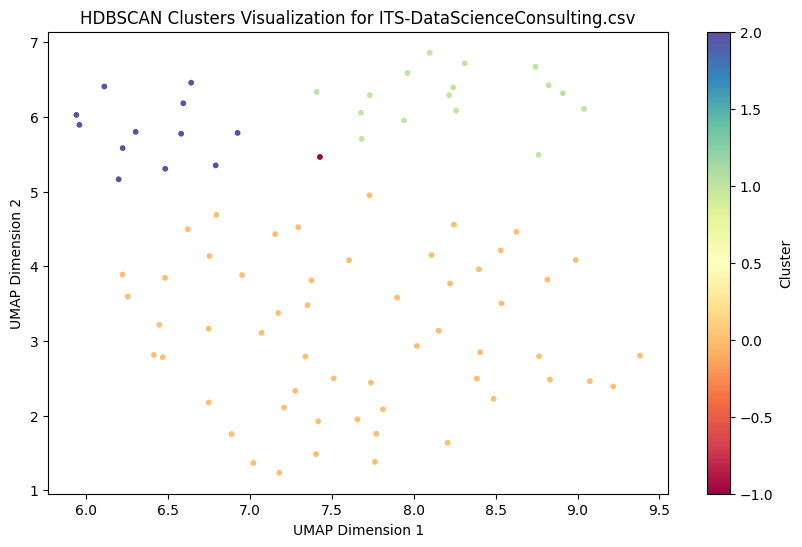

Number of clusters found in ITS-DataScienceConsulting.csv: 3
Cluster
 0    55
 1    16
 2    12
-1     1
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DataScienceConsulting.csv

Processing: ITS-Denodo.csv
Embedding column: Title


Batches: 100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


Embedding column: Servicename


Batches: 100%|██████████| 6/6 [00:00<00:00, 39.47it/s]


Embedding column: Description


Batches: 100%|██████████| 6/6 [00:02<00:00,  2.75it/s]


Embedding column: Feed


Batches: 100%|██████████| 6/6 [00:03<00:00,  1.87it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


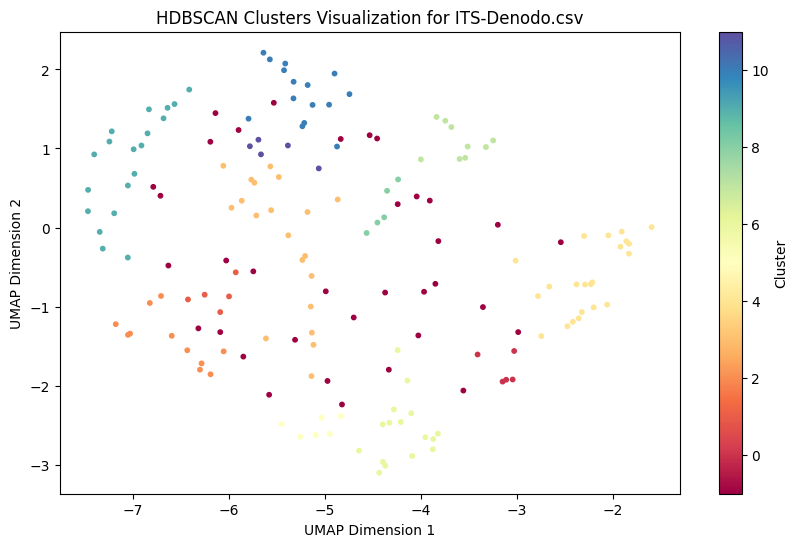

Number of clusters found in ITS-Denodo.csv: 12
Cluster
-1     35
 4     22
 3     20
 9     19
 6     16
 10    15
 2     11
 7      9
 5      6
 11     5
 8      5
 0      5
 1      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Denodo.csv

Processing: ITS-DesktopBackup(Crashplan).csv
Embedding column: Title


Batches: 100%|██████████| 56/56 [00:04<00:00, 13.69it/s]


Embedding column: Servicename


Batches: 100%|██████████| 56/56 [00:02<00:00, 22.92it/s]


Embedding column: Description


Batches: 100%|██████████| 56/56 [00:08<00:00,  6.30it/s]


Embedding column: Feed


Batches: 100%|██████████| 56/56 [00:27<00:00,  2.00it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


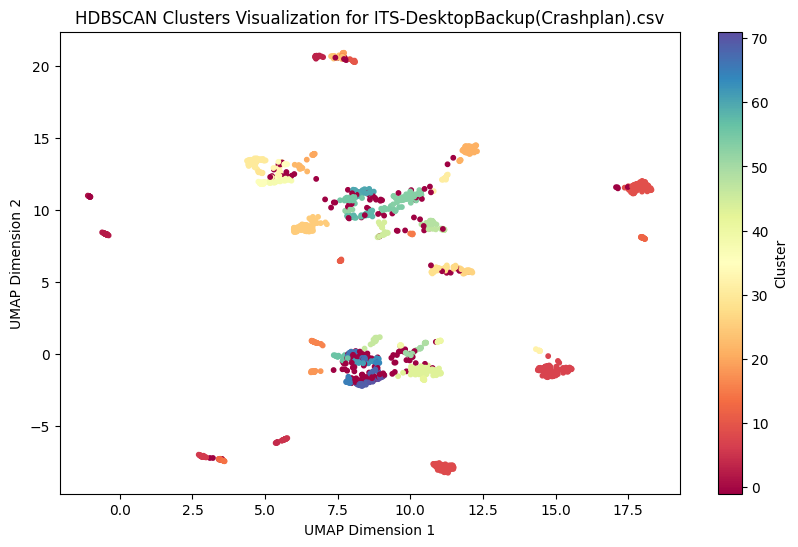

Number of clusters found in ITS-DesktopBackup(Crashplan).csv: 72
Cluster
-1     194
 7     124
 25    109
 9      94
 43     86
      ... 
 64      5
 70      5
 62      5
 1       5
 41      5
Name: count, Length: 73, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DesktopBackup(Crashplan).csv

Processing: ITS-DigitalAccessibility.csv
Embedding column: Title


Batches: 100%|██████████| 15/15 [00:00<00:00, 28.59it/s]


Embedding column: Servicename


Batches: 100%|██████████| 15/15 [00:00<00:00, 34.40it/s]


Embedding column: Description


Batches: 100%|██████████| 15/15 [00:05<00:00,  2.63it/s]


Embedding column: Feed


Batches: 100%|██████████| 15/15 [00:07<00:00,  1.95it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


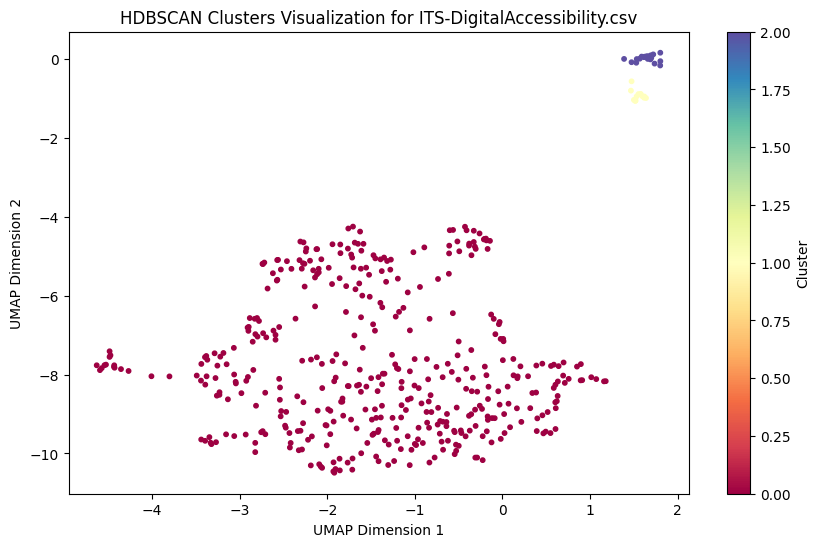

Number of clusters found in ITS-DigitalAccessibility.csv: 3
Cluster
0    423
2     19
1     12
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DigitalAccessibility.csv

Processing: ITS-DigitalAssetCollaborative.csv
Embedding column: Title


Batches: 100%|██████████| 6/6 [00:00<00:00, 25.19it/s]


Embedding column: Servicename


Batches: 100%|██████████| 6/6 [00:00<00:00, 34.63it/s]


Embedding column: Description


Batches: 100%|██████████| 6/6 [00:01<00:00,  4.55it/s]


Embedding column: Feed


Batches: 100%|██████████| 6/6 [00:03<00:00,  1.89it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


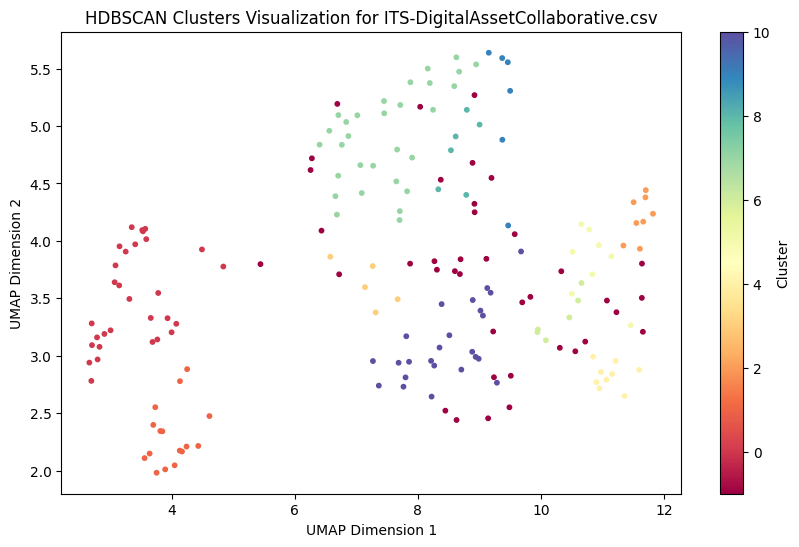

Number of clusters found in ITS-DigitalAssetCollaborative.csv: 11
Cluster
-1     39
 7     30
 0     30
 10    24
 1     16
 4      9
 2      8
 5      8
 6      6
 9      6
 8      6
 3      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DigitalAssetCollaborative.csv

Processing: ITS-DigitalAssetCollaborativeAccessRequest.csv
Embedding column: Title


Batches: 100%|██████████| 1/1 [00:00<00:00, 100.00it/s]


Embedding column: Servicename


Batches: 100%|██████████| 1/1 [00:00<00:00, 99.99it/s]


Embedding column: Description


Batches: 100%|██████████| 1/1 [00:00<00:00, 58.81it/s]


Embedding column: Feed


Batches: 100%|██████████| 1/1 [00:00<00:00, 25.00it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Error processing ITS-DigitalAssetCollaborativeAccessRequest.csv: k must be less than or equal to the number of training points

Processing: ITS-DigitalSignage.csv
Embedding column: Title


Batches: 100%|██████████| 32/32 [00:01<00:00, 23.06it/s]


Embedding column: Servicename


Batches: 100%|██████████| 32/32 [00:01<00:00, 23.81it/s]


Embedding column: Description


Batches: 100%|██████████| 32/32 [00:11<00:00,  2.85it/s]


Embedding column: Feed


Batches: 100%|██████████| 32/32 [00:16<00:00,  1.94it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


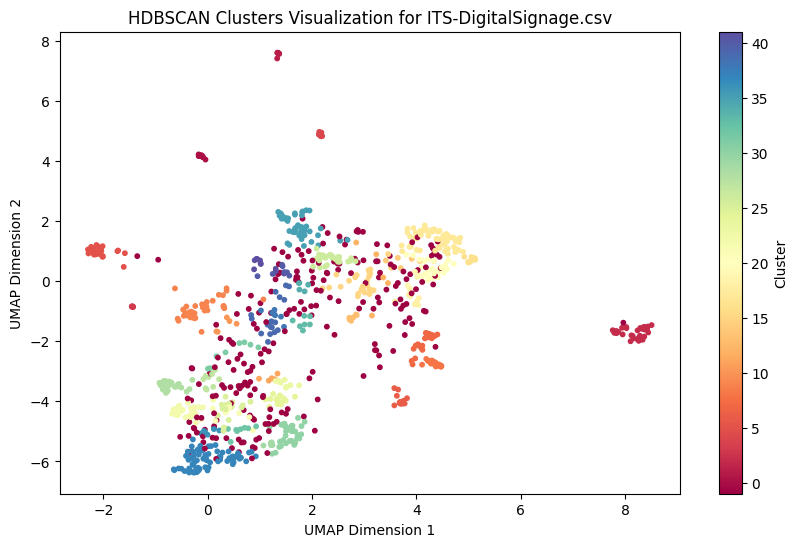

Number of clusters found in ITS-DigitalSignage.csv: 42
Cluster
-1     228
 37     73
 17     65
 35     48
 9      43
 2      39
 5      37
 30     35
 20     32
 26     30
 28     28
 22     27
 15     26
 7      24
 8      21
 39     19
 25     18
 6      17
 24     15
 0      12
 4      11
 1      10
 41     10
 21      9
 27      9
 16      9
 23      8
 38      8
 31      8
 32      8
 18      8
 40      7
 33      7
 36      7
 13      6
 3       6
 19      5
 14      5
 11      5
 29      5
 12      5
 10      5
 34      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DigitalSignage.csv

Processing: ITS-DigitalUXSupport.csv
Embedding column: Title


Batches: 100%|██████████| 37/37 [00:01<00:00, 23.99it/s]


Embedding column: Servicename


Batches: 100%|██████████| 37/37 [00:01<00:00, 29.55it/s]


Embedding column: Description


Batches: 100%|██████████| 37/37 [00:14<00:00,  2.48it/s]


Embedding column: Feed


Batches: 100%|██████████| 37/37 [00:13<00:00,  2.78it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


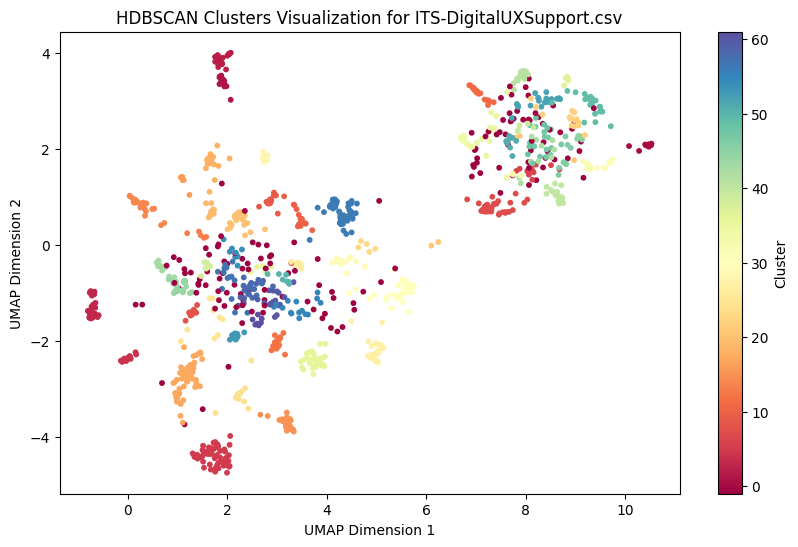

Number of clusters found in ITS-DigitalUXSupport.csv: 62
Cluster
-1     143
 5      61
 17     51
 56     49
 30     39
      ... 
 39      5
 33      5
 45      5
 37      5
 13      5
Name: count, Length: 63, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DigitalUXSupport.csv

Processing: ITS-DocumentImagingSystem.csv
Embedding column: Title


Batches: 100%|██████████| 31/31 [00:01<00:00, 24.63it/s]


Embedding column: Servicename


Batches: 100%|██████████| 31/31 [00:01<00:00, 26.47it/s]


Embedding column: Description


Batches: 100%|██████████| 31/31 [00:09<00:00,  3.26it/s]


Embedding column: Feed


Batches: 100%|██████████| 31/31 [00:18<00:00,  1.71it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


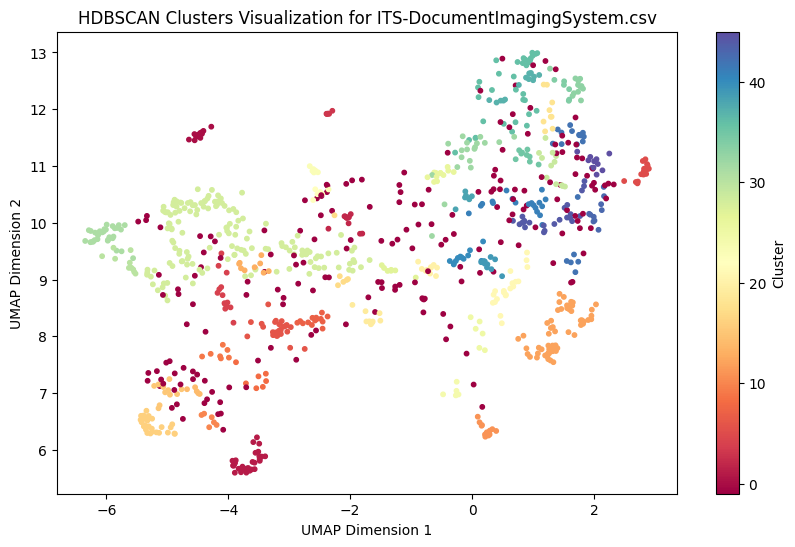

Number of clusters found in ITS-DocumentImagingSystem.csv: 46
Cluster
-1     193
 28    149
 12     56
 36     35
 31     31
 1      29
 6      28
 16     26
 44     23
 21     20
 32     20
 42     19
 41     19
 5      18
 0      14
 11     14
 37     14
 7      14
 4      14
 33     13
 29     12
 40     12
 26     12
 15     11
 2      11
 45     11
 39     10
 20     10
 13     10
 30     10
 19     10
 43     10
 35      9
 18      9
 38      7
 23      7
 27      7
 9       7
 8       7
 34      6
 17      6
 22      6
 10      6
 25      6
 14      5
 3       5
 24      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DocumentImagingSystem.csv

Processing: ITS-Donor&AlumniRelationshipTool(DART).csv
Embedding column: Title


Batches: 100%|██████████| 18/18 [00:00<00:00, 21.02it/s]


Embedding column: Servicename


Batches: 100%|██████████| 18/18 [00:00<00:00, 27.52it/s]


Embedding column: Description


Batches: 100%|██████████| 18/18 [00:06<00:00,  2.69it/s]


Embedding column: Feed


Batches: 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


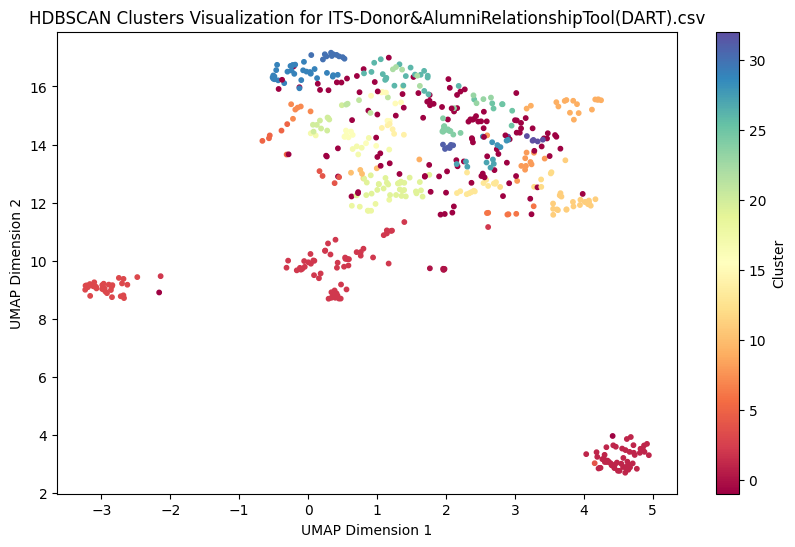

Number of clusters found in ITS-Donor&AlumniRelationshipTool(DART).csv: 33
Cluster
-1     121
 2      58
 1      52
 3      33
 19     32
 29     30
 11     24
 26     21
 9      17
 13     14
 24     12
 30     11
 8      11
 20     10
 16      9
 15      9
 17      8
 25      7
 18      7
 27      7
 28      6
 6       6
 5       6
 31      6
 32      6
 7       6
 14      6
 12      6
 0       5
 10      5
 21      5
 22      5
 23      5
 4       5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Donor&AlumniRelationshipTool(DART).csv

Processing: ITS-DropboxatU-M.csv
Embedding column: Title


Batches: 100%|██████████| 113/113 [00:05<00:00, 20.29it/s]


Embedding column: Servicename


Batches: 100%|██████████| 113/113 [00:04<00:00, 25.62it/s]


Embedding column: Description


Batches: 100%|██████████| 113/113 [00:28<00:00,  3.98it/s]


Embedding column: Feed


Batches: 100%|██████████| 113/113 [01:06<00:00,  1.69it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


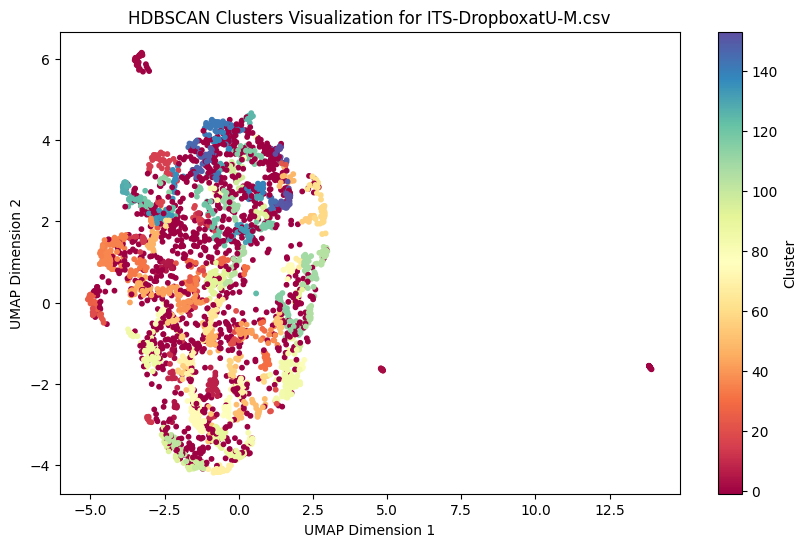

Number of clusters found in ITS-DropboxatU-M.csv: 154
Cluster
-1      1142
 84       94
 86       73
 73       61
 92       60
        ... 
 66        5
 114       5
 106       5
 143       5
 77        5
Name: count, Length: 155, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-DropboxatU-M.csv

Processing: ITS-ElectronicSignature(U-MSignNow).csv
Embedding column: Title


Batches: 100%|██████████| 45/45 [00:01<00:00, 27.26it/s]


Embedding column: Servicename


Batches: 100%|██████████| 45/45 [00:02<00:00, 17.84it/s]


Embedding column: Description


Batches: 100%|██████████| 45/45 [00:09<00:00,  4.66it/s]


Embedding column: Feed


Batches: 100%|██████████| 45/45 [00:24<00:00,  1.83it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


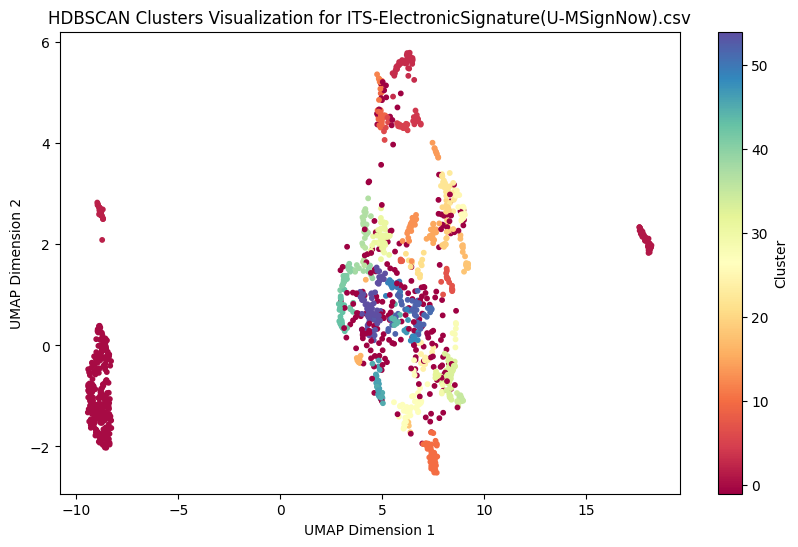

Number of clusters found in ITS-ElectronicSignature(U-MSignNow).csv: 55
Cluster
 0     246
-1     228
 54     66
 1      55
 10     52
 33     51
 27     48
 3      47
 31     46
 52     42
 2      34
 43     33
 13     26
 9      25
 15     23
 37     22
 46     19
 22     19
 4      19
 26     17
 20     15
 7      15
 41     14
 18     13
 19     13
 5      13
 24     13
 45     12
 21     12
 50     10
 16     10
 40     10
 11     10
 49     10
 14      9
 44      9
 17      8
 35      8
 51      8
 48      8
 32      7
 28      7
 47      7
 34      7
 12      7
 39      7
 23      6
 25      6
 8       6
 38      5
 29      5
 36      5
 42      5
 6       5
 30      5
 53      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ElectronicSignature(U-MSignNow).csv

Processing: ITS-ElevatedAccessManagement(CyberArk).csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 18.18it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 25.00it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  3.88it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


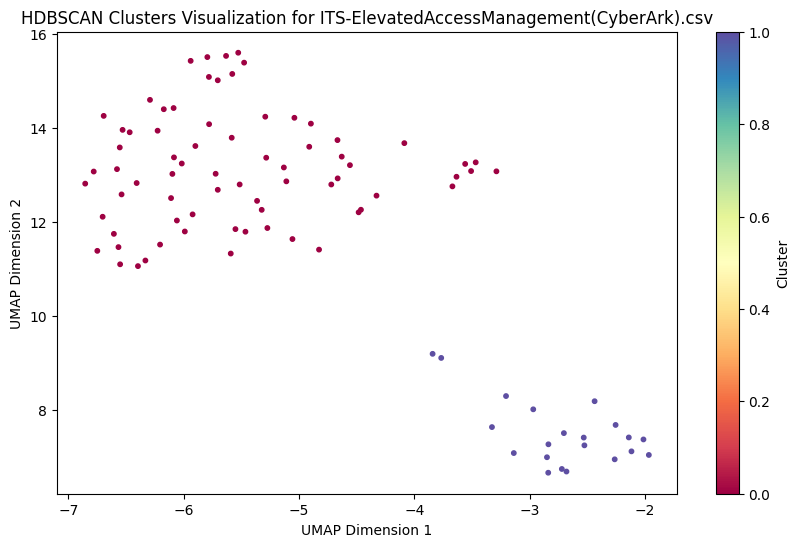

Number of clusters found in ITS-ElevatedAccessManagement(CyberArk).csv: 2
Cluster
0    72
1    21
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ElevatedAccessManagement(CyberArk).csv

Processing: ITS-ElevatedAccessManagement(Passwordstate).csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 22.73it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 27.78it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


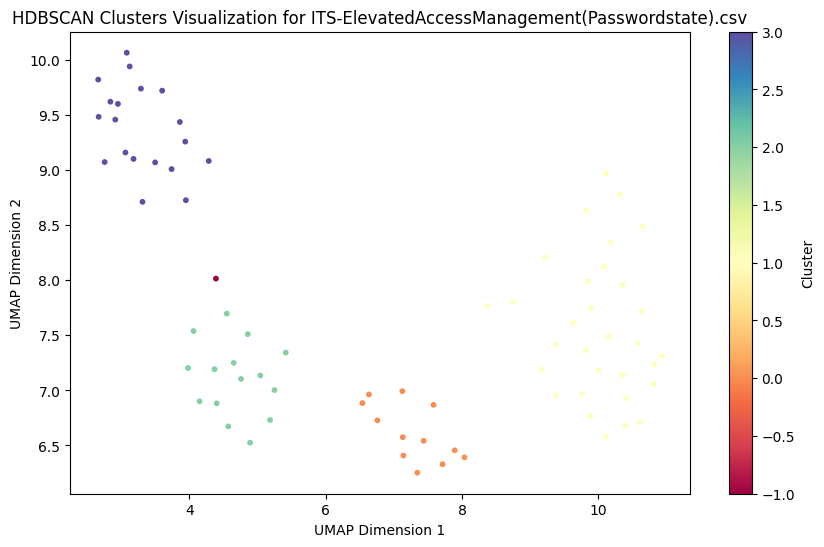

Number of clusters found in ITS-ElevatedAccessManagement(Passwordstate).csv: 4
Cluster
 1    31
 3    19
 2    15
 0    12
-1     1
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ElevatedAccessManagement(Passwordstate).csv

Processing: ITS-ElevatedAccessManagement(PasswordstateADGroupRequest).csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00, 23.10it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 30.07it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-ElevatedAccessManagement(PasswordstateADGroupRequest).csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-EmployeeOffboarding.csv
Embedding column: Title


Batches: 100%|██████████| 11/11 [00:00<00:00, 35.95it/s]


Embedding column: Servicename


Batches: 100%|██████████| 11/11 [00:00<00:00, 35.95it/s]


Embedding column: Description


Batches: 100%|██████████| 11/11 [00:00<00:00, 11.95it/s]


Embedding column: Feed


Batches: 100%|██████████| 11/11 [00:06<00:00,  1.78it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


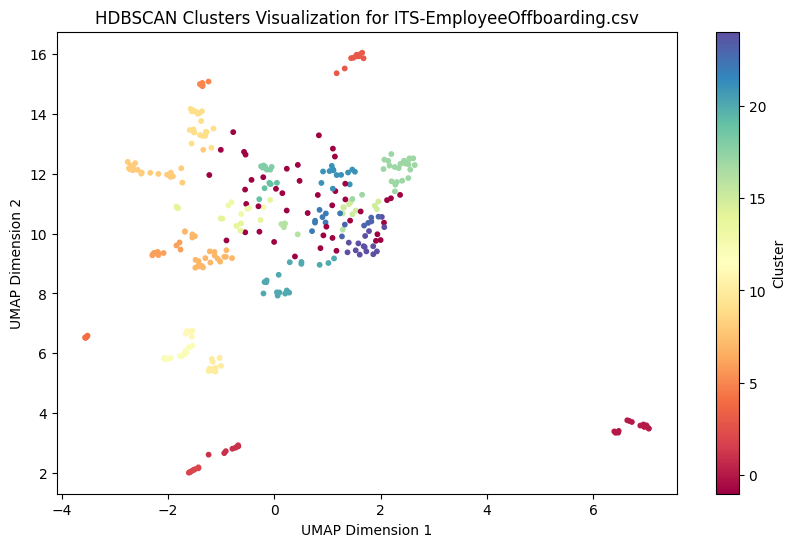

Number of clusters found in ITS-EmployeeOffboarding.csv: 25
Cluster
-1     44
 17    26
 7     23
 8     22
 9     21
 20    17
 0     16
 24    15
 21    13
 12    13
 10    12
 3     12
 14    11
 15    10
 6     10
 2      9
 22     8
 1      8
 23     7
 18     7
 11     6
 19     6
 16     6
 13     6
 4      6
 5      6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-EmployeeOffboarding.csv

Processing: ITS-EmployeeOnboarding.csv
Embedding column: Title


Batches: 100%|██████████| 11/11 [00:00<00:00, 29.03it/s]


Embedding column: Servicename


Batches: 100%|██████████| 11/11 [00:00<00:00, 32.94it/s]


Embedding column: Description


Batches: 100%|██████████| 11/11 [00:01<00:00,  7.09it/s]


Embedding column: Feed


Batches: 100%|██████████| 11/11 [00:04<00:00,  2.42it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


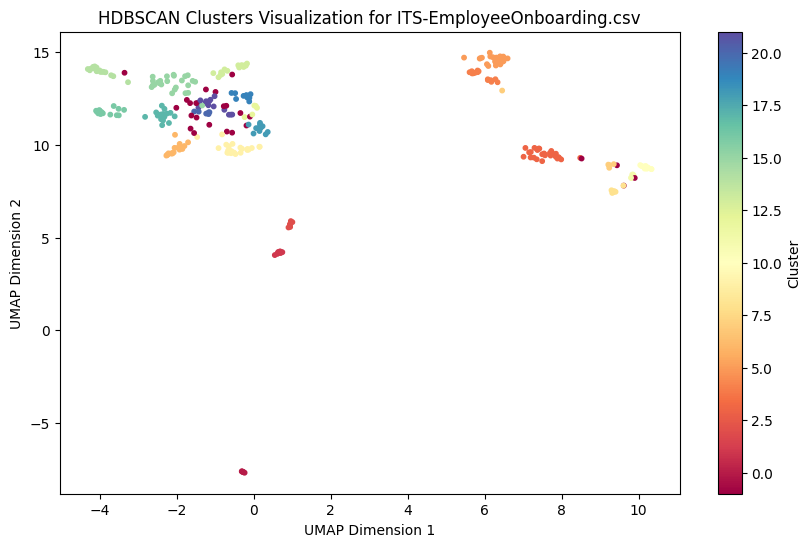

Number of clusters found in ITS-EmployeeOnboarding.csv: 22
Cluster
 3     29
 15    26
-1     24
 5     24
 9     23
 14    18
 6     17
 17    16
 13    15
 21    15
 16    15
 4     15
 10    12
 19    11
 18    11
 1     10
 8      8
 11     6
 2      6
 0      6
 20     6
 12     5
 7      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-EmployeeOnboarding.csv

Processing: ITS-EnhancedEndpointProtection.csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00,  9.79it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 18.30it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:01<00:00,  3.07it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:02<00:00,  1.62it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


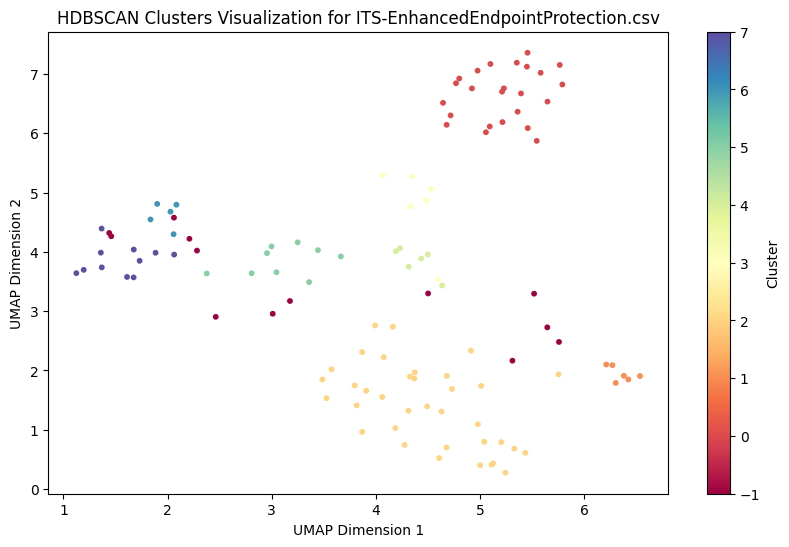

Number of clusters found in ITS-EnhancedEndpointProtection.csv: 8
Cluster
 2    36
 0    24
-1    13
 7    11
 5     9
 3     6
 4     6
 1     6
 6     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-EnhancedEndpointProtection.csv

Processing: ITS-EnterpriseHealth.csv
Embedding column: Title


Batches: 100%|██████████| 36/36 [00:01<00:00, 19.73it/s]


Embedding column: Servicename


Batches: 100%|██████████| 36/36 [00:01<00:00, 35.99it/s]


Embedding column: Description


Batches: 100%|██████████| 36/36 [00:06<00:00,  5.36it/s]


Embedding column: Feed


Batches: 100%|██████████| 36/36 [00:18<00:00,  1.91it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


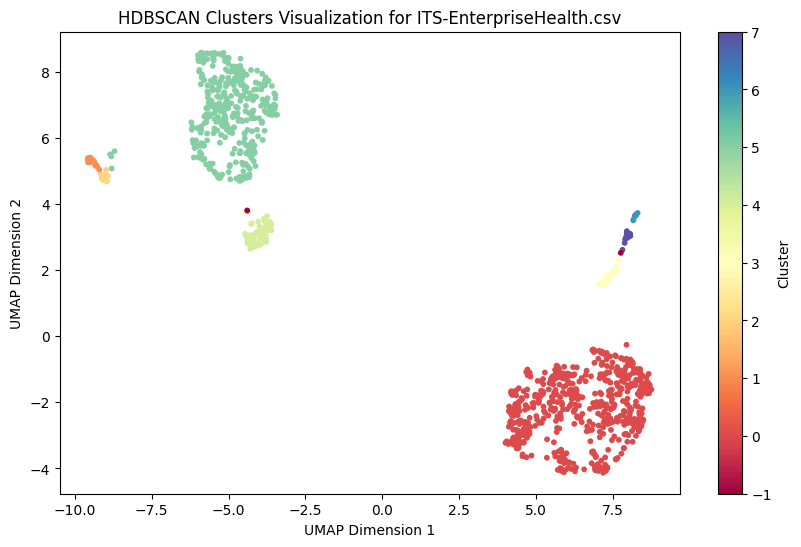

Number of clusters found in ITS-EnterpriseHealth.csv: 8
Cluster
 0    573
 5    390
 4     77
 3     28
 1     24
 7     22
 2     19
 6      9
-1      2
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-EnterpriseHealth.csv

Processing: ITS-EnterpriseSalesforceOrganization.csv
Embedding column: Title


Batches: 100%|██████████| 31/31 [00:01<00:00, 26.05it/s]


Embedding column: Servicename


Batches: 100%|██████████| 31/31 [00:01<00:00, 19.00it/s]


Embedding column: Description


Batches: 100%|██████████| 31/31 [00:09<00:00,  3.40it/s]


Embedding column: Feed


Batches: 100%|██████████| 31/31 [00:12<00:00,  2.42it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


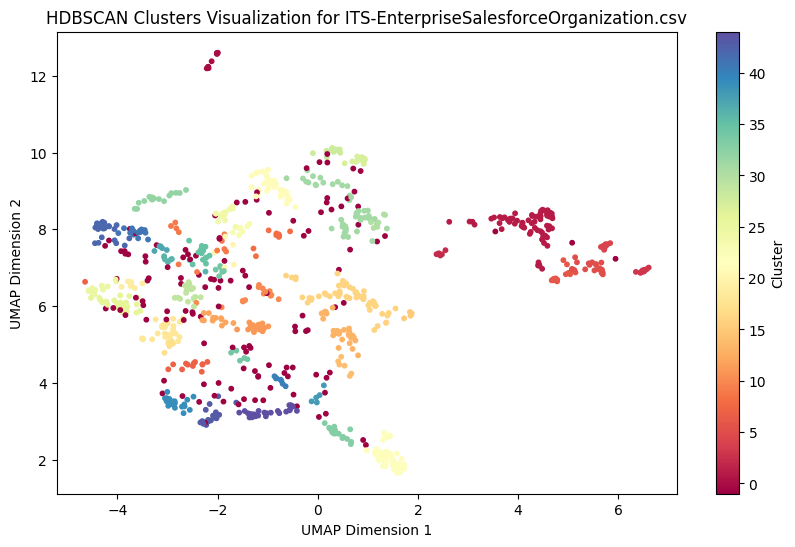

Number of clusters found in ITS-EnterpriseSalesforceOrganization.csv: 45
Cluster
-1     132
 1      74
 16     55
 22     51
 31     47
 21     36
 18     31
 26     29
 13     28
 44     28
 39     25
 42     25
 11     23
 33     23
 43     21
 5      19
 41     17
 32     17
 29     17
 6      16
 28     16
 24     16
 27     15
 35     15
 10     14
 7      13
 12     12
 8      12
 0      12
 3      12
 9      11
 25     11
 34     11
 4      10
 36      7
 40      7
 30      7
 23      7
 19      7
 17      6
 14      6
 15      6
 2       5
 38      5
 37      5
 20      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-EnterpriseSalesforceOrganization.csv

Processing: ITS-EnterpriseStorage(SAN).csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 16.67it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 29.41it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:01<00:00,  2.67it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


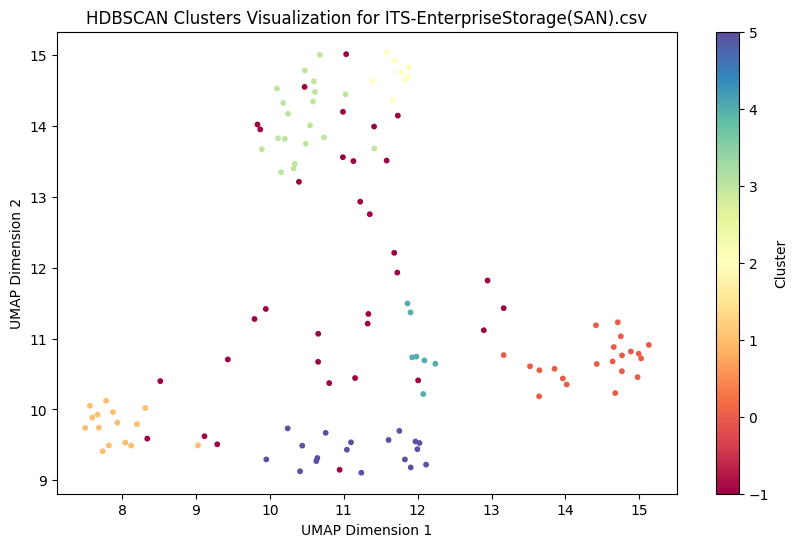

Number of clusters found in ITS-EnterpriseStorage(SAN).csv: 6
Cluster
-1    33
 0    21
 3    19
 5    18
 1    15
 2     8
 4     7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-EnterpriseStorage(SAN).csv

Processing: ITS-eResearch.csv
Embedding column: Title


Batches: 100%|██████████| 9/9 [00:00<00:00,  9.84it/s]


Embedding column: Servicename


Batches: 100%|██████████| 9/9 [00:00<00:00, 15.54it/s]


Embedding column: Description


Batches: 100%|██████████| 9/9 [00:02<00:00,  3.77it/s]


Embedding column: Feed


Batches: 100%|██████████| 9/9 [00:05<00:00,  1.67it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


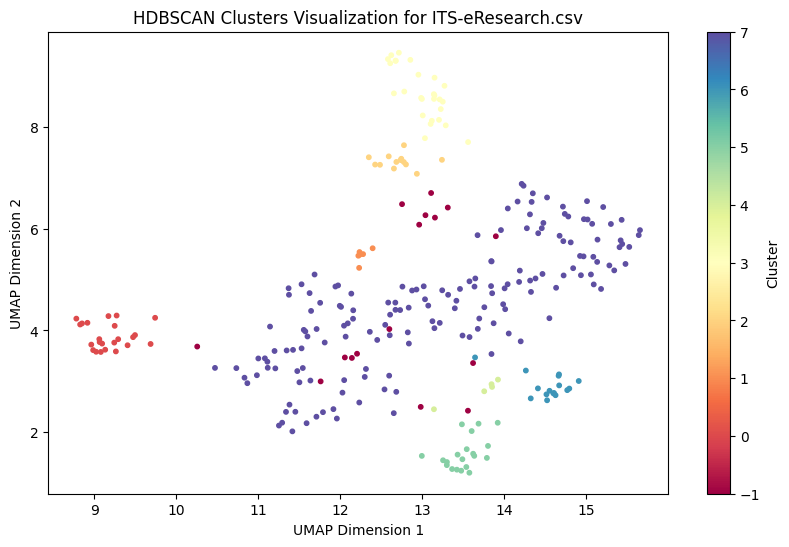

Number of clusters found in ITS-eResearch.csv: 8
Cluster
 7    162
 3     27
 0     23
 5     20
-1     16
 6     16
 2     13
 1      6
 4      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-eResearch.csv

Processing: ITS-eResearcheRAM.csv
Embedding column: Title


Batches: 100%|██████████| 10/10 [00:00<00:00, 19.34it/s]


Embedding column: Servicename


Batches: 100%|██████████| 10/10 [00:00<00:00, 25.44it/s]


Embedding column: Description


Batches: 100%|██████████| 10/10 [00:03<00:00,  2.64it/s]


Embedding column: Feed


Batches: 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


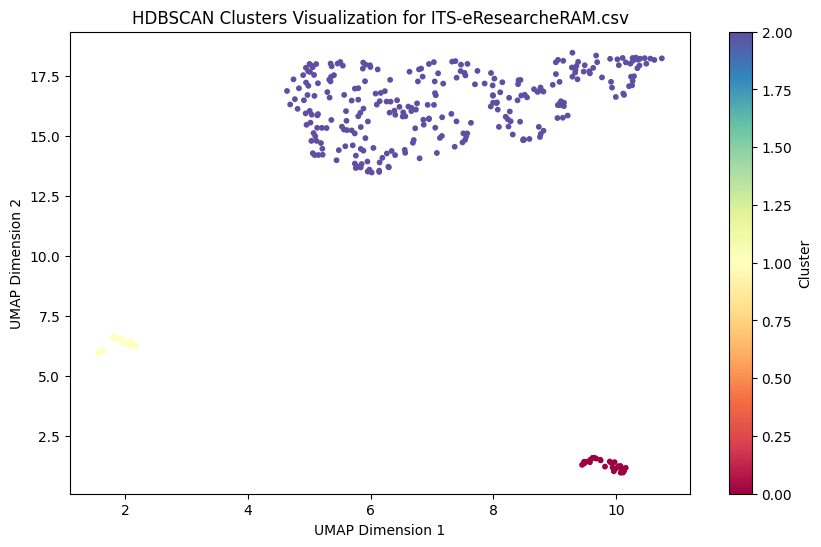

Number of clusters found in ITS-eResearcheRAM.csv: 3
Cluster
2    275
0     26
1     19
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-eResearcheRAM.csv

Processing: ITS-eResearchM-InformConflictofInterest(COI).csv
Embedding column: Title


Batches: 100%|██████████| 18/18 [00:00<00:00, 20.83it/s]


Embedding column: Servicename


Batches: 100%|██████████| 18/18 [00:00<00:00, 20.69it/s]


Embedding column: Description


Batches: 100%|██████████| 18/18 [00:06<00:00,  2.76it/s]


Embedding column: Feed


Batches: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


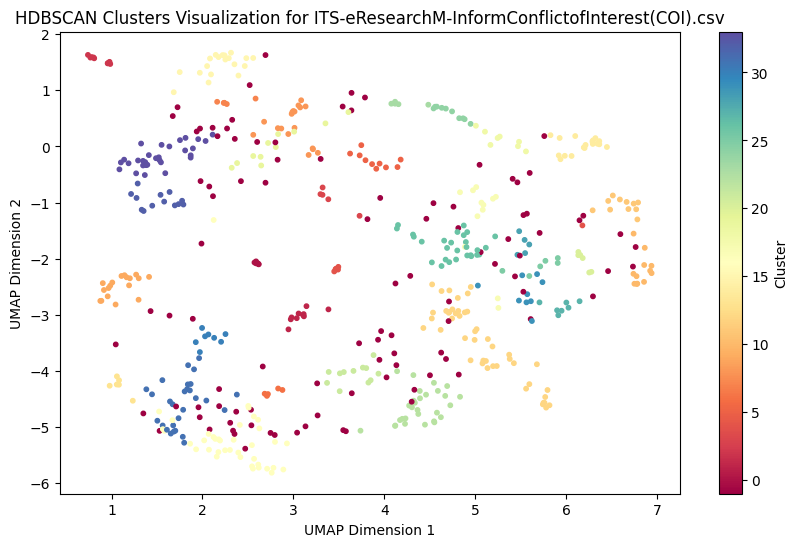

Number of clusters found in ITS-eResearchM-InformConflictofInterest(COI).csv: 34
Cluster
-1     100
 12     46
 16     39
 33     31
 22     29
 31     28
 26     28
 15     19
 8      18
 9      18
 14     18
 32     13
 21     12
 17     12
 10     12
 19     11
 11     11
 5      10
 24     10
 1      10
 29      9
 2       9
 18      8
 30      8
 27      7
 20      6
 13      6
 4       6
 0       6
 25      6
 28      5
 6       5
 3       5
 23      5
 7       5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-eResearchM-InformConflictofInterest(COI).csv

Processing: ITS-eResearchORSPTier3ReportRequest.csv
Embedding column: Title


Batches: 100%|██████████| 17/17 [00:00<00:00, 18.05it/s]


Embedding column: Servicename


Batches: 100%|██████████| 17/17 [00:00<00:00, 25.60it/s]


Embedding column: Description


Batches: 100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


Embedding column: Feed


Batches: 100%|██████████| 17/17 [00:09<00:00,  1.75it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


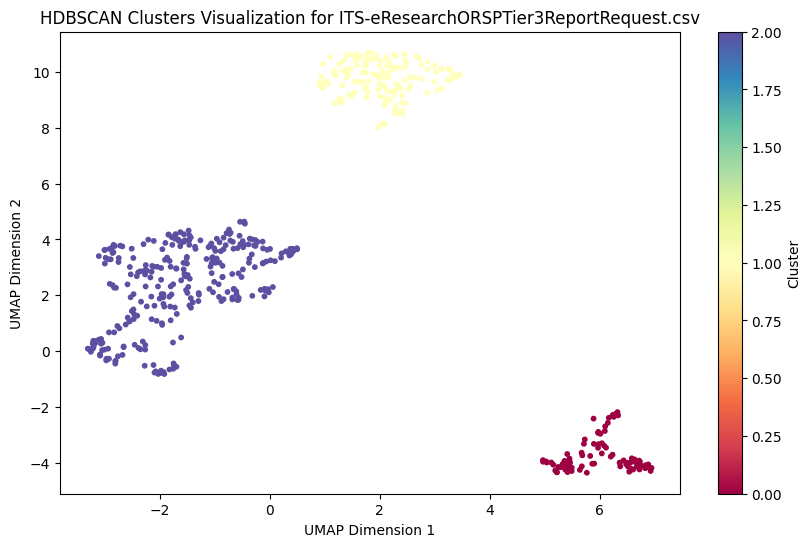

Number of clusters found in ITS-eResearchORSPTier3ReportRequest.csv: 3
Cluster
2    294
1    153
0     95
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-eResearchORSPTier3ReportRequest.csv

Processing: ITS-eResearchProposalManagement(eRPM).csv
Embedding column: Title


Batches: 100%|██████████| 79/79 [00:05<00:00, 15.60it/s]


Embedding column: Servicename


Batches: 100%|██████████| 79/79 [00:03<00:00, 20.71it/s]


Embedding column: Description


Batches: 100%|██████████| 79/79 [00:27<00:00,  2.92it/s]


Embedding column: Feed


Batches: 100%|██████████| 79/79 [00:45<00:00,  1.74it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


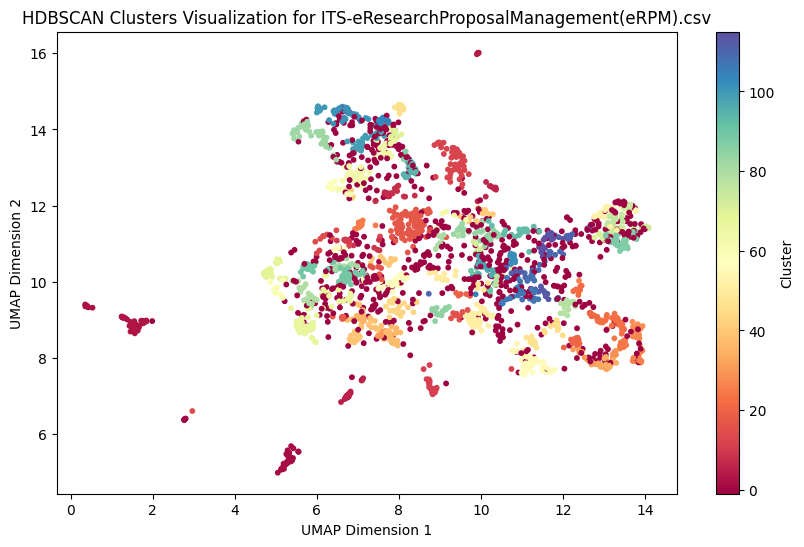

Number of clusters found in ITS-eResearchProposalManagement(eRPM).csv: 116
Cluster
-1      677
 17      95
 12      61
 3       59
 67      52
       ... 
 74       5
 86       5
 96       5
 77       5
 108      5
Name: count, Length: 117, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-eResearchProposalManagement(eRPM).csv

Processing: ITS-eResearchProposalManagement(eRPM)AdminPersonnelChangeRequest.csv
Embedding column: Title


Batches: 100%|██████████| 8/8 [00:00<00:00, 27.50it/s]


Embedding column: Servicename


Batches: 100%|██████████| 8/8 [00:00<00:00, 22.92it/s]


Embedding column: Description


Batches: 100%|██████████| 8/8 [00:04<00:00,  1.91it/s]


Embedding column: Feed


Batches: 100%|██████████| 8/8 [00:03<00:00,  2.25it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


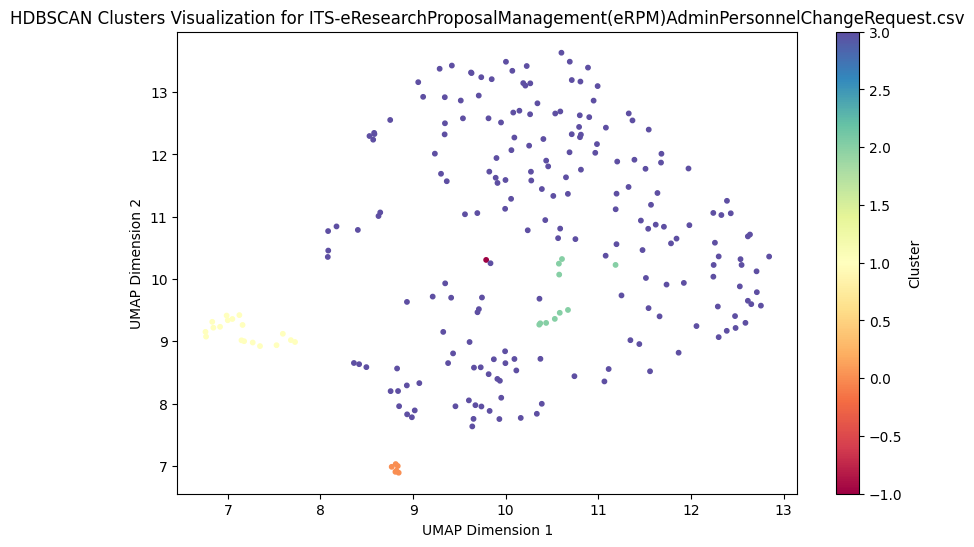

Number of clusters found in ITS-eResearchProposalManagement(eRPM)AdminPersonnelChangeRequest.csv: 4
Cluster
 3    198
 1     18
 2     10
 0      6
-1      1
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-eResearchProposalManagement(eRPM)AdminPersonnelChangeRequest.csv

Processing: ITS-eResearchRegulatoryManagement.csv
Embedding column: Title


Batches: 100%|██████████| 54/54 [00:03<00:00, 14.24it/s]


Embedding column: Servicename


Batches: 100%|██████████| 54/54 [00:02<00:00, 25.92it/s]


Embedding column: Description


Batches: 100%|██████████| 54/54 [00:18<00:00,  2.88it/s]


Embedding column: Feed


Batches: 100%|██████████| 54/54 [00:29<00:00,  1.81it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


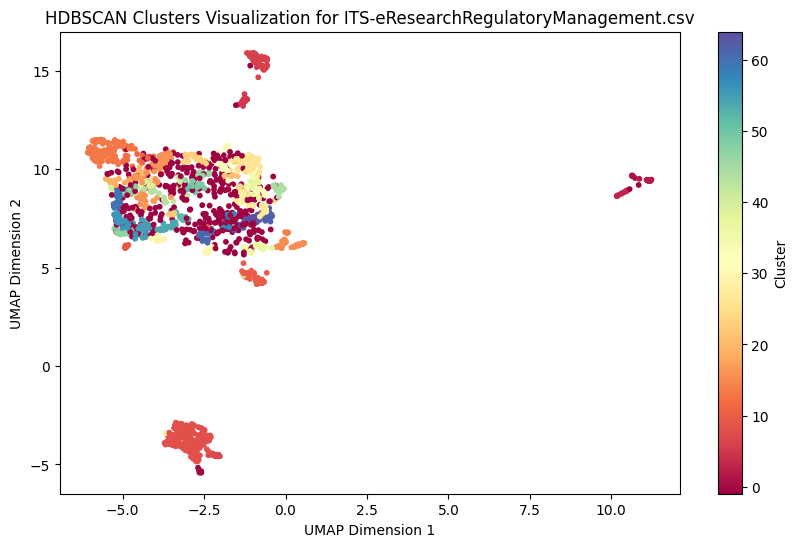

Number of clusters found in ITS-eResearchRegulatoryManagement.csv: 65
Cluster
-1     392
 8     207
 13    118
 16     78
 6      69
      ... 
 40      5
 22      5
 17      5
 21      5
 48      5
Name: count, Length: 66, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-eResearchRegulatoryManagement.csv

Processing: ITS-ExpenseReportingIntegrationSupport.csv
Embedding column: Title


Batches: 100%|██████████| 36/36 [00:01<00:00, 23.93it/s]


Embedding column: Servicename


Batches: 100%|██████████| 36/36 [00:01<00:00, 30.48it/s]


Embedding column: Description


Batches: 100%|██████████| 36/36 [00:06<00:00,  5.69it/s]


Embedding column: Feed


Batches: 100%|██████████| 36/36 [00:19<00:00,  1.86it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


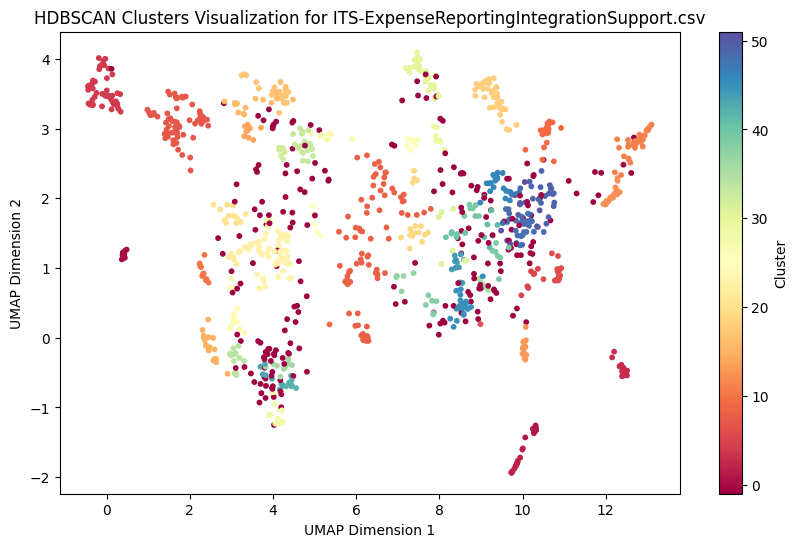

Number of clusters found in ITS-ExpenseReportingIntegrationSupport.csv: 52
Cluster
-1     223
 8      82
 7      70
 23     57
 4      50
 18     37
 11     37
 30     34
 48     28
 45     24
 17     24
 9      22
 15     21
 3      21
 49     19
 33     19
 46     19
 12     18
 19     17
 24     17
 6      16
 28     16
 16     16
 13     15
 2      14
 0      14
 39     14
 34     13
 10     11
 14     10
 44     10
 36      9
 29      9
 42      9
 1       9
 22      8
 27      8
 20      8
 40      8
 31      7
 26      7
 32      7
 5       7
 51      6
 38      6
 25      6
 43      6
 41      6
 50      5
 47      5
 35      5
 37      5
 21      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ExpenseReportingIntegrationSupport.csv

Processing: ITS-ExternalDomainNameRegistration(DNS).csv
Embedding column: Title


Batches: 100%|██████████| 65/65 [00:03<00:00, 20.72it/s]


Embedding column: Servicename


Batches: 100%|██████████| 65/65 [00:02<00:00, 23.92it/s]


Embedding column: Description


Batches: 100%|██████████| 65/65 [00:28<00:00,  2.25it/s]


Embedding column: Feed


Batches: 100%|██████████| 65/65 [00:11<00:00,  5.86it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


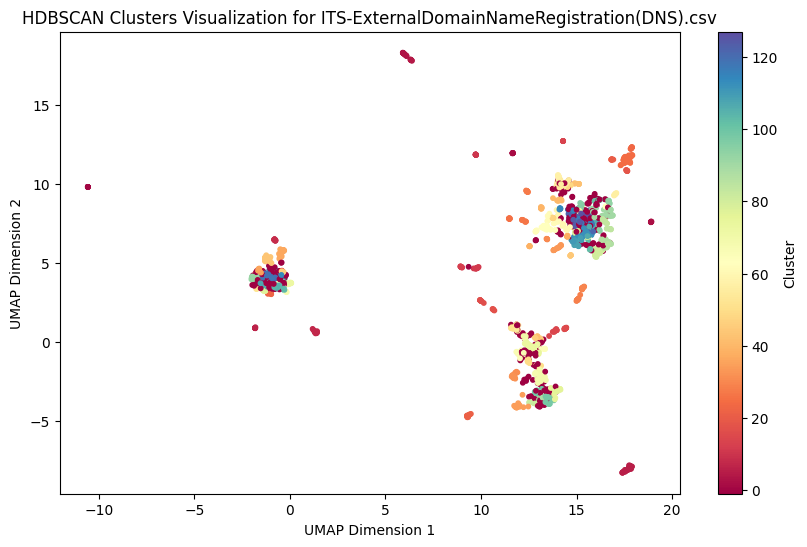

Number of clusters found in ITS-ExternalDomainNameRegistration(DNS).csv: 128
Cluster
-1      434
 24      58
 5       52
 98      50
 55      42
       ... 
 85       5
 121      5
 50       5
 113      5
 46       5
Name: count, Length: 129, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ExternalDomainNameRegistration(DNS).csv

Processing: ITS-FinancialApplicationService.csv
Embedding column: Title


Batches: 100%|██████████| 146/146 [00:08<00:00, 17.97it/s]


Embedding column: Servicename


Batches: 100%|██████████| 146/146 [00:05<00:00, 25.68it/s]


Embedding column: Description


Batches: 100%|██████████| 146/146 [00:40<00:00,  3.59it/s]


Embedding column: Feed


Batches: 100%|██████████| 146/146 [01:10<00:00,  2.06it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


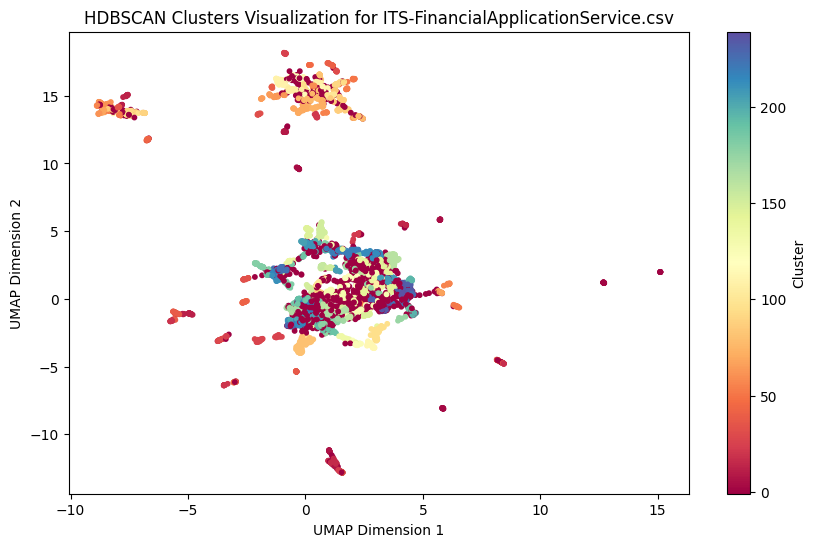

Number of clusters found in ITS-FinancialApplicationService.csv: 240
Cluster
-1      1068
 80      119
 213      76
 95       73
 162      72
        ... 
 200       5
 208       5
 110       5
 170       5
 139       5
Name: count, Length: 241, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-FinancialApplicationService.csv

Processing: ITS-FinancialsReporting.csv
Embedding column: Title


Batches: 100%|██████████| 7/7 [00:00<00:00, 21.20it/s]


Embedding column: Servicename


Batches: 100%|██████████| 7/7 [00:00<00:00, 38.68it/s]


Embedding column: Description


Batches: 100%|██████████| 7/7 [00:02<00:00,  3.24it/s]


Embedding column: Feed


Batches: 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


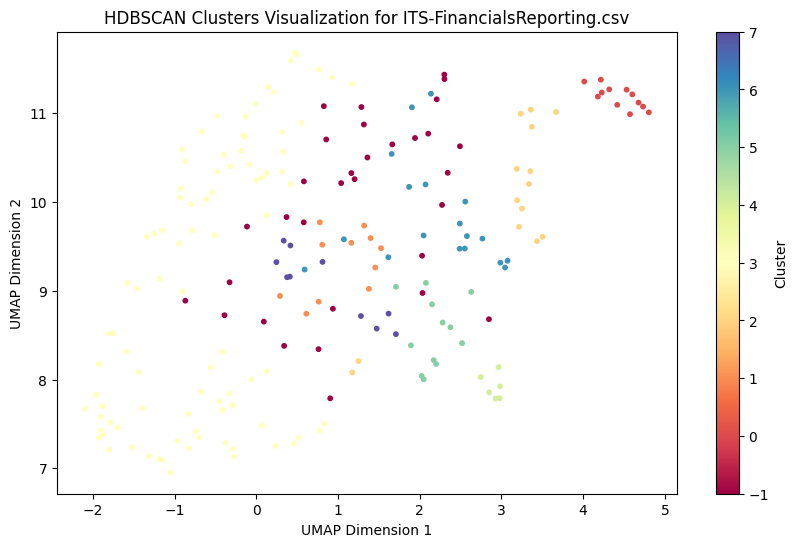

Number of clusters found in ITS-FinancialsReporting.csv: 8
Cluster
 3    89
-1    32
 6    18
 2    14
 0    12
 5    12
 1    11
 7    10
 4     6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-FinancialsReporting.csv

Processing: ITS-FirewallChangeRequests.csv
Embedding column: Title


Batches: 100%|██████████| 51/51 [00:03<00:00, 13.58it/s]


Embedding column: Servicename


Batches: 100%|██████████| 51/51 [00:01<00:00, 25.89it/s]


Embedding column: Description


Batches: 100%|██████████| 51/51 [00:17<00:00,  2.96it/s]


Embedding column: Feed


Batches: 100%|██████████| 51/51 [00:20<00:00,  2.45it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


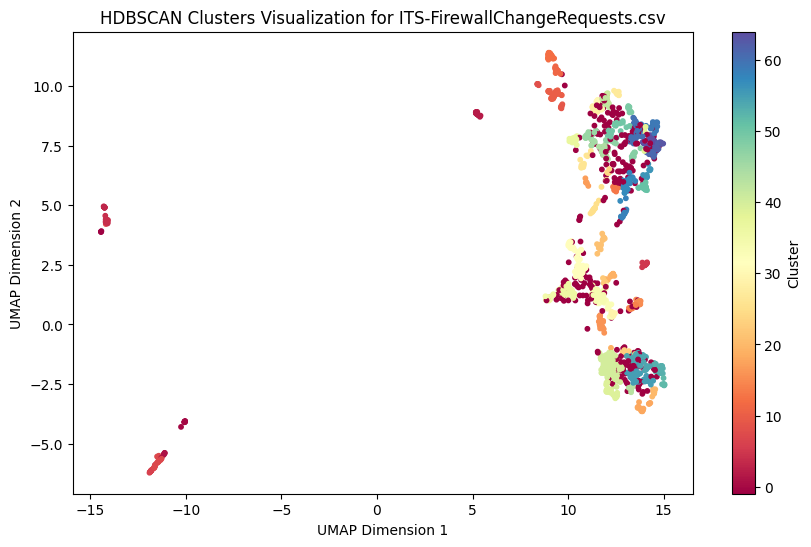

Number of clusters found in ITS-FirewallChangeRequests.csv: 65
Cluster
-1     288
 40    116
 32     50
 54     44
 36     42
      ... 
 1       6
 41      6
 24      5
 17      5
 22      5
Name: count, Length: 66, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-FirewallChangeRequests.csv

Processing: ITS-Firewalls.csv
Embedding column: Title


Batches: 100%|██████████| 16/16 [00:00<00:00, 16.05it/s]


Embedding column: Servicename


Batches: 100%|██████████| 16/16 [00:00<00:00, 38.46it/s]


Embedding column: Description


Batches: 100%|██████████| 16/16 [00:07<00:00,  2.28it/s]


Embedding column: Feed


Batches: 100%|██████████| 16/16 [00:08<00:00,  1.87it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


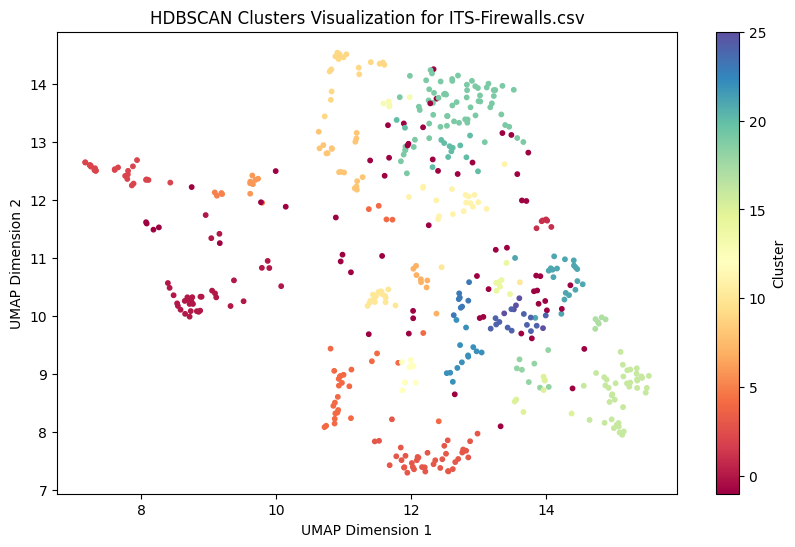

Number of clusters found in ITS-Firewalls.csv: 26
Cluster
 19    67
-1     61
 3     40
 16    40
 0     35
 4     30
 2     25
 21    20
 9     19
 10    18
 11    18
 8     18
 22    13
 24    13
 20    13
 12     9
 7      8
 18     8
 15     8
 23     8
 14     7
 6      7
 1      6
 17     6
 13     5
 5      5
 25     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Firewalls.csv

Processing: ITS-FriendAccounts.csv
Embedding column: Title


Batches: 100%|██████████| 139/139 [00:07<00:00, 18.89it/s]


Embedding column: Servicename


Batches: 100%|██████████| 139/139 [00:04<00:00, 32.58it/s]


Embedding column: Description


Batches: 100%|██████████| 139/139 [00:24<00:00,  5.71it/s]


Embedding column: Feed


Batches: 100%|██████████| 139/139 [01:20<00:00,  1.72it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


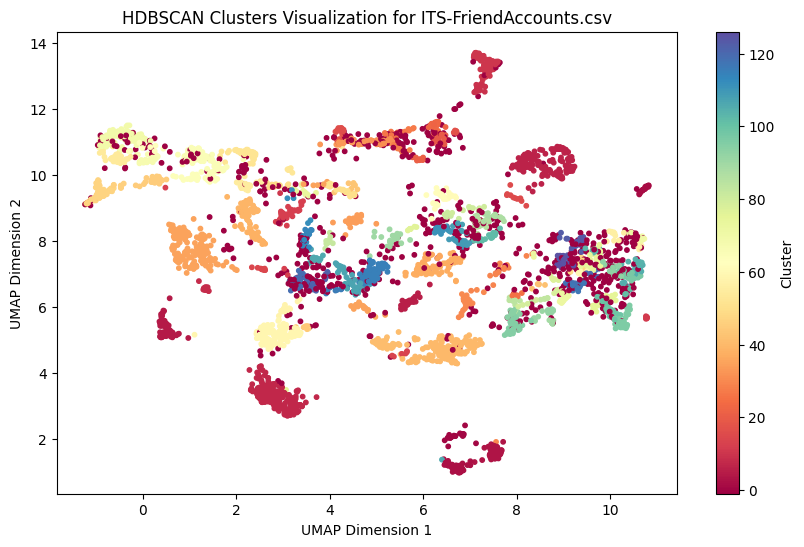

Number of clusters found in ITS-FriendAccounts.csv: 127
Cluster
-1      799
 7      233
 35     218
 6      195
 40     189
       ... 
 79       5
 91       5
 57       5
 101      5
 25       5
Name: count, Length: 128, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-FriendAccounts.csv

Processing: ITS-GeneralLedgerModule.csv
Embedding column: Title


Batches: 100%|██████████| 7/7 [00:00<00:00, 12.35it/s]


Embedding column: Servicename


Batches: 100%|██████████| 7/7 [00:00<00:00, 33.49it/s]


Embedding column: Description


Batches: 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]


Embedding column: Feed


Batches: 100%|██████████| 7/7 [00:03<00:00,  1.87it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


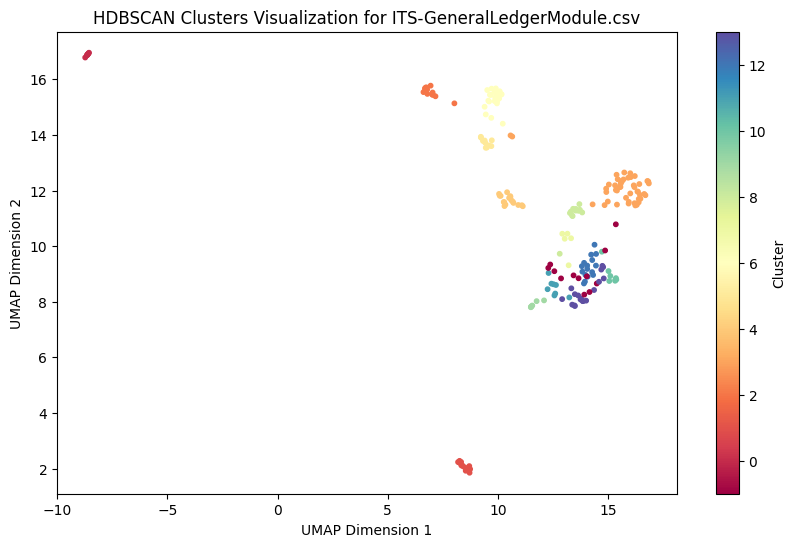

Number of clusters found in ITS-GeneralLedgerModule.csv: 14
Cluster
 3     48
 6     21
 13    18
 4     17
 12    16
 1     15
 2     13
-1     12
 8     12
 5     10
 11     8
 10     8
 0      8
 9      6
 7      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-GeneralLedgerModule.csv

Processing: ITS-GlobusFileTransferandDataSharing.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 14.22it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 17.34it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


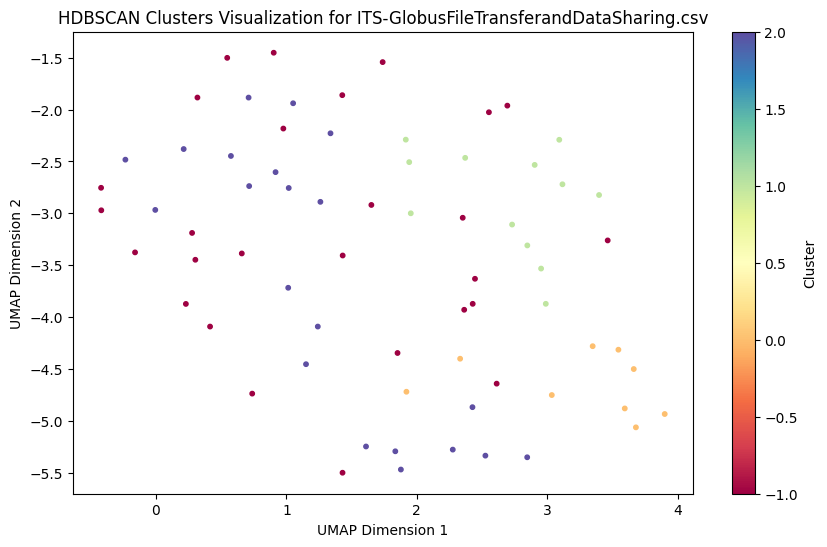

Number of clusters found in ITS-GlobusFileTransferandDataSharing.csv: 3
Cluster
-1    27
 2    21
 1    12
 0     9
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-GlobusFileTransferandDataSharing.csv

Processing: ITS-GoBlueFeedback.csv
Embedding column: Title


Batches: 100%|██████████| 6/6 [00:00<00:00, 25.89it/s]


Embedding column: Servicename


Batches: 100%|██████████| 6/6 [00:00<00:00, 29.56it/s]


Embedding column: Description


Batches: 100%|██████████| 6/6 [00:01<00:00,  4.22it/s]


Embedding column: Feed


Batches: 100%|██████████| 6/6 [00:01<00:00,  4.84it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


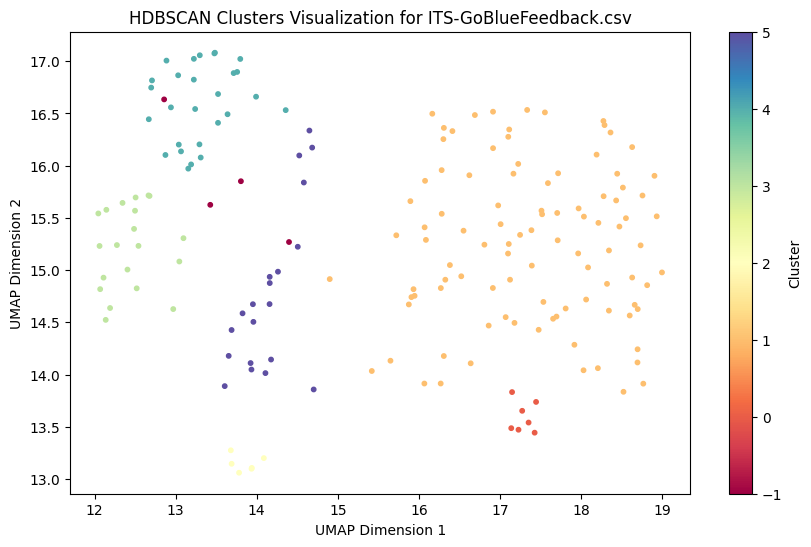

Number of clusters found in ITS-GoBlueFeedback.csv: 6
Cluster
 1    98
 4    27
 3    20
 5    20
 0     7
 2     6
-1     4
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-GoBlueFeedback.csv

Processing: ITS-GoogleatU-M.csv
Embedding column: Title


Batches: 100%|██████████| 653/653 [00:34<00:00, 18.86it/s]


Embedding column: Servicename


Batches: 100%|██████████| 653/653 [00:26<00:00, 24.74it/s]


Embedding column: Description


Batches: 100%|██████████| 653/653 [02:40<00:00,  4.06it/s]


Embedding column: Feed


Batches: 100%|██████████| 653/653 [06:14<00:00,  1.74it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


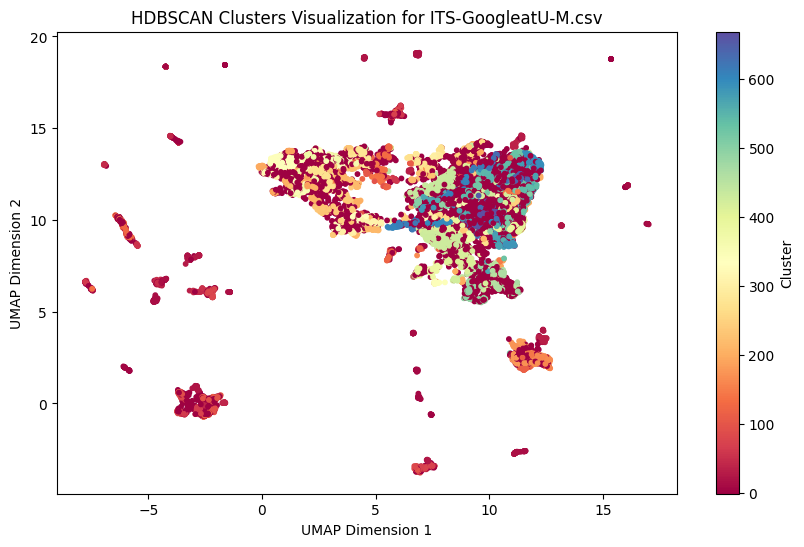

Number of clusters found in ITS-GoogleatU-M.csv: 669
Cluster
-1      7454
 429     513
 433     334
 341     308
 273     196
        ... 
 448       5
 487       5
 270       5
 558       5
 72        5
Name: count, Length: 670, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-GoogleatU-M.csv

Processing: ITS-GoogleCloudPlatform(GCP)atU-M.csv
Embedding column: Title


Batches: 100%|██████████| 7/7 [00:00<00:00, 18.57it/s]


Embedding column: Servicename


Batches: 100%|██████████| 7/7 [00:00<00:00, 24.22it/s]


Embedding column: Description


Batches: 100%|██████████| 7/7 [00:02<00:00,  2.36it/s]


Embedding column: Feed


Batches: 100%|██████████| 7/7 [00:03<00:00,  2.03it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


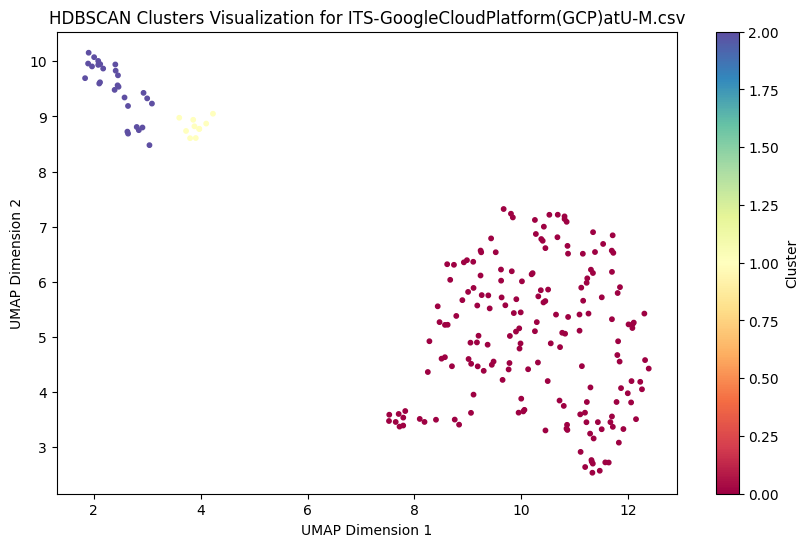

Number of clusters found in ITS-GoogleCloudPlatform(GCP)atU-M.csv: 3
Cluster
0    178
2     28
1     10
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-GoogleCloudPlatform(GCP)atU-M.csv

Processing: ITS-GoogleCloudPlatform(GCP)atU-MAccountRequests.csv
Embedding column: Title


Batches: 100%|██████████| 7/7 [00:00<00:00, 28.46it/s]


Embedding column: Servicename


Batches: 100%|██████████| 7/7 [00:00<00:00, 23.24it/s]


Embedding column: Description


Batches: 100%|██████████| 7/7 [00:01<00:00,  6.75it/s]


Embedding column: Feed


Batches: 100%|██████████| 7/7 [00:03<00:00,  1.88it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


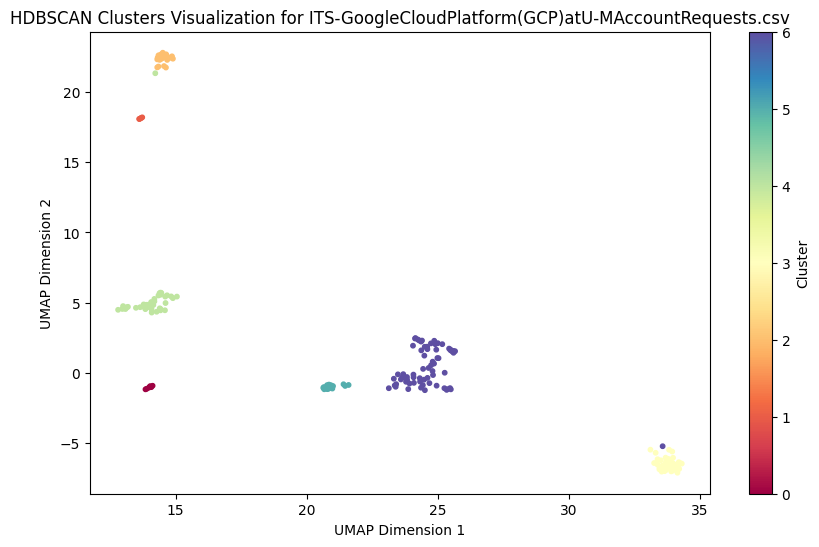

Number of clusters found in ITS-GoogleCloudPlatform(GCP)atU-MAccountRequests.csv: 7
Cluster
6    70
3    42
4    41
2    23
5    17
0     9
1     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-GoogleCloudPlatform(GCP)atU-MAccountRequests.csv

Processing: ITS-GoogleStorageProject.csv
Embedding column: Title


Batches: 100%|██████████| 127/127 [00:06<00:00, 18.95it/s]


Embedding column: Servicename


Batches: 100%|██████████| 127/127 [00:04<00:00, 27.16it/s]


Embedding column: Description


Batches: 100%|██████████| 127/127 [00:28<00:00,  4.47it/s]


Embedding column: Feed


Batches: 100%|██████████| 127/127 [01:17<00:00,  1.65it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


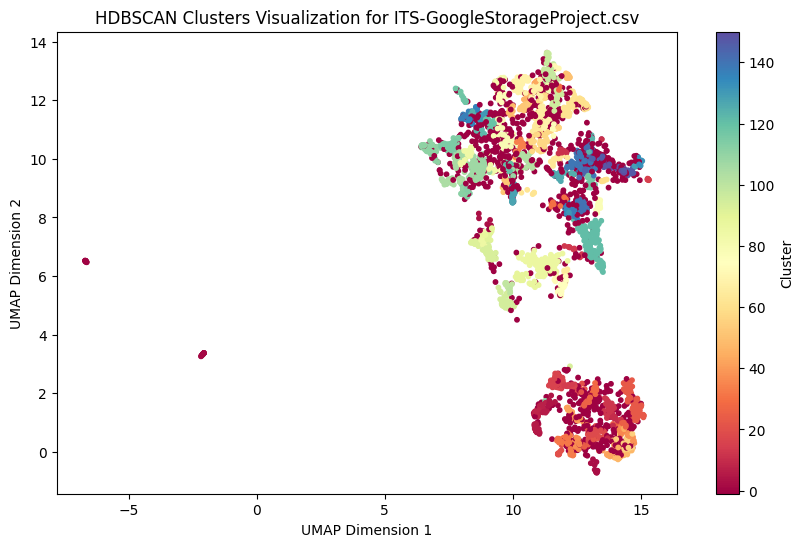

Number of clusters found in ITS-GoogleStorageProject.csv: 151
Cluster
-1      1070
 121     159
 86      131
 23      101
 16       84
        ... 
 6         5
 149       5
 59        5
 21        5
 22        5
Name: count, Length: 152, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-GoogleStorageProject.csv

Processing: ITS-GreatLakes(HPCCluster).csv
Embedding column: Title


Batches: 100%|██████████| 121/121 [00:06<00:00, 17.88it/s]


Embedding column: Servicename


Batches: 100%|██████████| 121/121 [00:05<00:00, 21.50it/s]


Embedding column: Description


Batches: 100%|██████████| 121/121 [00:52<00:00,  2.31it/s]


Embedding column: Feed


Batches: 100%|██████████| 121/121 [01:05<00:00,  1.86it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


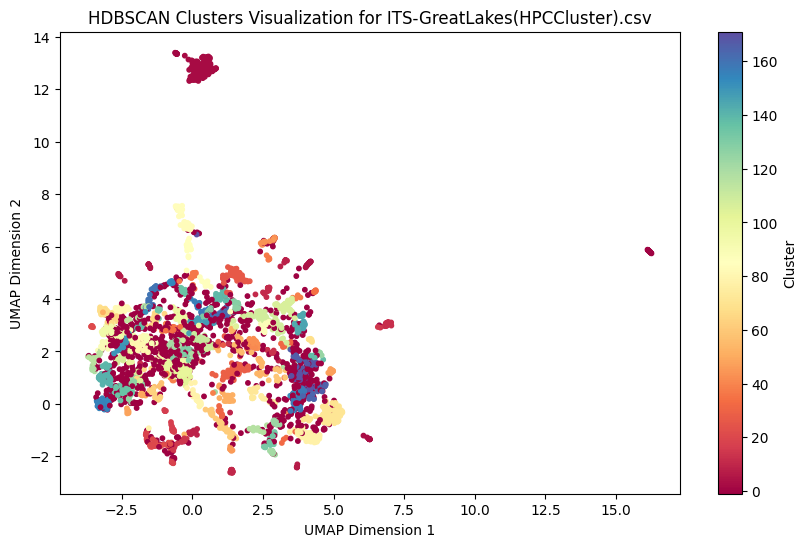

Number of clusters found in ITS-GreatLakes(HPCCluster).csv: 172
Cluster
-1      1053
 2       168
 71       96
 77       73
 26       70
        ... 
 104       5
 38        5
 24        5
 124       5
 23        5
Name: count, Length: 173, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-GreatLakes(HPCCluster).csv

Processing: ITS-GrouperatU-M.csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 32.56it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.37it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


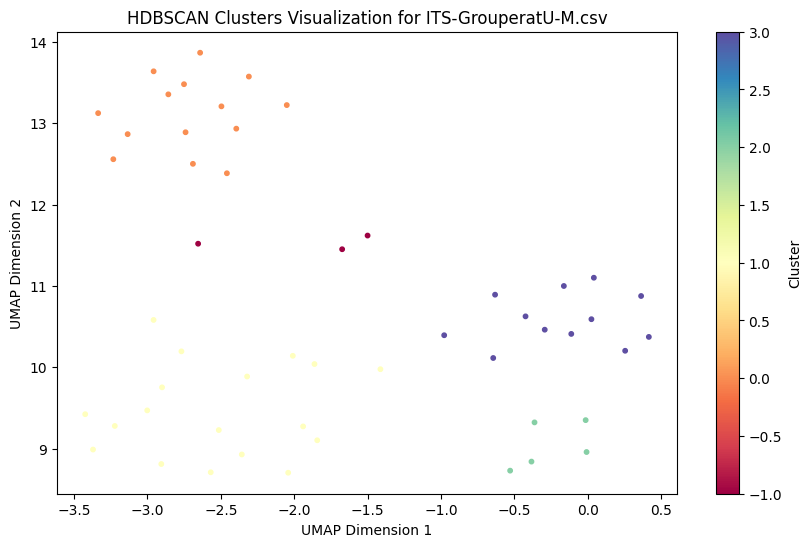

Number of clusters found in ITS-GrouperatU-M.csv: 4
Cluster
 1    18
 0    14
 3    12
 2     5
-1     3
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-GrouperatU-M.csv

Processing: ITS-Hostmaster-DNS-DHCP.csv
Embedding column: Title


Batches: 100%|██████████| 35/35 [00:03<00:00, 11.32it/s]


Embedding column: Servicename


Batches: 100%|██████████| 35/35 [00:01<00:00, 24.61it/s]


Embedding column: Description


Batches: 100%|██████████| 35/35 [00:14<00:00,  2.43it/s]


Embedding column: Feed


Batches: 100%|██████████| 35/35 [00:14<00:00,  2.47it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


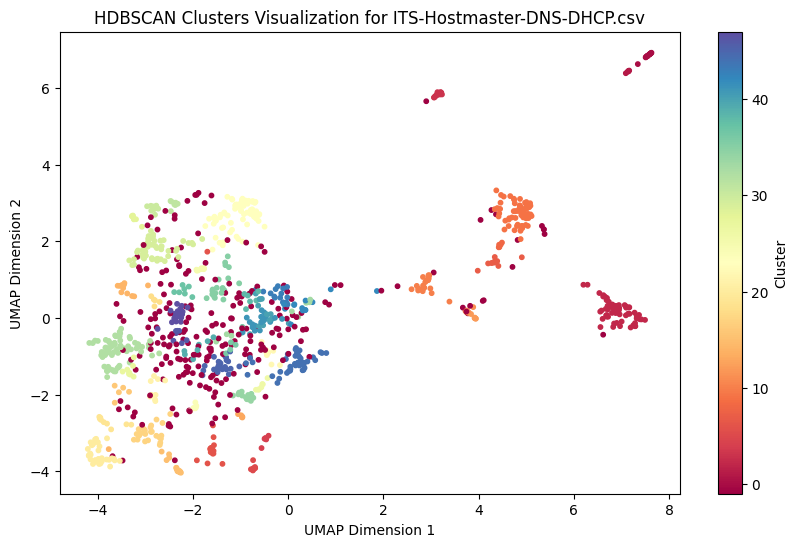

Number of clusters found in ITS-Hostmaster-DNS-DHCP.csv: 48
Cluster
-1     239
 23     74
 32     73
 9      68
 2      61
 29     51
 44     44
 20     38
 17     26
 45     24
 47     22
 35     20
 10     20
 3      20
 41     19
 0      18
 6      17
 15     16
 34     15
 43     15
 14     13
 40     13
 42     13
 5      11
 7      10
 11     10
 25      9
 21      9
 33      9
 19      9
 22      9
 31      8
 38      8
 30      8
 27      8
 24      8
 28      7
 39      7
 26      7
 37      7
 4       7
 12      6
 1       6
 46      6
 13      6
 8       5
 36      5
 18      5
 16      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Hostmaster-DNS-DHCP.csv

Processing: ITS-HousingNetworkDeviceRegistration.csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 20.73it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 40.40it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:00<00:00,  5.97it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:01<00:00,  2.40it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


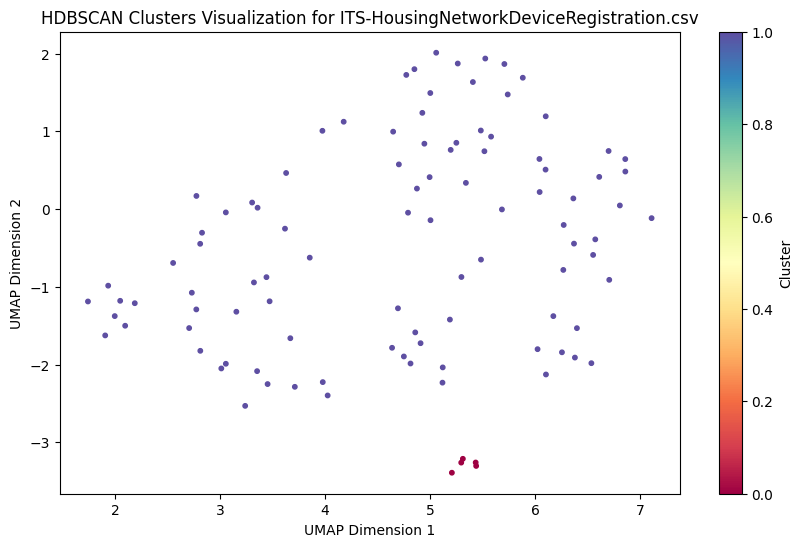

Number of clusters found in ITS-HousingNetworkDeviceRegistration.csv: 2
Cluster
1    96
0     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-HousingNetworkDeviceRegistration.csv

Processing: ITS-HumanResourcesManagementSystem.csv
Embedding column: Title


Batches: 100%|██████████| 159/159 [00:09<00:00, 17.42it/s]


Embedding column: Servicename


Batches: 100%|██████████| 159/159 [00:05<00:00, 27.12it/s]


Embedding column: Description


Batches: 100%|██████████| 159/159 [00:38<00:00,  4.14it/s]


Embedding column: Feed


Batches: 100%|██████████| 159/159 [01:27<00:00,  1.82it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


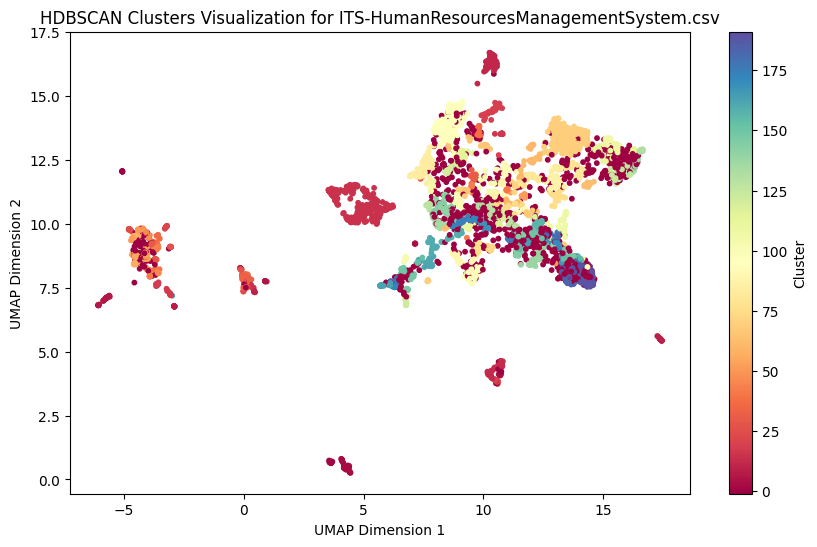

Number of clusters found in ITS-HumanResourcesManagementSystem.csv: 192
Cluster
-1      1127
 14      382
 69      343
 96      300
 84      106
        ... 
 15        5
 180       5
 57        5
 52        5
 32        5
Name: count, Length: 193, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-HumanResourcesManagementSystem.csv

Processing: ITS-HumanSubjectIncentivePayment(HSIP).csv
Embedding column: Title


Batches: 100%|██████████| 6/6 [00:00<00:00, 12.29it/s]


Embedding column: Servicename


Batches: 100%|██████████| 6/6 [00:00<00:00, 15.23it/s]


Embedding column: Description


Batches: 100%|██████████| 6/6 [00:01<00:00,  3.27it/s]


Embedding column: Feed


Batches: 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


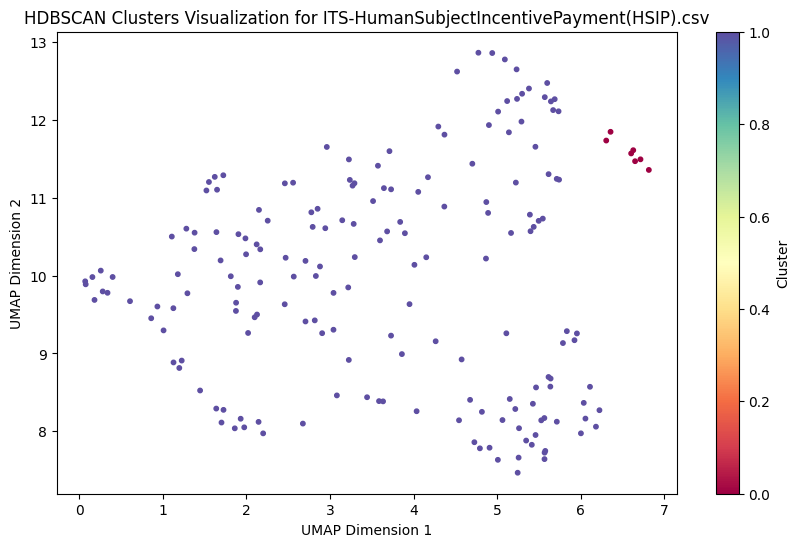

Number of clusters found in ITS-HumanSubjectIncentivePayment(HSIP).csv: 2
Cluster
1    179
0      7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-HumanSubjectIncentivePayment(HSIP).csv

Processing: ITS-IASecurityUnitLiaison.csv
Embedding column: Title


Batches: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s]


Embedding column: Servicename


Batches: 100%|██████████| 1/1 [00:00<00:00, 32.26it/s]


Embedding column: Description


Batches: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


Embedding column: Feed


Batches: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-IASecurityUnitLiaison.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-IdentityGovernanceTool.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 21.90it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 46.87it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  4.17it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.22it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


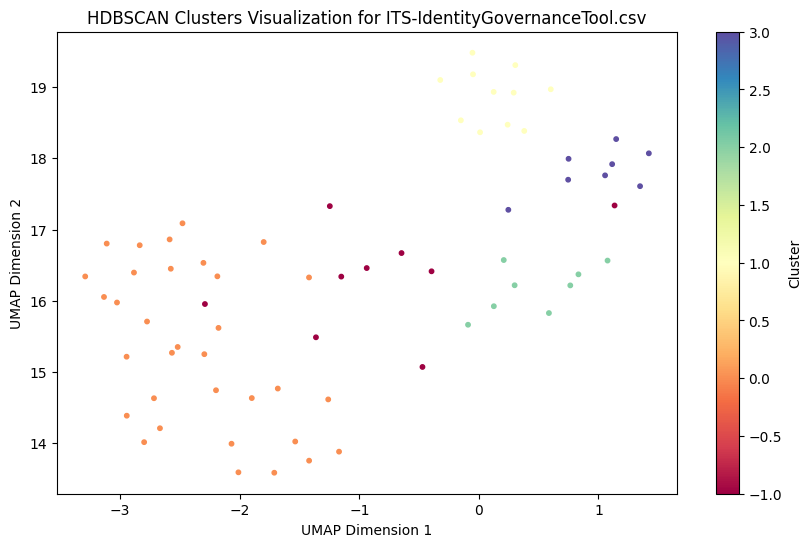

Number of clusters found in ITS-IdentityGovernanceTool.csv: 4
Cluster
 0    33
 1    11
-1     9
 2     8
 3     8
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-IdentityGovernanceTool.csv

Processing: ITS-In-BuildingNetworks.csv
Embedding column: Title


Batches: 100%|██████████| 110/110 [00:09<00:00, 11.24it/s]


Embedding column: Servicename


Batches: 100%|██████████| 110/110 [00:05<00:00, 21.94it/s]


Embedding column: Description


Batches: 100%|██████████| 110/110 [00:47<00:00,  2.29it/s]


Embedding column: Feed


Batches: 100%|██████████| 110/110 [00:57<00:00,  1.90it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


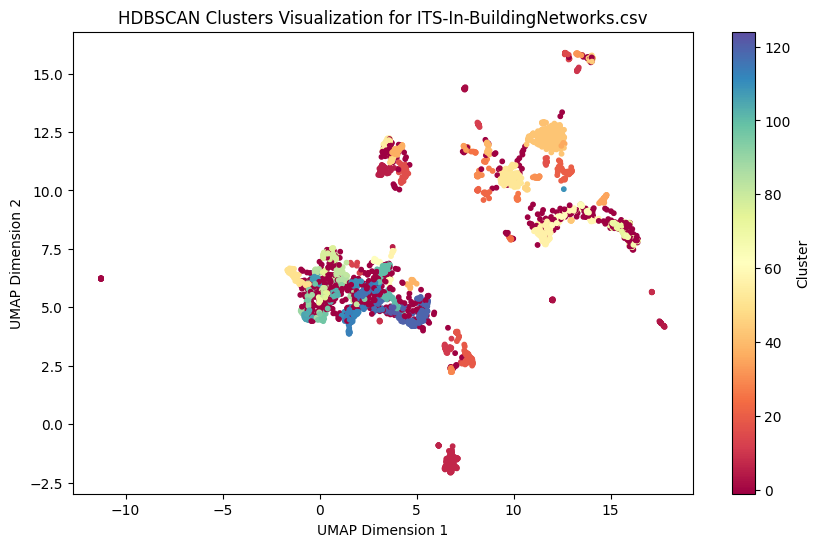

Number of clusters found in ITS-In-BuildingNetworks.csv: 125
Cluster
-1      714
 42     304
 52     145
 7      140
 119    124
       ... 
 14       5
 48       5
 54       5
 9        5
 69       5
Name: count, Length: 126, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-In-BuildingNetworks.csv

Processing: ITS-InCommonCertificateService.csv
Embedding column: Title


Batches: 100%|██████████| 170/170 [00:13<00:00, 12.34it/s]


Embedding column: Servicename


Batches: 100%|██████████| 170/170 [00:06<00:00, 24.34it/s]


Embedding column: Description


Batches: 100%|██████████| 170/170 [01:48<00:00,  1.56it/s]


Embedding column: Feed


Batches: 100%|██████████| 170/170 [00:25<00:00,  6.60it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


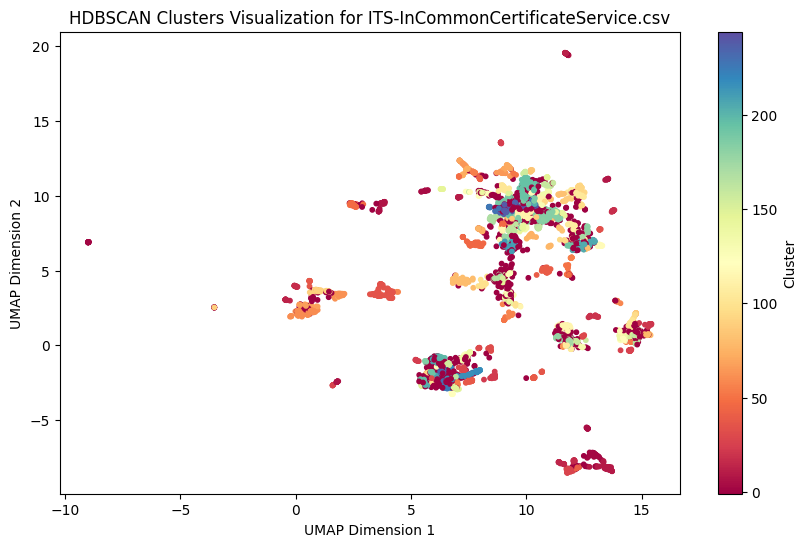

Number of clusters found in ITS-InCommonCertificateService.csv: 245
Cluster
-1      1165
 60      147
 183     138
 195     138
 35      106
        ... 
 229       5
 87        5
 68        5
 135       5
 220       5
Name: count, Length: 246, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-InCommonCertificateService.csv

Processing: ITS-InCommonCertificateServiceACME.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 14.79it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 28.04it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  4.09it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


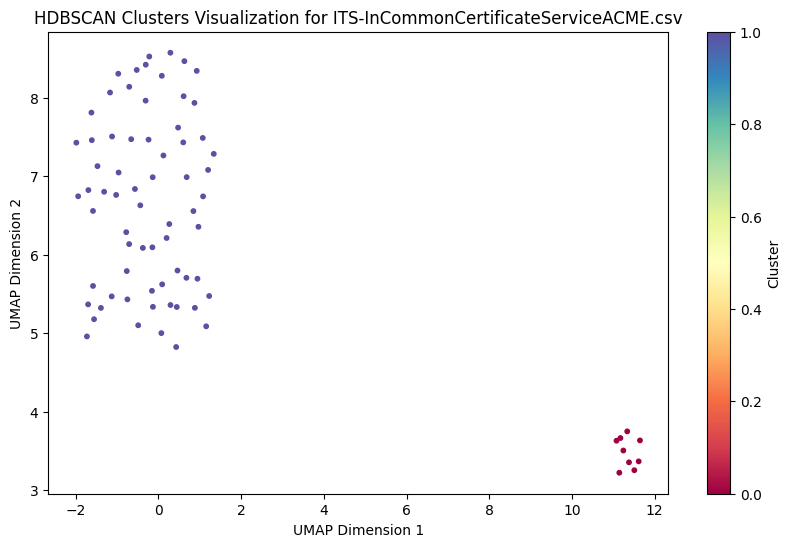

Number of clusters found in ITS-InCommonCertificateServiceACME.csv: 2
Cluster
1    67
0     9
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-InCommonCertificateServiceACME.csv

Processing: ITS-Informatica.csv
Embedding column: Title


Batches: 100%|██████████| 17/17 [00:01<00:00, 10.05it/s]


Embedding column: Servicename


Batches: 100%|██████████| 17/17 [00:00<00:00, 24.75it/s]


Embedding column: Description


Batches: 100%|██████████| 17/17 [00:06<00:00,  2.76it/s]


Embedding column: Feed


Batches: 100%|██████████| 17/17 [00:06<00:00,  2.48it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


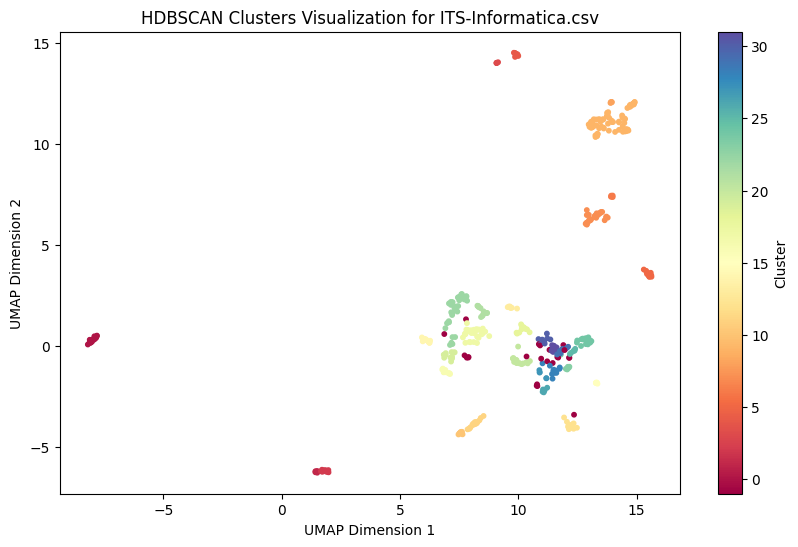

Number of clusters found in ITS-Informatica.csv: 32
Cluster
 9     76
 22    39
 7     33
 17    31
-1     24
 0     22
 24    21
 12    20
 11    19
 5     18
 20    16
 28    16
 16    14
 14    14
 4     13
 19    13
 2     12
 21    12
 18    12
 31    10
 10    10
 26     9
 29     9
 30     8
 1      6
 13     6
 15     6
 25     6
 23     5
 3      5
 27     5
 8      5
 6      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Informatica.csv

Processing: ITS-InformaticaCloudatU-M.csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 33.33it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-InformaticaCloudatU-M.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-Internet.csv
Embedding column: Title


Batches: 100%|██████████| 8/8 [00:00<00:00, 13.52it/s]


Embedding column: Servicename


Batches: 100%|██████████| 8/8 [00:00<00:00, 20.05it/s]


Embedding column: Description


Batches: 100%|██████████| 8/8 [00:02<00:00,  3.39it/s]


Embedding column: Feed


Batches: 100%|██████████| 8/8 [00:04<00:00,  1.68it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


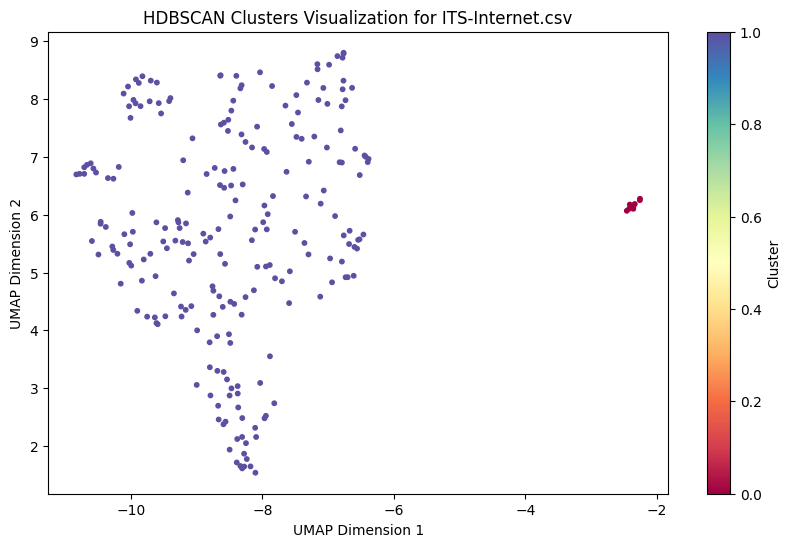

Number of clusters found in ITS-Internet.csv: 2
Cluster
1    230
0      9
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Internet.csv

Processing: ITS-InventoryApplicationServiceModule.csv
Embedding column: Title


Batches: 100%|██████████| 7/7 [00:00<00:00, 23.01it/s]


Embedding column: Servicename


Batches: 100%|██████████| 7/7 [00:00<00:00, 29.66it/s]


Embedding column: Description


Batches: 100%|██████████| 7/7 [00:02<00:00,  3.38it/s]


Embedding column: Feed


Batches: 100%|██████████| 7/7 [00:01<00:00,  4.40it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


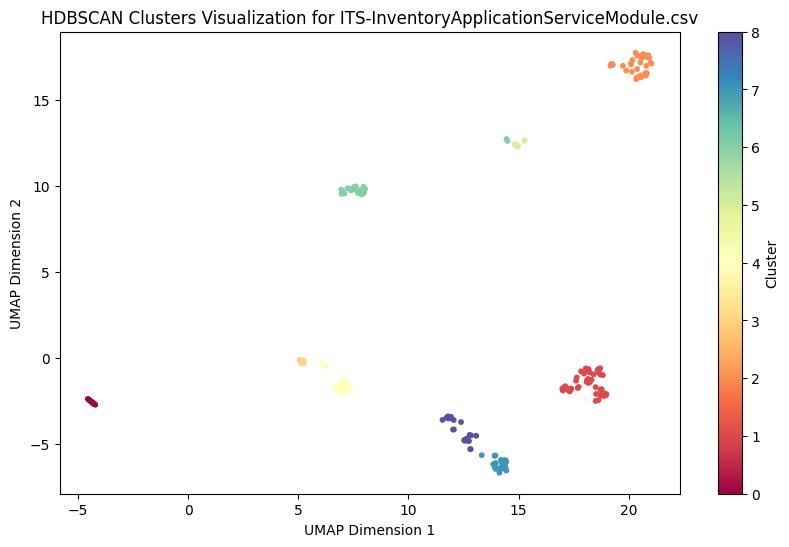

Number of clusters found in ITS-InventoryApplicationServiceModule.csv: 9
Cluster
1    47
2    36
6    26
8    23
4    23
7    21
0    12
3     9
5     7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-InventoryApplicationServiceModule.csv

Processing: ITS-IzzyforMacPlatformasaService.csv
Embedding column: Title


Batches: 100%|██████████| 18/18 [00:01<00:00, 12.04it/s]


Embedding column: Servicename


Batches: 100%|██████████| 18/18 [00:00<00:00, 28.17it/s]


Embedding column: Description


Batches: 100%|██████████| 18/18 [00:07<00:00,  2.47it/s]


Embedding column: Feed


Batches: 100%|██████████| 18/18 [00:03<00:00,  4.92it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


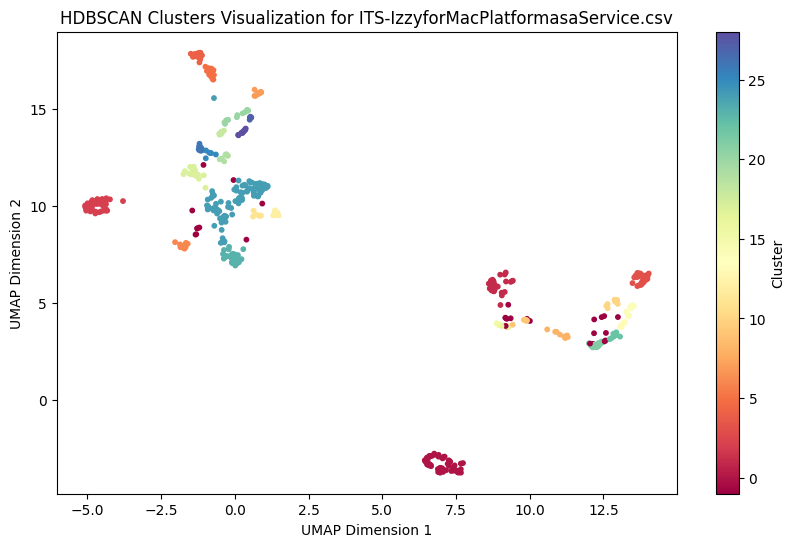

Number of clusters found in ITS-IzzyforMacPlatformasaService.csv: 29
Cluster
 24    91
 0     55
 2     45
 1     36
 23    33
 3     31
-1     29
 5     18
 4     18
 17    18
 6     17
 21    16
 7     13
 26    12
 20    12
 12    11
 28    10
 8     10
 10    10
 14    10
 22     9
 9      8
 13     8
 18     7
 15     7
 19     7
 25     6
 11     6
 27     5
 16     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-IzzyforMacPlatformasaService.csv

Processing: ITS-LDAPAccesstoMCommunity.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 26.79it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 30.61it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  3.55it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


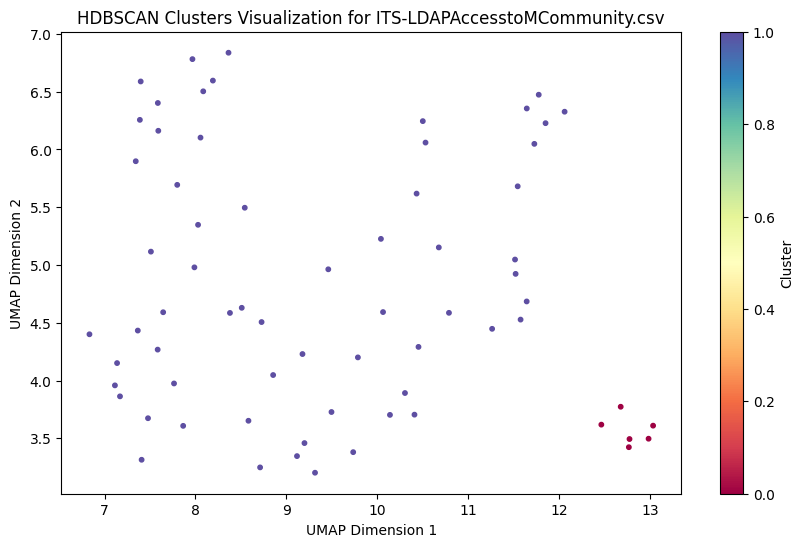

Number of clusters found in ITS-LDAPAccesstoMCommunity.csv: 2
Cluster
1    62
0     6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-LDAPAccesstoMCommunity.csv

Processing: ITS-Lighthouse(HPCClusterforResearcher-OwnedHardware).csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 11.79it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 16.60it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:01<00:00,  2.18it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


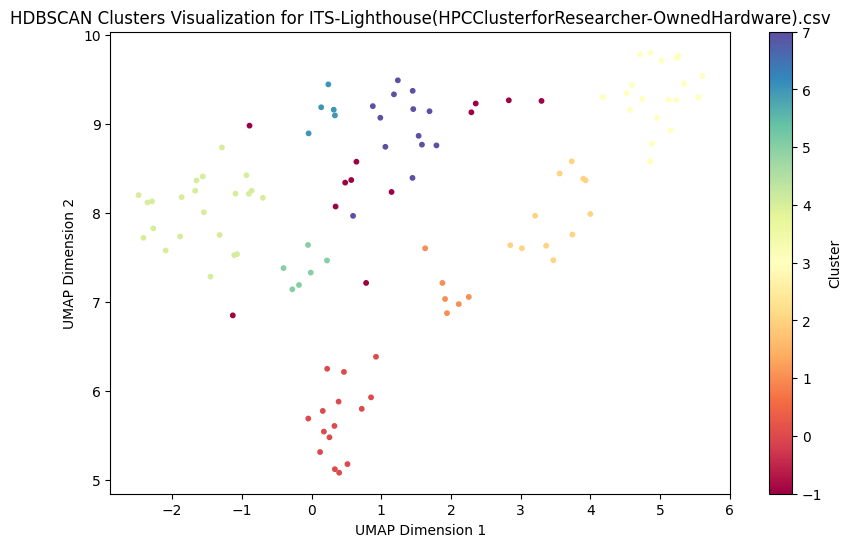

Number of clusters found in ITS-Lighthouse(HPCClusterforResearcher-OwnedHardware).csv: 8
Cluster
 4    22
 3    19
 0    15
 7    13
-1    12
 2    11
 5     6
 1     6
 6     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Lighthouse(HPCClusterforResearcher-OwnedHardware).csv

Processing: ITS-LinkedInLearning.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 22.24it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 36.14it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  3.45it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:02<00:00,  1.49it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


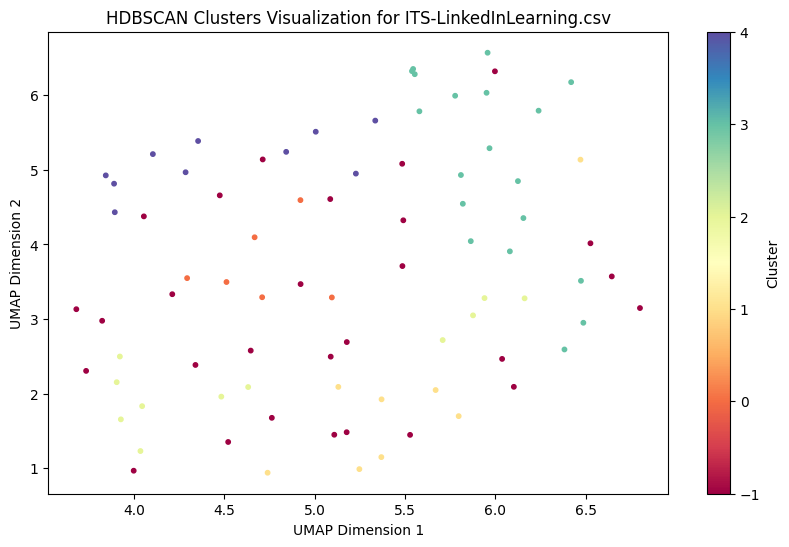

Number of clusters found in ITS-LinkedInLearning.csv: 5
Cluster
-1    28
 3    19
 2    11
 4    10
 1     8
 0     6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-LinkedInLearning.csv

Processing: ITS-LinuxServerSupport.csv
Embedding column: Title


Batches: 100%|██████████| 68/68 [00:05<00:00, 11.52it/s]


Embedding column: Servicename


Batches: 100%|██████████| 68/68 [00:02<00:00, 31.21it/s]


Embedding column: Description


Batches: 100%|██████████| 68/68 [00:34<00:00,  2.00it/s]


Embedding column: Feed


Batches: 100%|██████████| 68/68 [00:14<00:00,  4.67it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


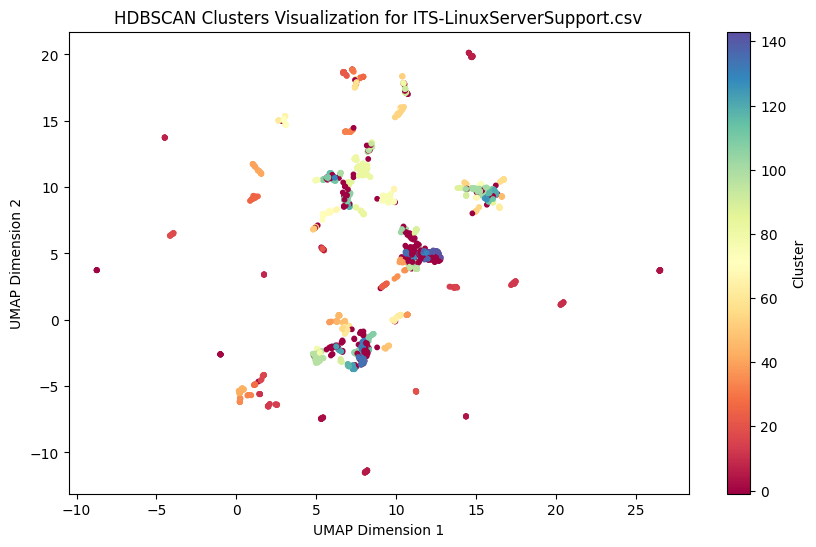

Number of clusters found in ITS-LinuxServerSupport.csv: 144
Cluster
-1      306
 82      80
 97      77
 101     74
 53      55
       ... 
 130      5
 52       5
 71       5
 112      5
 55       5
Name: count, Length: 145, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-LinuxServerSupport.csv

Processing: ITS-LiveEventStreaming.csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00, 29.41it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 45.46it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  8.93it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-LiveEventStreaming.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-LockerLarge-FileStorage.csv
Embedding column: Title


Batches: 100%|██████████| 5/5 [00:00<00:00, 13.30it/s]


Embedding column: Servicename


Batches: 100%|██████████| 5/5 [00:00<00:00, 30.86it/s]


Embedding column: Description


Batches: 100%|██████████| 5/5 [00:02<00:00,  2.16it/s]


Embedding column: Feed


Batches: 100%|██████████| 5/5 [00:01<00:00,  2.61it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


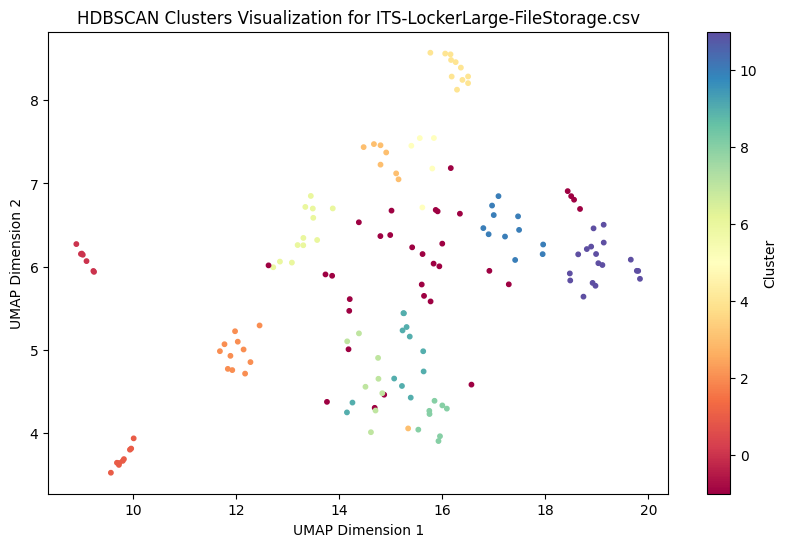

Number of clusters found in ITS-LockerLarge-FileStorage.csv: 12
Cluster
-1     32
 11    18
 9     12
 6     12
 2     11
 4     11
 10    11
 1      9
 8      8
 3      8
 7      8
 0      7
 5      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-LockerLarge-FileStorage.csv

Processing: ITS-M-MarketsiteSupport.csv
Embedding column: Title


Batches: 100%|██████████| 45/45 [00:01<00:00, 23.31it/s]


Embedding column: Servicename


Batches: 100%|██████████| 45/45 [00:01<00:00, 27.49it/s]


Embedding column: Description


Batches: 100%|██████████| 45/45 [00:10<00:00,  4.12it/s]


Embedding column: Feed


Batches: 100%|██████████| 45/45 [00:25<00:00,  1.78it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


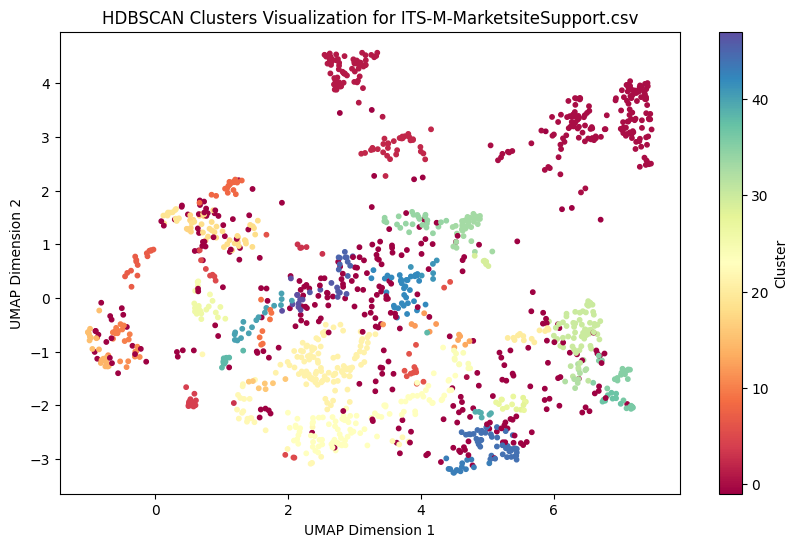

Number of clusters found in ITS-M-MarketsiteSupport.csv: 48
Cluster
-1     310
 0     161
 21    103
 23     99
 1      71
 30     61
 44     43
 2      35
 42     34
 33     33
 18     32
 22     27
 34     26
 8      20
 26     19
 40     18
 35     16
 7      15
 6      15
 10     15
 43     15
 20     13
 4      13
 17     13
 19     13
 47     12
 14     12
 38     11
 45     11
 32     11
 5      10
 27     10
 24     10
 15      9
 37      9
 11      9
 36      9
 46      8
 9       8
 16      7
 29      7
 13      6
 12      6
 3       6
 39      6
 41      6
 31      5
 28      5
 25      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-M-MarketsiteSupport.csv

Processing: ITS-M-Reports.csv
Embedding column: Title


Batches: 100%|██████████| 17/17 [00:00<00:00, 21.36it/s]


Embedding column: Servicename


Batches: 100%|██████████| 17/17 [00:00<00:00, 33.53it/s]


Embedding column: Description


Batches: 100%|██████████| 17/17 [00:05<00:00,  3.09it/s]


Embedding column: Feed


Batches: 100%|██████████| 17/17 [00:09<00:00,  1.82it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


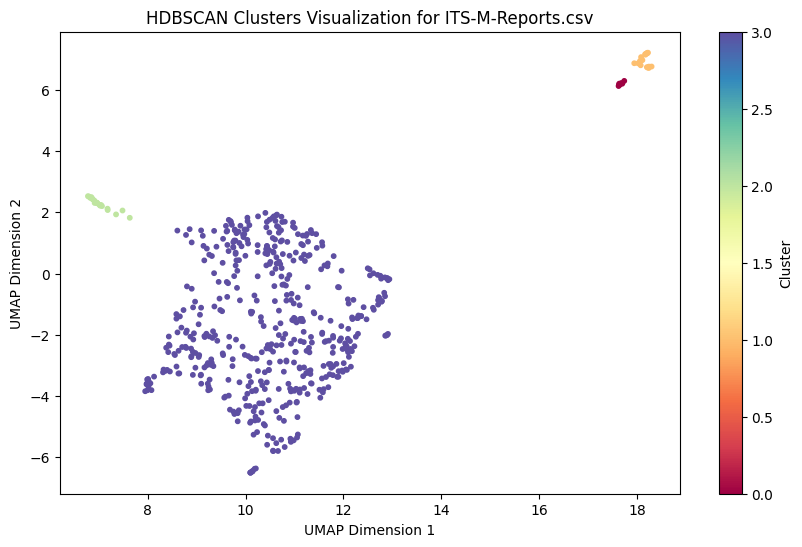

Number of clusters found in ITS-M-Reports.csv: 4
Cluster
3    497
2     21
1     18
0      8
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-M-Reports.csv

Processing: ITS-MailRelay.csv
Embedding column: Title


Batches: 100%|██████████| 13/13 [00:00<00:00, 19.82it/s]


Embedding column: Servicename


Batches: 100%|██████████| 13/13 [00:00<00:00, 33.16it/s]


Embedding column: Description


Batches: 100%|██████████| 13/13 [00:05<00:00,  2.43it/s]


Embedding column: Feed


Batches: 100%|██████████| 13/13 [00:05<00:00,  2.40it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


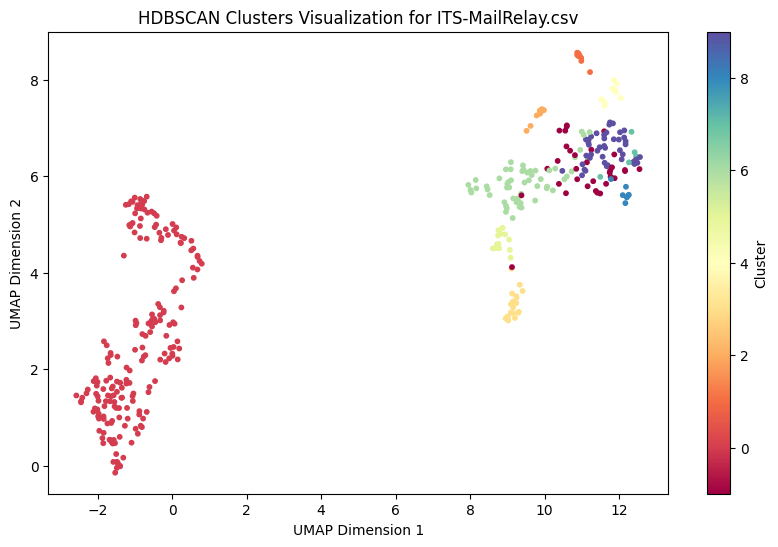

Number of clusters found in ITS-MailRelay.csv: 10
Cluster
 0    198
 6     56
 9     44
-1     33
 3     20
 5     14
 2      9
 1      9
 4      9
 8      7
 7      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MailRelay.csv

Processing: ITS-MailRouting.csv
Embedding column: Title


Batches: 100%|██████████| 36/36 [00:01<00:00, 20.77it/s]


Embedding column: Servicename


Batches: 100%|██████████| 36/36 [00:00<00:00, 39.43it/s]


Embedding column: Description


Batches: 100%|██████████| 36/36 [00:16<00:00,  2.12it/s]


Embedding column: Feed


Batches: 100%|██████████| 36/36 [00:22<00:00,  1.61it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


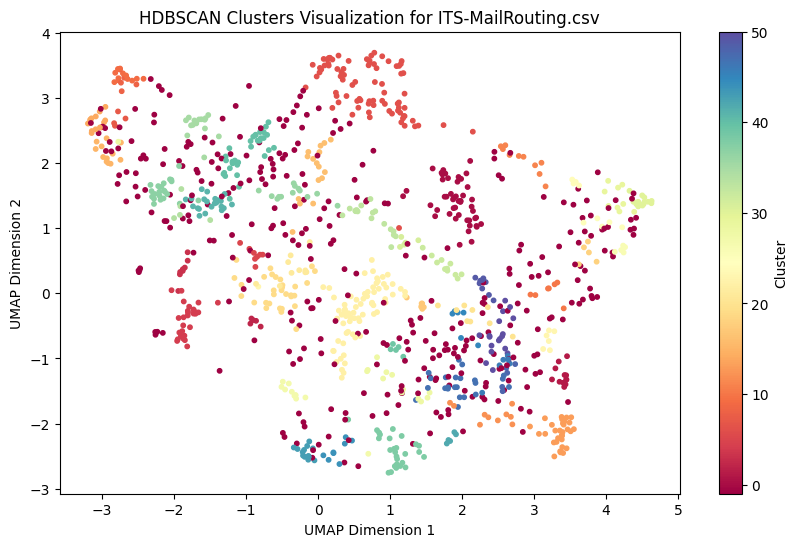

Number of clusters found in ITS-MailRouting.csv: 51
Cluster
-1     344
 6      82
 22     70
 0      48
 40     32
 13     31
 19     31
 38     27
 4      27
 47     23
 37     22
 41     22
 50     18
 33     17
 16     16
 30     16
 35     15
 28     14
 14     13
 43     13
 36     13
 9      12
 1      12
 15     12
 27     11
 32     11
 21     10
 11     10
 12     10
 49      9
 20      9
 29      9
 44      8
 3       8
 5       8
 10      7
 23      7
 8       6
 45      6
 46      6
 17      6
 42      5
 7       5
 39      5
 2       5
 31      5
 48      5
 25      5
 26      5
 18      5
 34      5
 24      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MailRouting.csv

Processing: ITS-Mcard.csv
Embedding column: Title


Batches: 100%|██████████| 8/8 [00:00<00:00, 21.32it/s]


Embedding column: Servicename


Batches: 100%|██████████| 8/8 [00:00<00:00, 42.01it/s]


Embedding column: Description


Batches: 100%|██████████| 8/8 [00:02<00:00,  3.73it/s]


Embedding column: Feed


Batches: 100%|██████████| 8/8 [00:04<00:00,  1.66it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


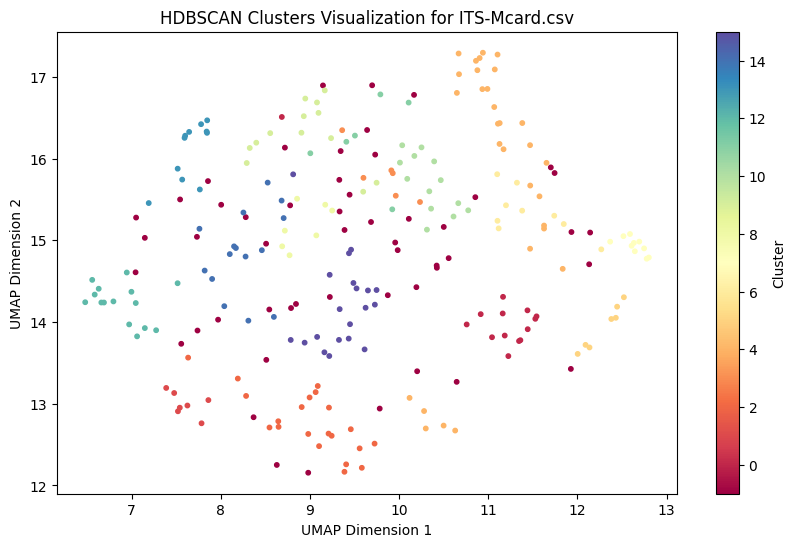

Number of clusters found in ITS-Mcard.csv: 16
Cluster
-1     52
 4     30
 2     21
 15    20
 14    15
 12    15
 0     14
 9     13
 10    13
 13    11
 7     10
 6      9
 5      7
 8      7
 1      7
 3      6
 11     6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Mcard.csv

Processing: ITS-MCommunityDirectory.csv
Embedding column: Title


Batches: 100%|██████████| 143/143 [00:08<00:00, 16.72it/s]


Embedding column: Servicename


Batches: 100%|██████████| 143/143 [00:06<00:00, 22.07it/s]


Embedding column: Description


Batches: 100%|██████████| 143/143 [00:44<00:00,  3.22it/s]


Embedding column: Feed


Batches: 100%|██████████| 143/143 [01:23<00:00,  1.71it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


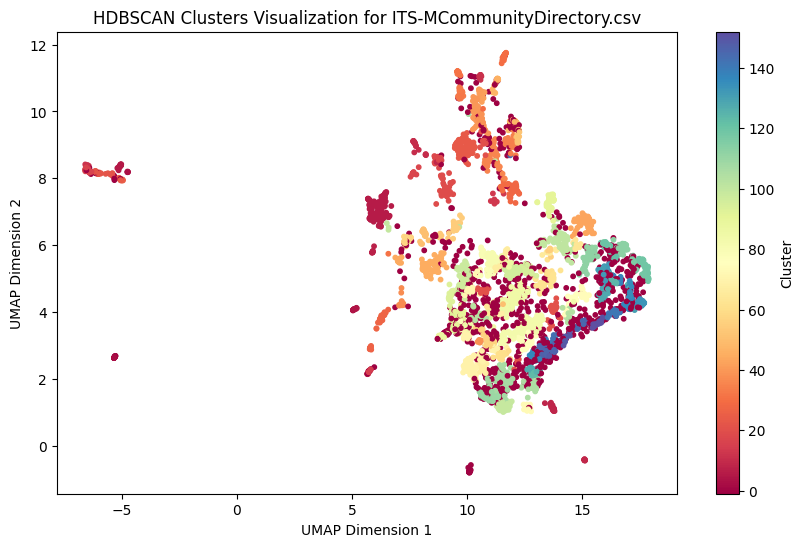

Number of clusters found in ITS-MCommunityDirectory.csv: 153
Cluster
-1      889
 6      153
 83     129
 23     127
 85     119
       ... 
 114      5
 148      5
 25       5
 86       5
 3        5
Name: count, Length: 154, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MCommunityDirectory.csv

Processing: ITS-MCommunitySponsoredAccount.csv
Embedding column: Title


Batches: 100%|██████████| 54/54 [00:02<00:00, 19.53it/s]


Embedding column: Servicename


Batches: 100%|██████████| 54/54 [00:02<00:00, 23.80it/s]


Embedding column: Description


Batches: 100%|██████████| 54/54 [00:14<00:00,  3.65it/s]


Embedding column: Feed


Batches: 100%|██████████| 54/54 [00:31<00:00,  1.70it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


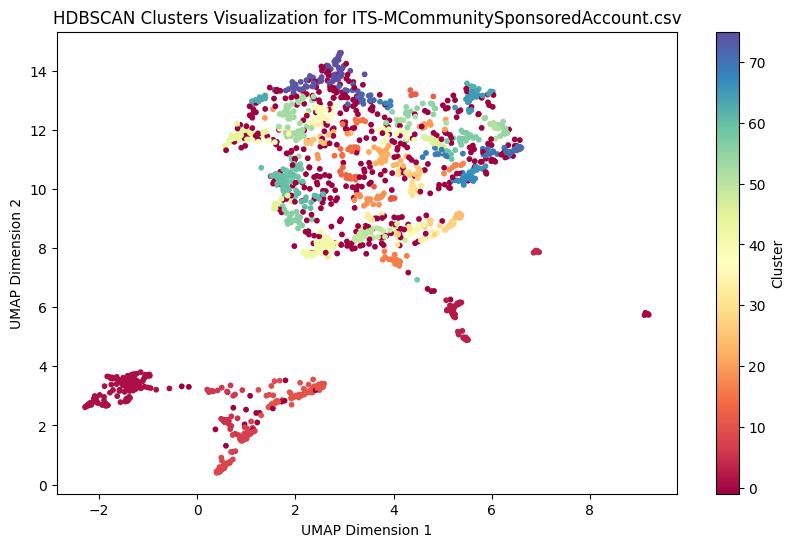

Number of clusters found in ITS-MCommunitySponsoredAccount.csv: 76
Cluster
-1     423
 1     125
 10     74
 53     59
 75     51
      ... 
 73      5
 12      5
 29      5
 64      5
 38      5
Name: count, Length: 77, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MCommunitySponsoredAccount.csv

Processing: ITS-MiBackup.csv
Embedding column: Title


Batches: 100%|██████████| 16/16 [00:00<00:00, 24.17it/s]


Embedding column: Servicename


Batches: 100%|██████████| 16/16 [00:00<00:00, 39.03it/s]


Embedding column: Description


Batches: 100%|██████████| 16/16 [00:07<00:00,  2.26it/s]


Embedding column: Feed


Batches: 100%|██████████| 16/16 [00:05<00:00,  2.86it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


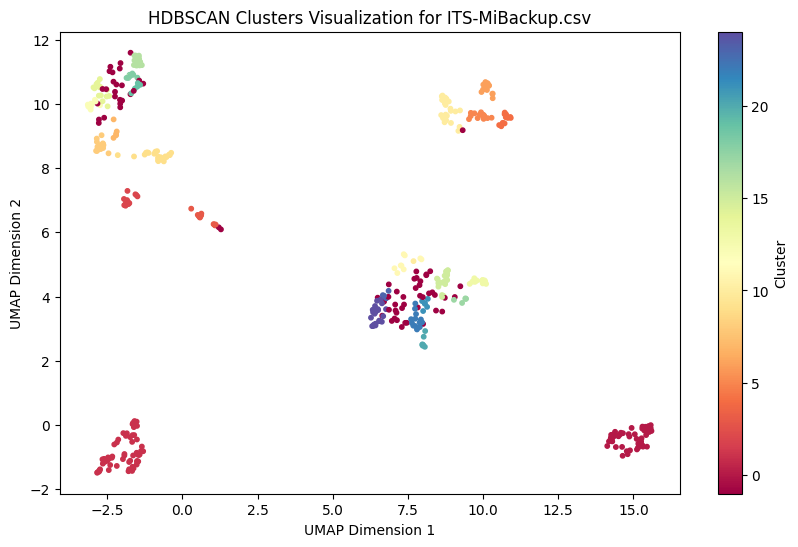

Number of clusters found in ITS-MiBackup.csv: 25
Cluster
-1     68
 1     63
 0     50
 10    27
 9     24
 24    22
 15    19
 8     18
 13    18
 6     17
 2     16
 16    16
 5     15
 14    15
 22    14
 4     13
 3     13
 12    11
 11     9
 20     8
 18     7
 21     6
 23     5
 19     5
 7      5
 17     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiBackup.csv

Processing: ITS-MichiganApp.csv
Embedding column: Title


Batches: 100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


Embedding column: Servicename


Batches: 100%|██████████| 6/6 [00:00<00:00, 37.97it/s]


Embedding column: Description


Batches: 100%|██████████| 6/6 [00:01<00:00,  3.07it/s]


Embedding column: Feed


Batches: 100%|██████████| 6/6 [00:03<00:00,  1.73it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


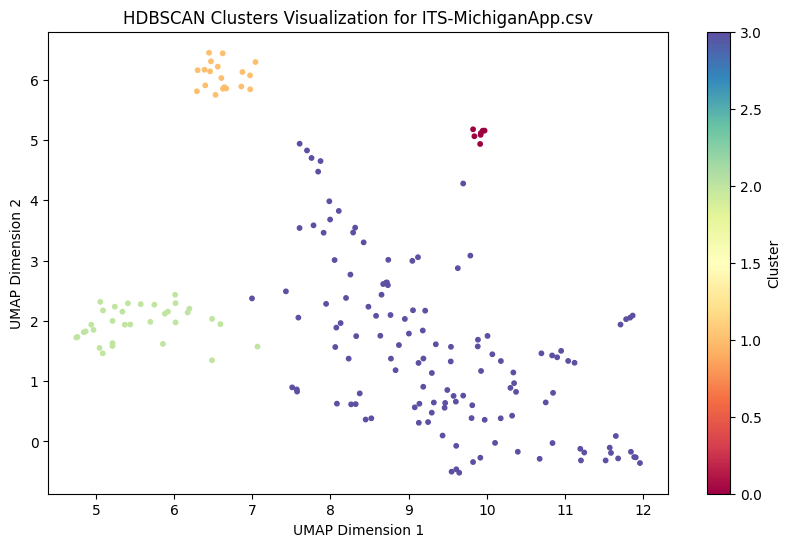

Number of clusters found in ITS-MichiganApp.csv: 4
Cluster
3    127
2     33
1     19
0      7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MichiganApp.csv

Processing: ITS-MicrosoftAzureatU-M.csv
Embedding column: Title


Batches: 100%|██████████| 8/8 [00:00<00:00, 22.91it/s]


Embedding column: Servicename


Batches: 100%|██████████| 8/8 [00:00<00:00, 27.68it/s]


Embedding column: Description


Batches: 100%|██████████| 8/8 [00:02<00:00,  2.77it/s]


Embedding column: Feed


Batches: 100%|██████████| 8/8 [00:03<00:00,  2.37it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


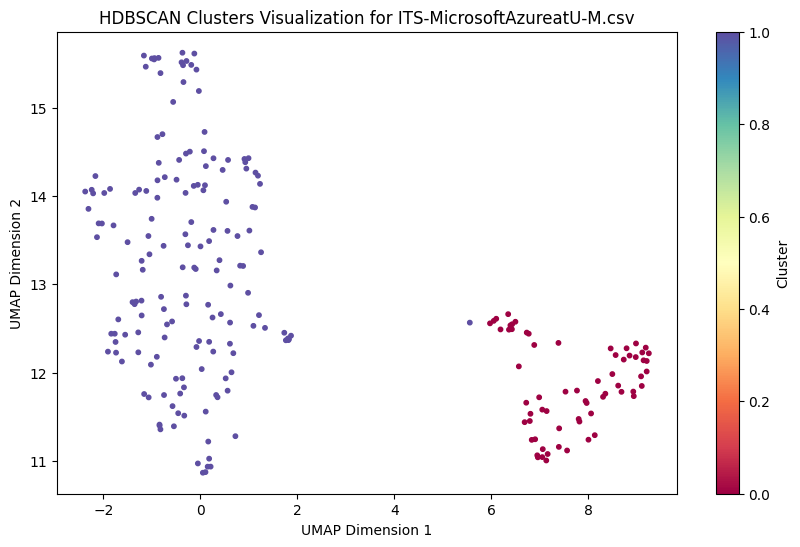

Number of clusters found in ITS-MicrosoftAzureatU-M.csv: 2
Cluster
1    162
0     65
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MicrosoftAzureatU-M.csv

Processing: ITS-MicrosoftAzureatU-MAccountRequests.csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 29.53it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 29.63it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:00<00:00,  7.08it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


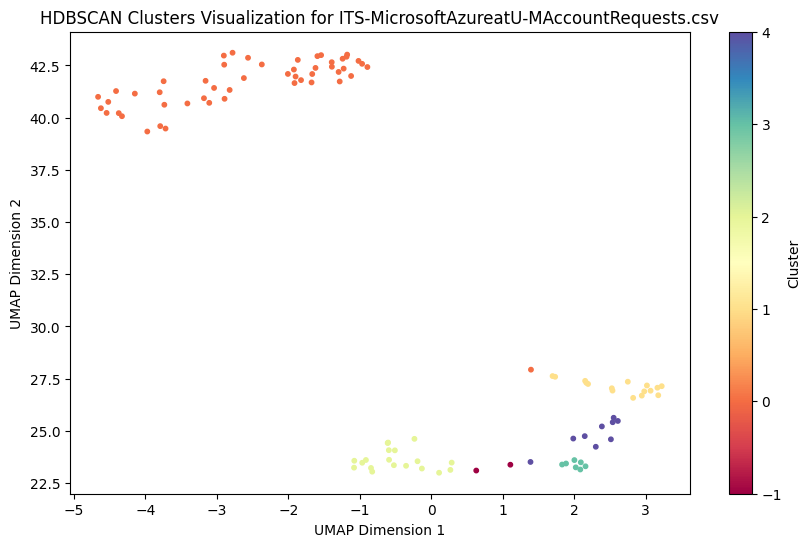

Number of clusters found in ITS-MicrosoftAzureatU-MAccountRequests.csv: 5
Cluster
 0    51
 2    19
 1    16
 4     9
 3     7
-1     2
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MicrosoftAzureatU-MAccountRequests.csv

Processing: ITS-MicrosoftExchangeVoicemail.csv
Embedding column: Title


Batches: 100%|██████████| 15/15 [00:01<00:00, 13.80it/s]


Embedding column: Servicename


Batches: 100%|██████████| 15/15 [00:00<00:00, 28.20it/s]


Embedding column: Description


Batches: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]


Embedding column: Feed


Batches: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


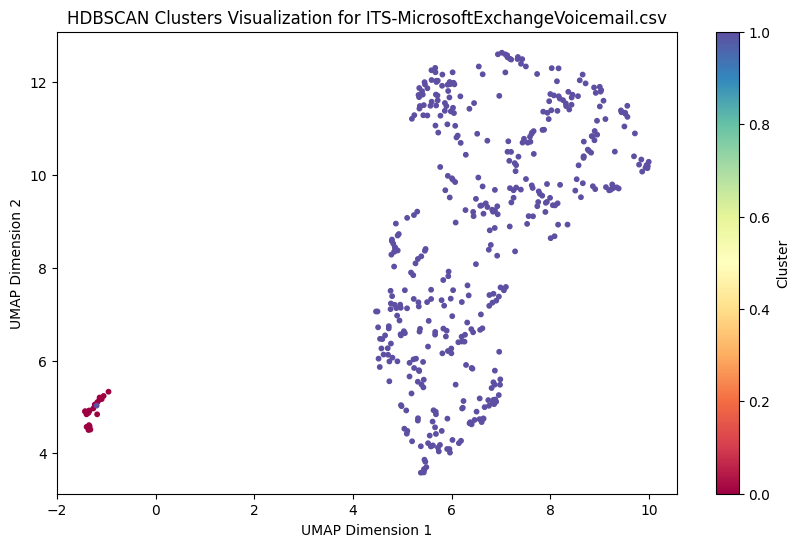

Number of clusters found in ITS-MicrosoftExchangeVoicemail.csv: 2
Cluster
1    435
0     21
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MicrosoftExchangeVoicemail.csv

Processing: ITS-MicrosoftTeams.csv
Embedding column: Title


Batches: 100%|██████████| 7/7 [00:00<00:00, 24.98it/s]


Embedding column: Servicename


Batches: 100%|██████████| 7/7 [00:00<00:00, 39.86it/s]


Embedding column: Description


Batches: 100%|██████████| 7/7 [00:01<00:00,  4.16it/s]


Embedding column: Feed


Batches: 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


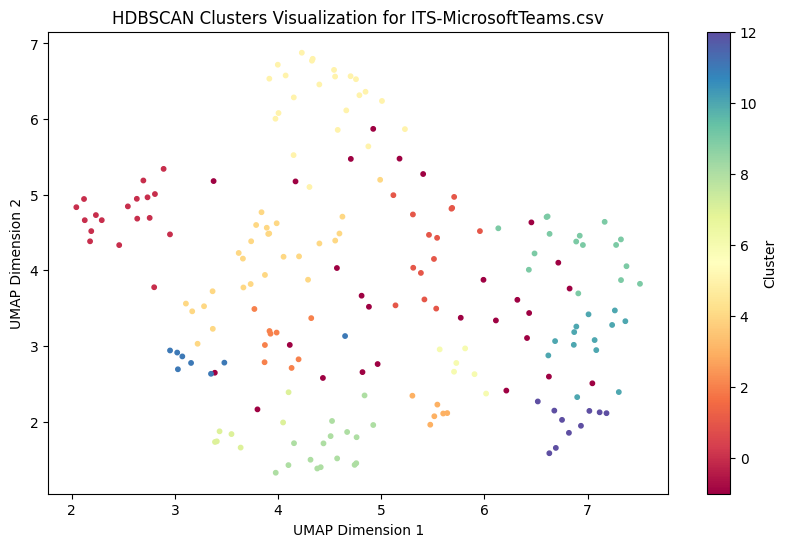

Number of clusters found in ITS-MicrosoftTeams.csv: 13
Cluster
-1     27
 4     26
 5     23
 0     18
 8     16
 9     16
 1     14
 10    13
 12    10
 2      9
 11     8
 7      7
 3      6
 6      6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MicrosoftTeams.csv

Processing: ITS-MiDatabase.csv
Embedding column: Title


Batches: 100%|██████████| 18/18 [00:01<00:00, 17.93it/s]


Embedding column: Servicename


Batches: 100%|██████████| 18/18 [00:00<00:00, 20.73it/s]


Embedding column: Description


Batches: 100%|██████████| 18/18 [00:06<00:00,  2.61it/s]


Embedding column: Feed


Batches: 100%|██████████| 18/18 [00:08<00:00,  2.03it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


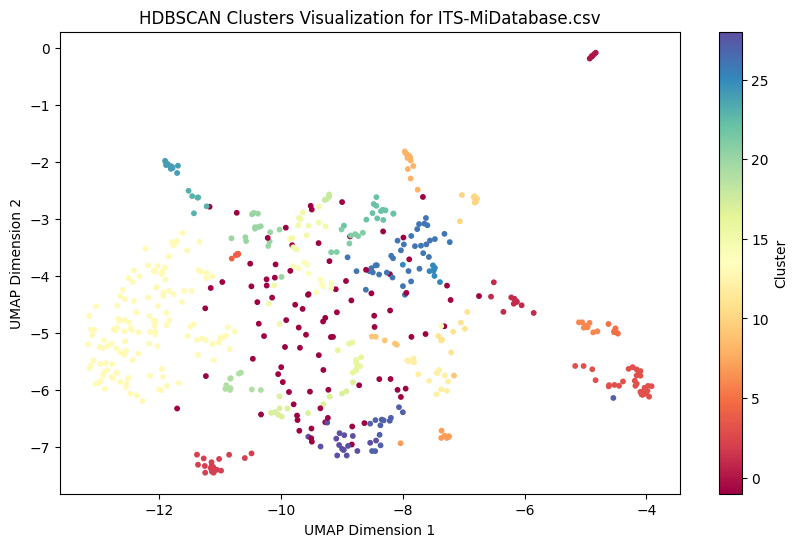

Number of clusters found in ITS-MiDatabase.csv: 29
Cluster
 13    132
-1      90
 26     36
 3      30
 2      18
 28     17
 15     16
 20     15
 27     14
 12     14
 1      13
 17     13
 14     13
 22     13
 8      12
 16     11
 19     10
 24     10
 10      9
 11      8
 21      8
 6       8
 25      8
 7       7
 9       6
 0       6
 5       6
 23      6
 4       5
 18      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiDatabase.csv

Processing: ITS-MiDatabaseAccountRequests.csv
Embedding column: Title


Batches: 100%|██████████| 11/11 [00:00<00:00, 32.27it/s]


Embedding column: Servicename


Batches: 100%|██████████| 11/11 [00:00<00:00, 30.30it/s]


Embedding column: Description


Batches: 100%|██████████| 11/11 [00:03<00:00,  3.11it/s]


Embedding column: Feed


Batches: 100%|██████████| 11/11 [00:04<00:00,  2.31it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


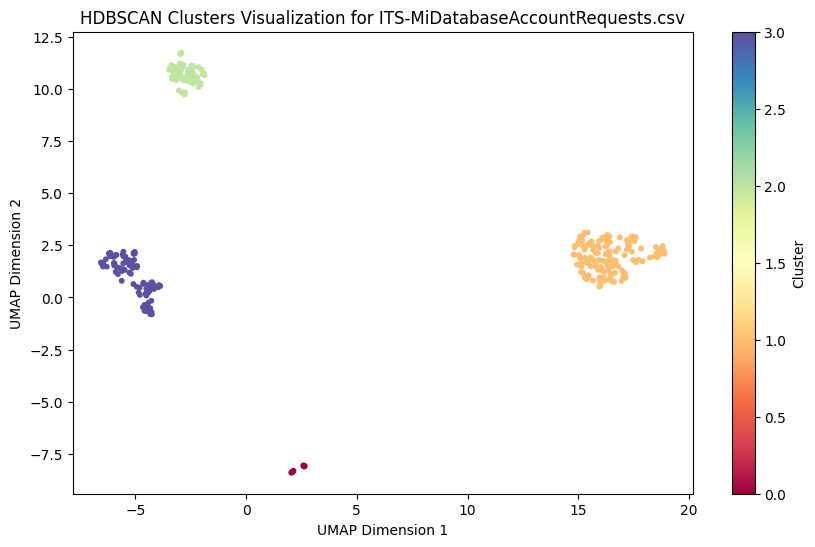

Number of clusters found in ITS-MiDatabaseAccountRequests.csv: 4
Cluster
1    148
3     94
2     67
0     12
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiDatabaseAccountRequests.csv

Processing: ITS-MiDesktop.csv
Embedding column: Title


Batches: 100%|██████████| 8/8 [00:00<00:00, 16.77it/s]


Embedding column: Servicename


Batches: 100%|██████████| 8/8 [00:00<00:00, 16.06it/s]


Embedding column: Description


Batches: 100%|██████████| 8/8 [00:03<00:00,  2.61it/s]


Embedding column: Feed


Batches: 100%|██████████| 8/8 [00:03<00:00,  2.50it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


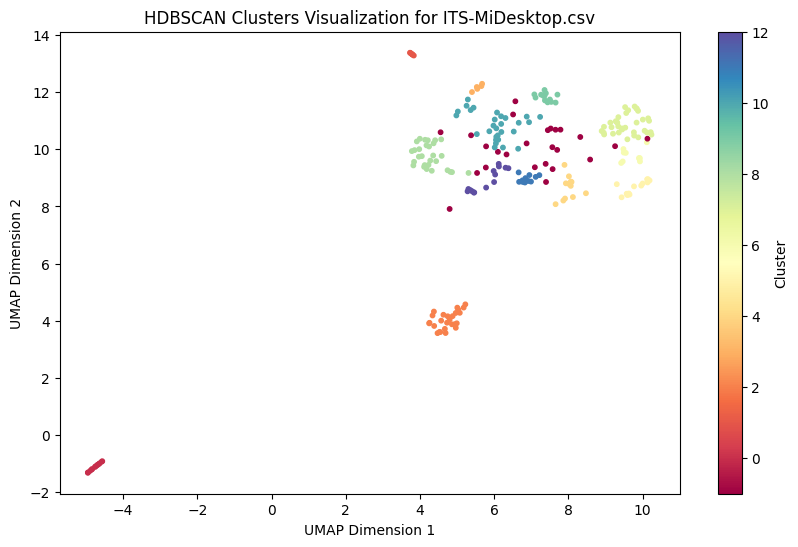

Number of clusters found in ITS-MiDesktop.csv: 13
Cluster
 7     35
 10    29
 8     29
 2     26
-1     25
 12    14
 0     13
 9     13
 5     13
 4     12
 11    11
 6     10
 1      6
 3      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiDesktop.csv

Processing: ITS-MiDesktopModifyPool.csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.98it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


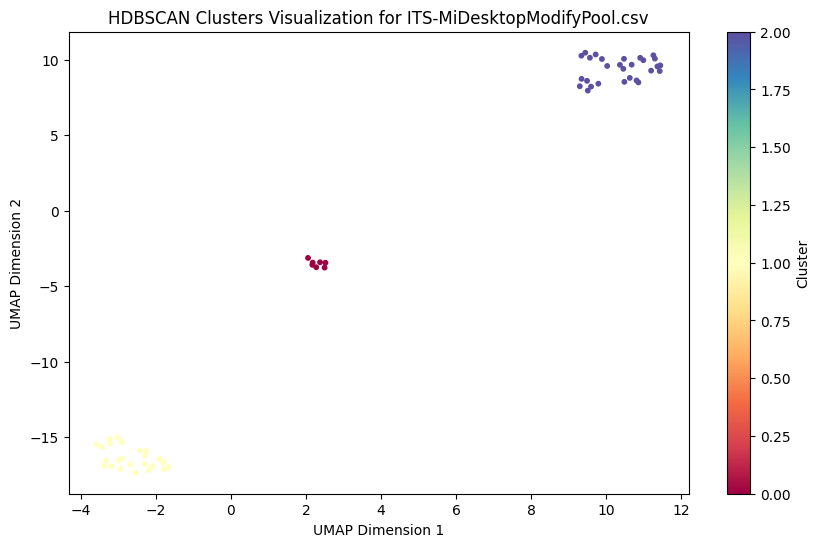

Number of clusters found in ITS-MiDesktopModifyPool.csv: 3
Cluster
2    28
1    24
0     7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiDesktopModifyPool.csv

Processing: ITS-MiServer.csv
Embedding column: Title


Batches: 100%|██████████| 96/96 [00:07<00:00, 13.32it/s]


Embedding column: Servicename


Batches: 100%|██████████| 96/96 [00:04<00:00, 22.60it/s]


Embedding column: Description


Batches: 100%|██████████| 96/96 [00:42<00:00,  2.26it/s]


Embedding column: Feed


Batches: 100%|██████████| 96/96 [00:37<00:00,  2.54it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


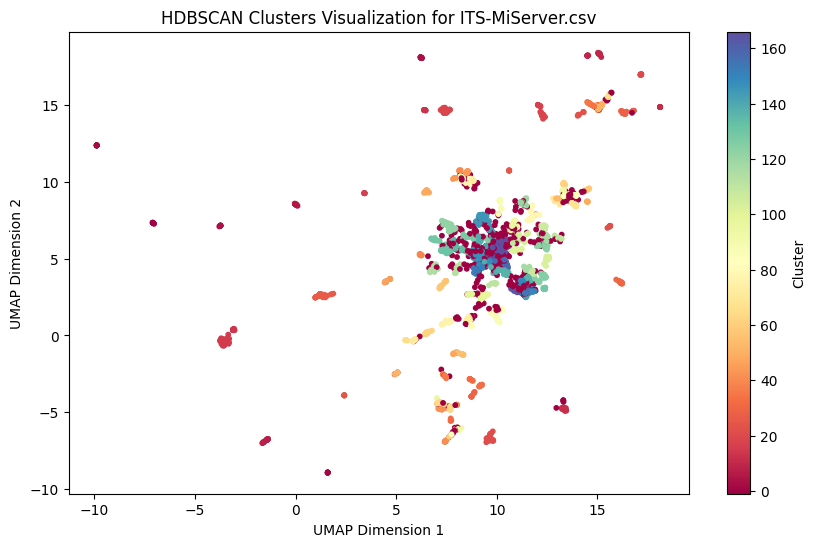

Number of clusters found in ITS-MiServer.csv: 167
Cluster
-1      546
 166     73
 15      67
 26      60
 21      60
       ... 
 66       5
 37       5
 31       5
 92       5
 82       5
Name: count, Length: 168, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiServer.csv

Processing: ITS-MiServerRequests.csv
Embedding column: Title


Batches: 100%|██████████| 113/113 [00:05<00:00, 20.72it/s]


Embedding column: Servicename


Batches: 100%|██████████| 113/113 [00:03<00:00, 31.01it/s]


Embedding column: Description


Batches: 100%|██████████| 113/113 [00:51<00:00,  2.19it/s]


Embedding column: Feed


Batches: 100%|██████████| 113/113 [01:04<00:00,  1.76it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


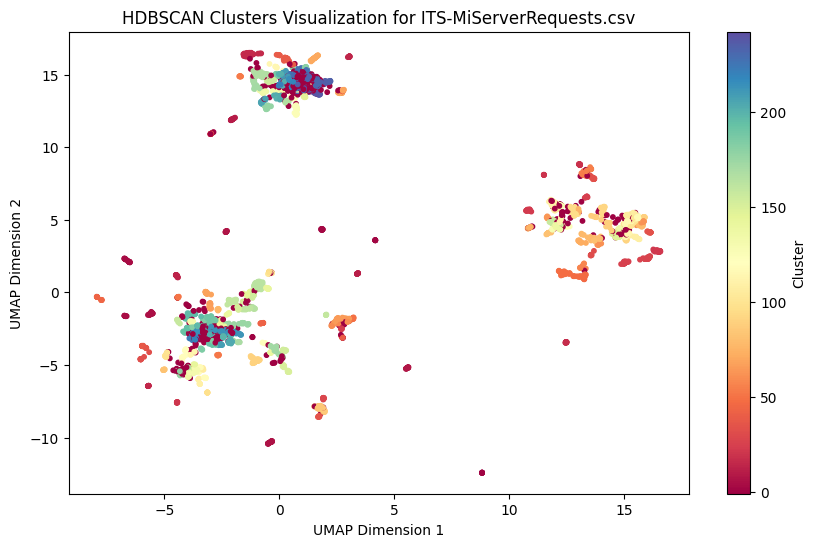

Number of clusters found in ITS-MiServerRequests.csv: 243
Cluster
-1      566
 167     68
 16      67
 48      51
 90      46
       ... 
 198      5
 123      5
 102      5
 202      5
 101      5
Name: count, Length: 244, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiServerRequests.csv

Processing: ITS-MiStorage.csv
Embedding column: Title


Batches: 100%|██████████| 35/35 [00:01<00:00, 27.16it/s]


Embedding column: Servicename


Batches: 100%|██████████| 35/35 [00:00<00:00, 40.42it/s]


Embedding column: Description


Batches: 100%|██████████| 35/35 [00:14<00:00,  2.44it/s]


Embedding column: Feed


Batches: 100%|██████████| 35/35 [00:12<00:00,  2.86it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


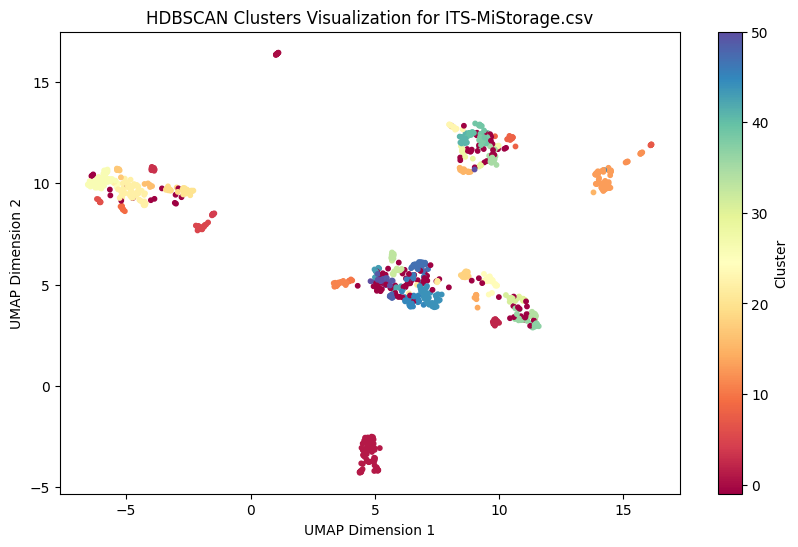

Number of clusters found in ITS-MiStorage.csv: 51
Cluster
-1     135
 1      99
 13     70
 22     69
 26     68
 44     50
 20     29
 11     29
 5      26
 45     25
 47     23
 35     22
 39     22
 2      21
 24     21
 41     21
 18     20
 15     19
 8      19
 37     19
 23     19
 50     16
 34     15
 0      14
 30     13
 31     13
 36     13
 3      12
 12     12
 33     11
 19     11
 40     11
 38     10
 48     10
 32     10
 9      10
 4       9
 46      9
 29      8
 6       8
 14      8
 17      8
 28      7
 43      7
 7       7
 42      7
 49      6
 25      6
 21      6
 10      6
 16      5
 27      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiStorage.csv

Processing: ITS-MiVideoCaptioning,AudioDescriptions&Translations.csv
Embedding column: Title


Batches: 100%|██████████| 1/1 [00:00<00:00, 12.66it/s]


Embedding column: Servicename


Batches: 100%|██████████| 1/1 [00:00<00:00, 22.73it/s]


Embedding column: Description


Batches: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Embedding column: Feed


Batches: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-MiVideoCaptioning,AudioDescriptions&Translations.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-MiVideoSupport.csv
Embedding column: Title


Batches: 100%|██████████| 16/16 [00:00<00:00, 20.30it/s]


Embedding column: Servicename


Batches: 100%|██████████| 16/16 [00:00<00:00, 33.64it/s]


Embedding column: Description


Batches: 100%|██████████| 16/16 [00:05<00:00,  2.76it/s]


Embedding column: Feed


Batches: 100%|██████████| 16/16 [00:10<00:00,  1.58it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


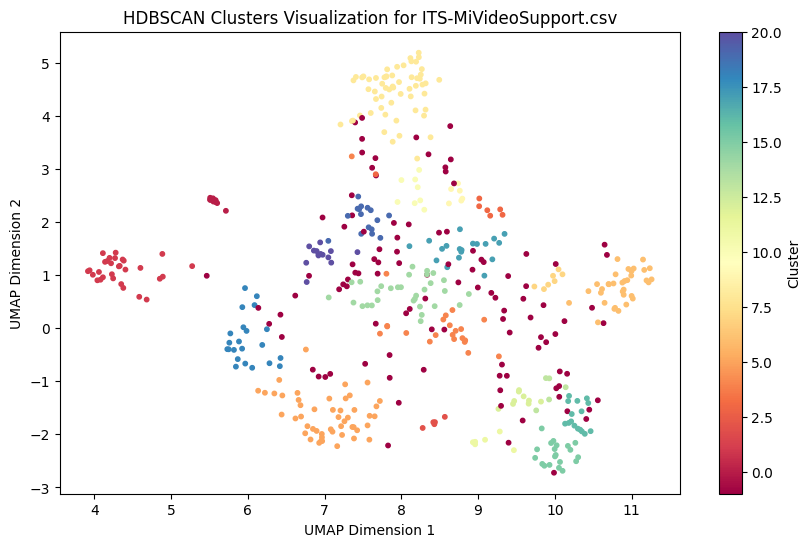

Number of clusters found in ITS-MiVideoSupport.csv: 21
Cluster
-1     106
 8      58
 5      49
 6      34
 14     31
 1      30
 4      22
 18     22
 15     20
 17     19
 16     16
 19     16
 20     14
 0      11
 12      9
 10      8
 7       7
 3       7
 11      6
 9       6
 13      5
 2       5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiVideoSupport.csv

Processing: ITS-MiWorkspace.csv
Embedding column: Title


Batches: 100%|██████████| 1699/1699 [01:39<00:00, 17.08it/s]


Embedding column: Servicename


Batches: 100%|██████████| 1699/1699 [00:56<00:00, 29.93it/s]


Embedding column: Description


Batches: 100%|██████████| 1699/1699 [07:58<00:00,  3.55it/s]


Embedding column: Feed


Batches: 100%|██████████| 1699/1699 [15:40<00:00,  1.81it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


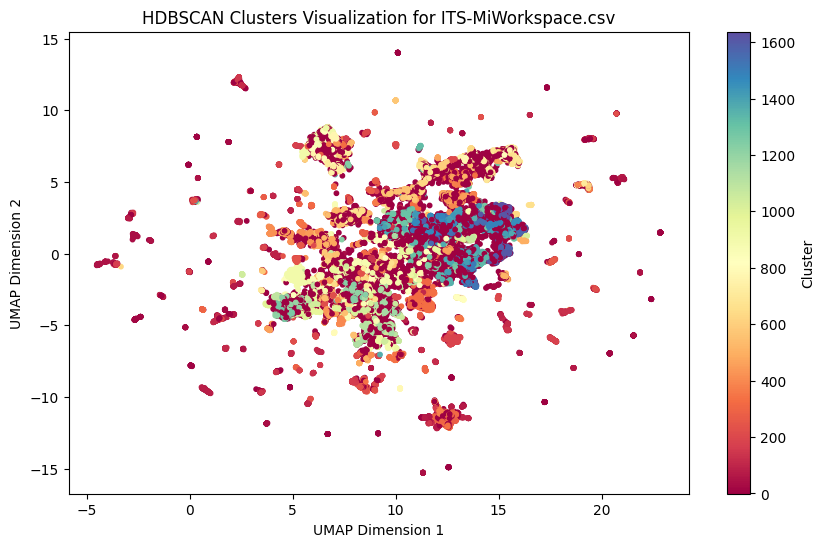

Number of clusters found in ITS-MiWorkspace.csv: 1638
Cluster
-1      17809
 906     1017
 190      601
 328      466
 684      384
        ...  
 309        5
 144        5
 409        5
 879        5
 347        5
Name: count, Length: 1639, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspace.csv

Processing: ITS-MiWorkspaceAssetDisposal.csv
Embedding column: Title


Batches: 100%|██████████| 7/7 [00:00<00:00, 24.67it/s]


Embedding column: Servicename


Batches: 100%|██████████| 7/7 [00:00<00:00, 30.45it/s]


Embedding column: Description


Batches: 100%|██████████| 7/7 [00:03<00:00,  2.30it/s]


Embedding column: Feed


Batches: 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


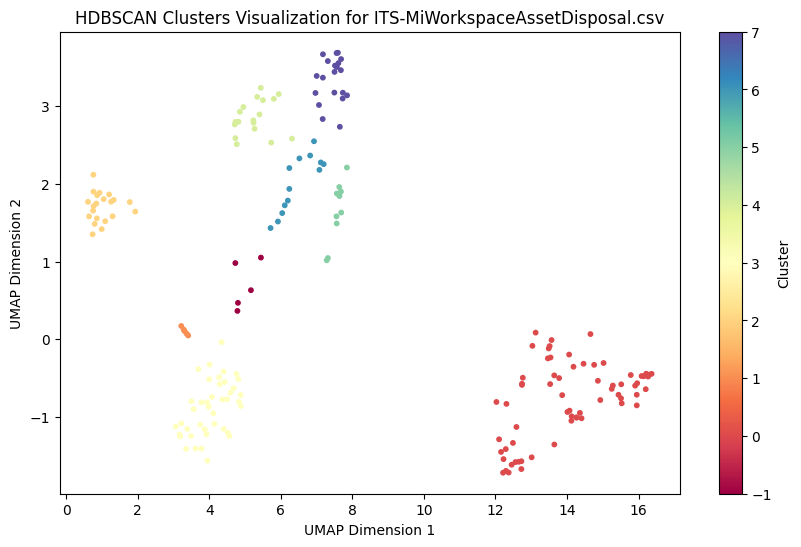

Number of clusters found in ITS-MiWorkspaceAssetDisposal.csv: 8
Cluster
 0    66
 3    41
 2    21
 7    20
 4    18
 6    13
 5    10
 1     5
-1     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceAssetDisposal.csv

Processing: ITS-MiWorkspaceAssetTagandAssetRecord.csv
Embedding column: Title


Batches: 100%|██████████| 12/12 [00:00<00:00, 23.20it/s]


Embedding column: Servicename


Batches: 100%|██████████| 12/12 [00:00<00:00, 26.31it/s]


Embedding column: Description


Batches: 100%|██████████| 12/12 [00:01<00:00,  6.80it/s]


Embedding column: Feed


Batches: 100%|██████████| 12/12 [00:07<00:00,  1.62it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


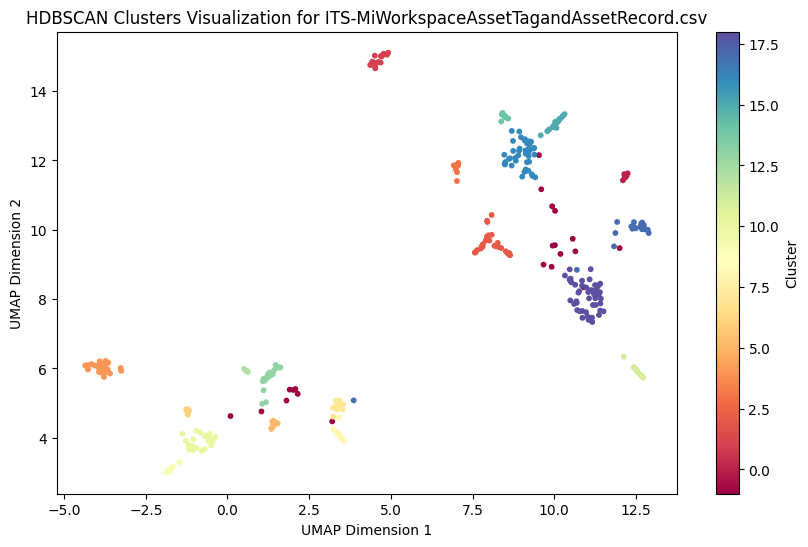

Number of clusters found in ITS-MiWorkspaceAssetTagandAssetRecord.csv: 19
Cluster
 18    50
 16    42
 2     29
 4     28
 10    26
 13    21
 17    21
-1     21
 15    17
 1     16
 11    13
 7     12
 8     12
 5      9
 9      9
 3      9
 0      9
 14     9
 6      7
 12     6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceAssetTagandAssetRecord.csv

Processing: ITS-MiWorkspaceHardwareRepair.csv
Embedding column: Title


Batches: 100%|██████████| 1/1 [00:00<00:00, 12.10it/s]


Embedding column: Servicename


Batches: 100%|██████████| 1/1 [00:00<00:00, 35.72it/s]


Embedding column: Description


Batches: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


Embedding column: Feed


Batches: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-MiWorkspaceHardwareRepair.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-MiWorkspaceITHardwarePurchase.csv
Embedding column: Title


Batches: 100%|██████████| 82/82 [00:07<00:00, 11.67it/s]


Embedding column: Servicename


Batches: 100%|██████████| 82/82 [00:04<00:00, 18.38it/s]


Embedding column: Description


Batches: 100%|██████████| 82/82 [00:08<00:00,  9.47it/s]


Embedding column: Feed


Batches: 100%|██████████| 82/82 [00:56<00:00,  1.46it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


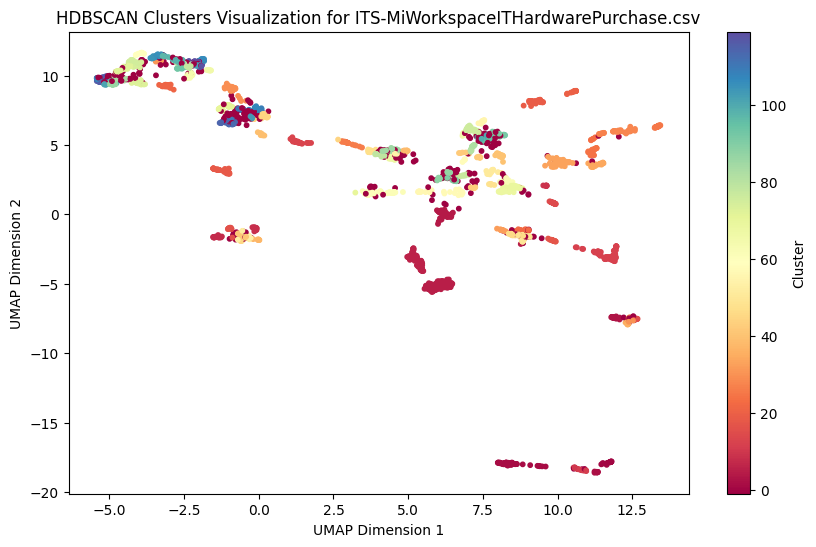

Number of clusters found in ITS-MiWorkspaceITHardwarePurchase.csv: 120
Cluster
-1      387
 5      122
 12      94
 6       90
 33      73
       ... 
 102      5
 31       5
 115      5
 97       5
 78       5
Name: count, Length: 121, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceITHardwarePurchase.csv

Processing: ITS-MiWorkspaceLoaner.csv
Embedding column: Title


Batches: 100%|██████████| 16/16 [00:00<00:00, 19.63it/s]


Embedding column: Servicename


Batches: 100%|██████████| 16/16 [00:00<00:00, 30.95it/s]


Embedding column: Description


Batches: 100%|██████████| 16/16 [00:01<00:00, 11.03it/s]


Embedding column: Feed


Batches: 100%|██████████| 16/16 [00:10<00:00,  1.50it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


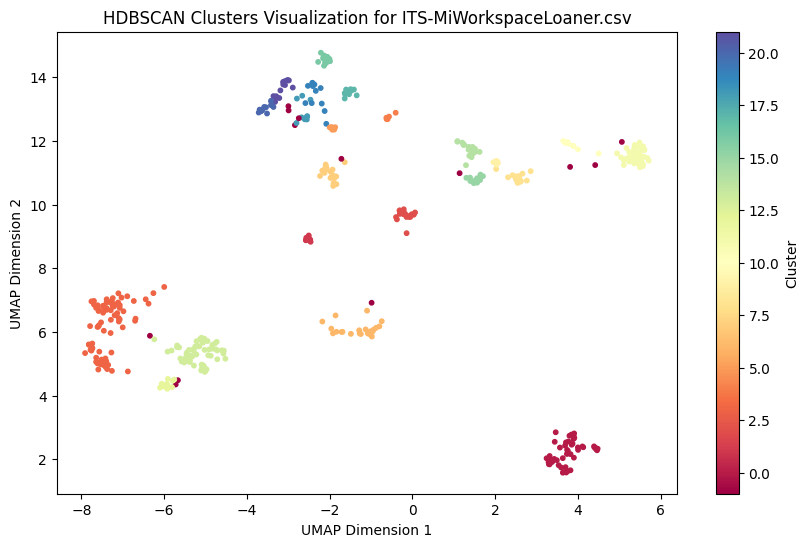

Number of clusters found in ITS-MiWorkspaceLoaner.csv: 22
Cluster
 3     81
 13    61
 0     53
 11    41
 6     25
 7     23
 2     20
 14    20
 21    18
 8     16
 16    15
 20    15
-1     13
 19    12
 15    12
 17    11
 12    11
 1     10
 18     9
 10     9
 5      7
 9      5
 4      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceLoaner.csv

Processing: ITS-MiWorkspaceModifyorDeleteanActiveOttoRefreshTicket.csv
Embedding column: Title


Batches: 100%|██████████| 18/18 [00:00<00:00, 20.25it/s]


Embedding column: Servicename


Batches: 100%|██████████| 18/18 [00:00<00:00, 19.45it/s]


Embedding column: Description


Batches: 100%|██████████| 18/18 [00:03<00:00,  5.74it/s]


Embedding column: Feed


Batches: 100%|██████████| 18/18 [00:03<00:00,  4.57it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


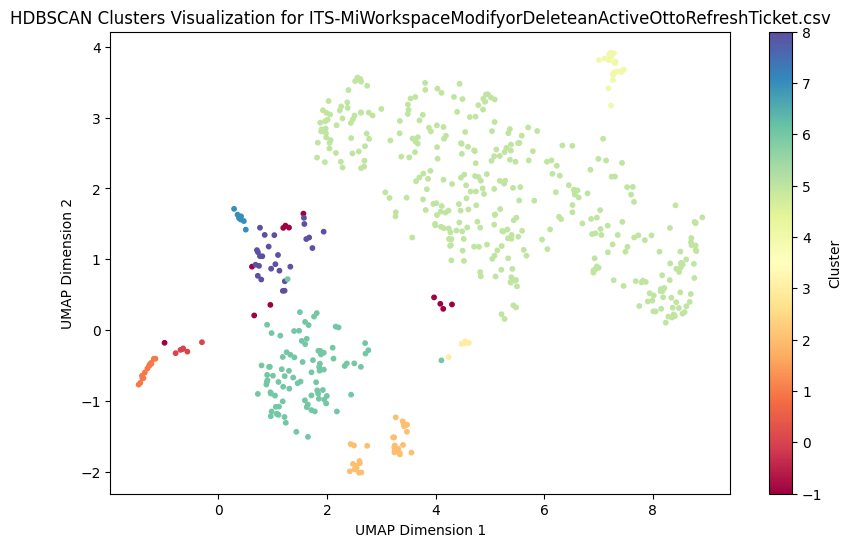

Number of clusters found in ITS-MiWorkspaceModifyorDeleteanActiveOttoRefreshTicket.csv: 9
Cluster
 5    349
 6     90
 2     30
 8     26
 4     22
 1     16
-1     12
 7      9
 0      6
 3      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceModifyorDeleteanActiveOttoRefreshTicket.csv

Processing: ITS-MiWorkspaceOffboarding.csv
Embedding column: Title


Batches: 100%|██████████| 419/419 [00:36<00:00, 11.51it/s]


Embedding column: Servicename


Batches: 100%|██████████| 419/419 [00:16<00:00, 26.01it/s]


Embedding column: Description


Batches: 100%|██████████| 419/419 [00:46<00:00,  9.04it/s]


Embedding column: Feed


Batches: 100%|██████████| 419/419 [02:51<00:00,  2.44it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


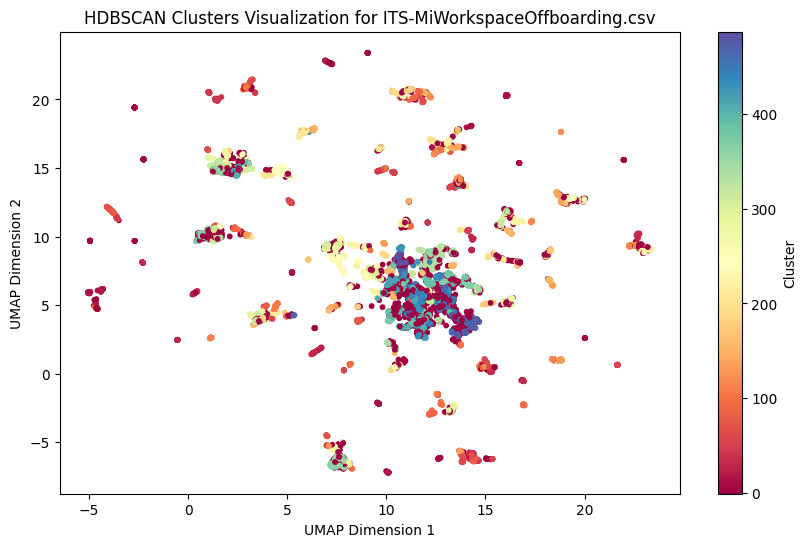

Number of clusters found in ITS-MiWorkspaceOffboarding.csv: 488
Cluster
-1      2937
 248     249
 354     193
 206     127
 368     108
        ... 
 208       5
 207       5
 295       5
 247       5
 251       5
Name: count, Length: 489, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceOffboarding.csv

Processing: ITS-MiWorkspaceOnboarding.csv
Embedding column: Title


Batches: 100%|██████████| 95/95 [00:06<00:00, 14.04it/s]


Embedding column: Servicename


Batches: 100%|██████████| 95/95 [00:03<00:00, 24.31it/s]


Embedding column: Description


Batches: 100%|██████████| 95/95 [00:13<00:00,  7.30it/s]


Embedding column: Feed


Batches: 100%|██████████| 95/95 [00:59<00:00,  1.59it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


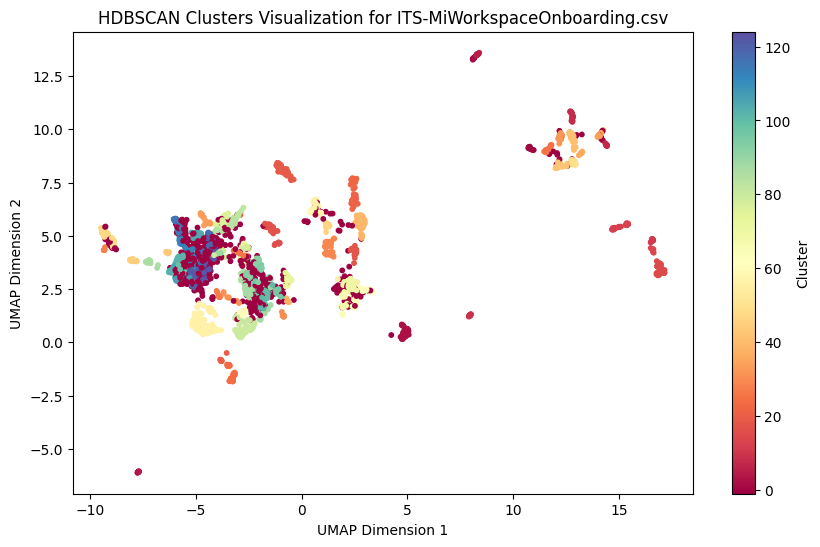

Number of clusters found in ITS-MiWorkspaceOnboarding.csv: 125
Cluster
-1     643
 56    150
 80     96
 19     81
 15     73
      ... 
 4       5
 95      5
 71      5
 89      5
 64      5
Name: count, Length: 126, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceOnboarding.csv

Processing: ITS-MiWorkspacePrinting.csv
Embedding column: Title


Batches: 100%|██████████| 36/36 [00:01<00:00, 18.83it/s]


Embedding column: Servicename


Batches: 100%|██████████| 36/36 [00:01<00:00, 24.34it/s]


Embedding column: Description


Batches: 100%|██████████| 36/36 [00:12<00:00,  2.87it/s]


Embedding column: Feed


Batches: 100%|██████████| 36/36 [00:21<00:00,  1.64it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


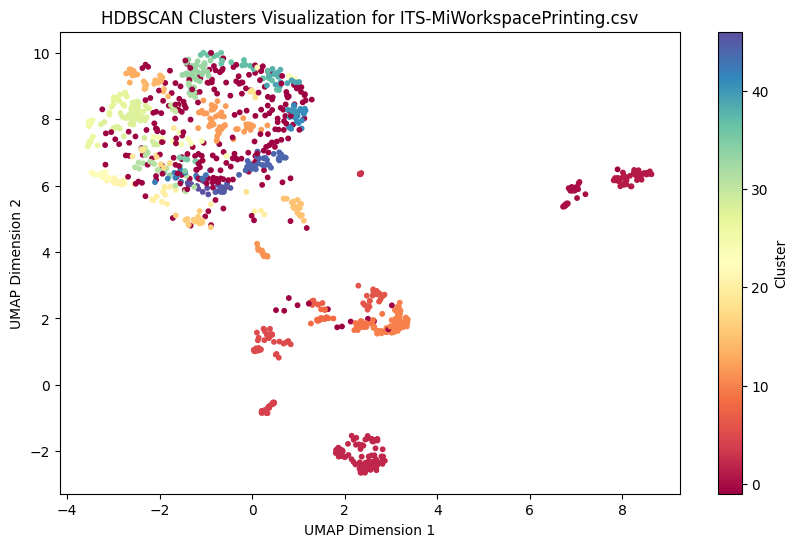

Number of clusters found in ITS-MiWorkspacePrinting.csv: 47
Cluster
-1     264
 2      91
 12     51
 28     49
 10     49
 1      47
 5      39
 44     36
 0      33
 33     30
 6      28
 9      27
 4      26
 14     20
 15     19
 41     18
 8      18
 27     17
 31     17
 16     16
 21     16
 22     15
 20     15
 45     15
 37     13
 11     13
 36     12
 24     10
 13     10
 38     10
 42      9
 7       9
 39      9
 32      9
 46      8
 25      7
 26      7
 40      6
 35      6
 3       6
 29      5
 17      5
 34      5
 30      5
 18      5
 43      5
 23      5
 19      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspacePrinting.csv

Processing: ITS-MiWorkspaceRefresh.csv
Embedding column: Title


Batches: 100%|██████████| 94/94 [00:07<00:00, 12.83it/s]


Embedding column: Servicename


Batches: 100%|██████████| 94/94 [00:03<00:00, 26.78it/s]


Embedding column: Description


Batches: 100%|██████████| 94/94 [00:07<00:00, 13.06it/s]


Embedding column: Feed


Batches: 100%|██████████| 94/94 [00:57<00:00,  1.62it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


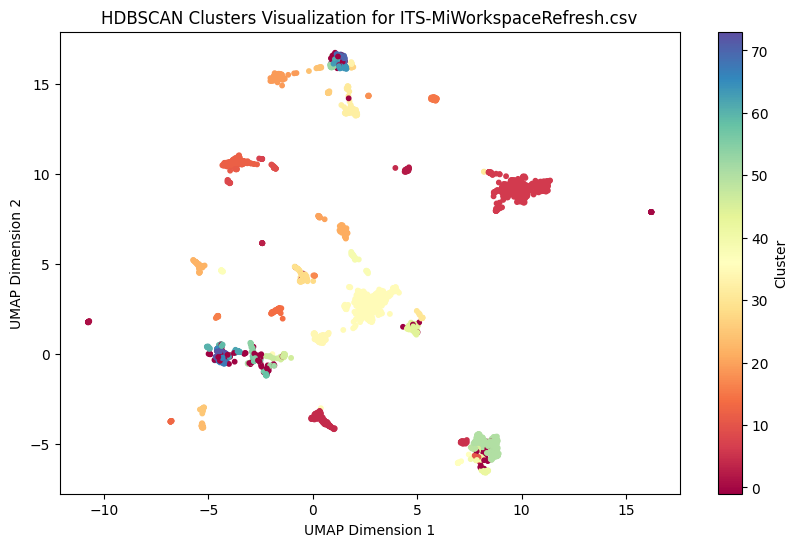

Number of clusters found in ITS-MiWorkspaceRefresh.csv: 74
Cluster
 6     439
 35    386
 50    201
-1     164
 12    131
      ... 
 49      5
 48      5
 41      5
 17      5
 67      5
Name: count, Length: 75, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceRefresh.csv

Processing: ITS-MiWorkspaceSoftwarePackaging.csv
Embedding column: Title


Batches: 100%|██████████| 1/1 [00:00<00:00, 16.39it/s]


Embedding column: Servicename


Batches: 100%|██████████| 1/1 [00:00<00:00, 34.48it/s]


Embedding column: Description


Batches: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


Embedding column: Feed


Batches: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-MiWorkspaceSoftwarePackaging.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-MiWorkspaceStockroomAudit.csv
Embedding column: Title


Batches: 100%|██████████| 22/22 [00:00<00:00, 26.96it/s]


Embedding column: Servicename


Batches: 100%|██████████| 22/22 [00:00<00:00, 29.93it/s]


Embedding column: Description


Batches: 100%|██████████| 22/22 [00:06<00:00,  3.29it/s]


Embedding column: Feed


Batches: 100%|██████████| 22/22 [00:05<00:00,  3.86it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


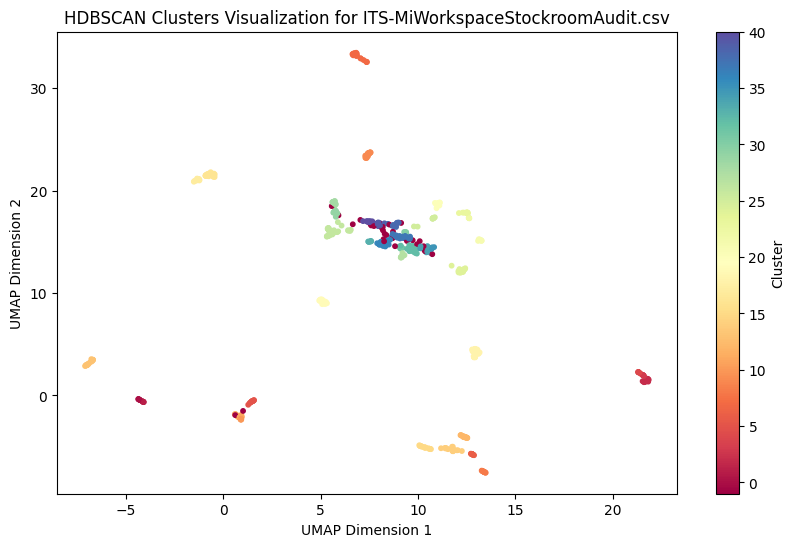

Number of clusters found in ITS-MiWorkspaceStockroomAudit.csv: 41
Cluster
 26    37
 7     35
-1     33
 18    32
 19    29
 24    26
 16    26
 37    24
 9     24
 36    23
 13    23
 2     21
 12    19
 32    19
 15    19
 11    18
 28    17
 40    16
 17    15
 5     15
 14    15
 20    15
 6     14
 29    13
 8     13
 25    13
 21    12
 23    12
 38    11
 27    11
 39    11
 34     9
 35     9
 31     8
 4      8
 1      8
 3      7
 10     7
 33     7
 0      6
 22     5
 30     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceStockroomAudit.csv

Processing: ITS-MiWorkspaceUpdateAssetLocation.csv
Embedding column: Title


Batches: 100%|██████████| 20/20 [00:00<00:00, 27.54it/s]


Embedding column: Servicename


Batches: 100%|██████████| 20/20 [00:00<00:00, 29.50it/s]


Embedding column: Description


Batches: 100%|██████████| 20/20 [00:01<00:00, 18.66it/s]


Embedding column: Feed


Batches: 100%|██████████| 20/20 [00:05<00:00,  3.75it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


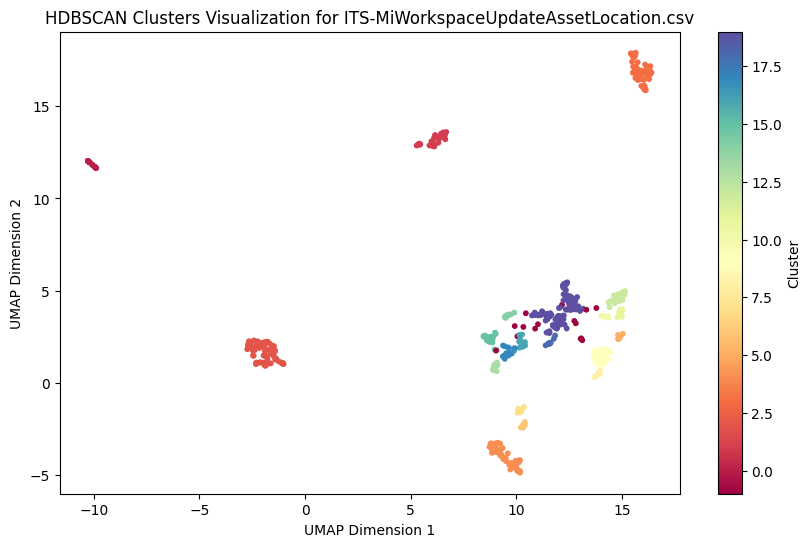

Number of clusters found in ITS-MiWorkspaceUpdateAssetLocation.csv: 20
Cluster
 19    100
 2      78
 4      72
 3      71
 1      46
 9      43
 12     32
 15     23
 0      20
 7      18
 16     18
 17     16
-1      15
 11     14
 13     13
 14     12
 5      11
 18     10
 8       9
 6       7
 10      6
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceUpdateAssetLocation.csv

Processing: ITS-MiWorkspaceWorkstationHomeDeployment(Mac).csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 17.97it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 31.66it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


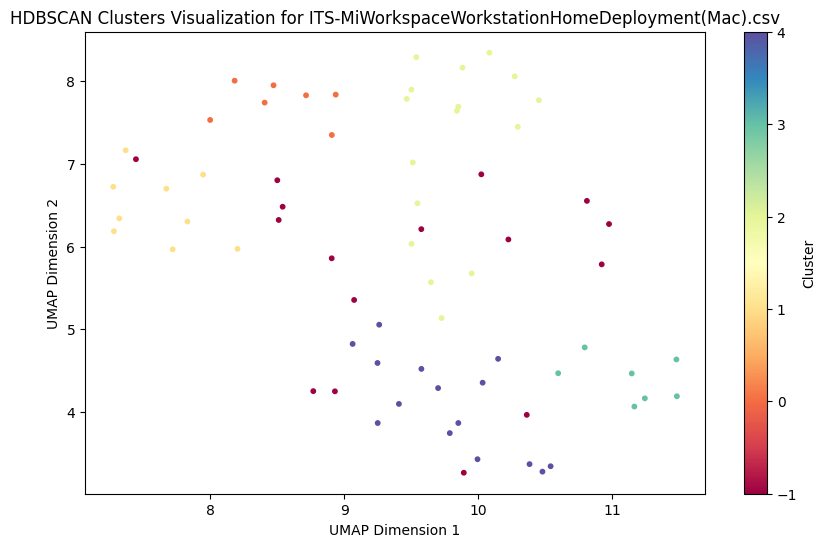

Number of clusters found in ITS-MiWorkspaceWorkstationHomeDeployment(Mac).csv: 5
Cluster
 2    16
-1    16
 4    15
 1     9
 3     7
 0     7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceWorkstationHomeDeployment(Mac).csv

Processing: ITS-MiWorkspaceWorkstationHomeDeployment(Windows).csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 17.54it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 27.03it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


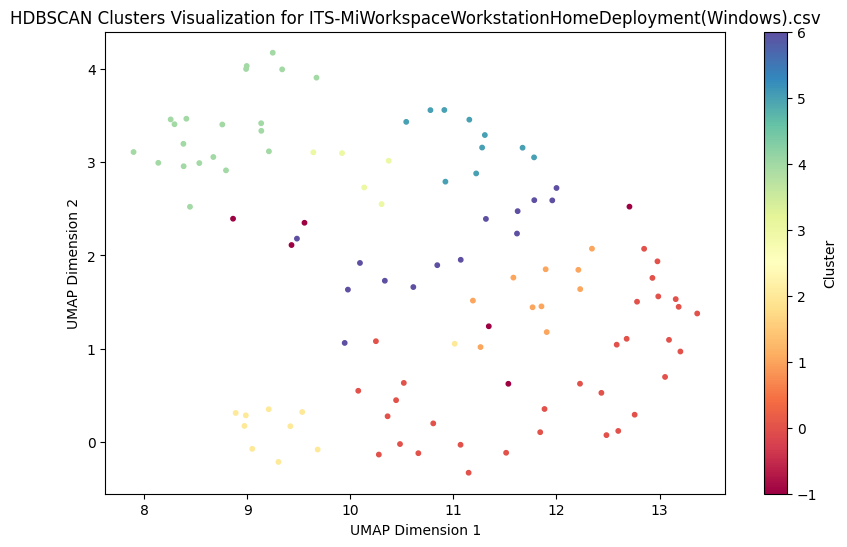

Number of clusters found in ITS-MiWorkspaceWorkstationHomeDeployment(Windows).csv: 7
Cluster
 0    32
 4    20
 6    14
 1    10
 2    10
 5    10
-1     6
 3     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MiWorkspaceWorkstationHomeDeployment(Windows).csv

Processing: ITS-MPrintMobileApplication.csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 11.97it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 21.73it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:00<00:00,  4.62it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


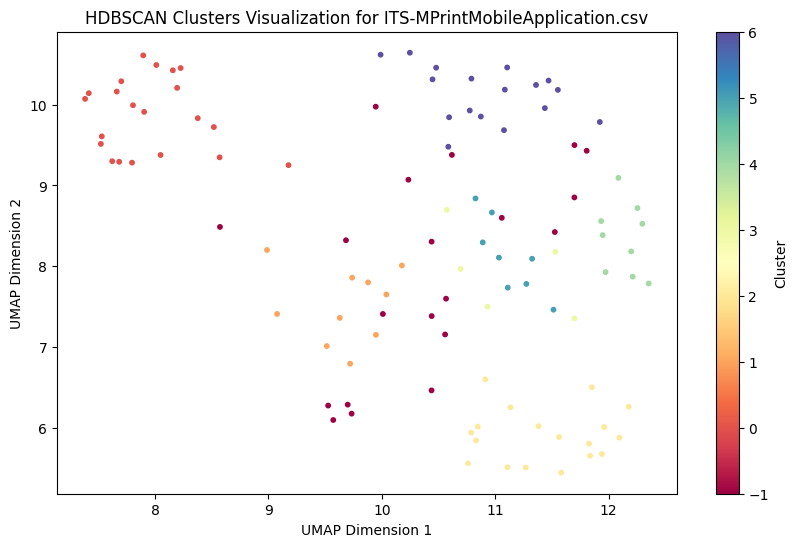

Number of clusters found in ITS-MPrintMobileApplication.csv: 7
Cluster
 0    21
-1    20
 2    18
 6    17
 1    10
 4     9
 5     8
 3     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MPrintMobileApplication.csv

Processing: ITS-MPrintPlatformasaService.csv
Embedding column: Title


Batches: 100%|██████████| 12/12 [00:00<00:00, 19.65it/s]


Embedding column: Servicename


Batches: 100%|██████████| 12/12 [00:00<00:00, 27.85it/s]


Embedding column: Description


Batches: 100%|██████████| 12/12 [00:03<00:00,  3.36it/s]


Embedding column: Feed


Batches: 100%|██████████| 12/12 [00:07<00:00,  1.69it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


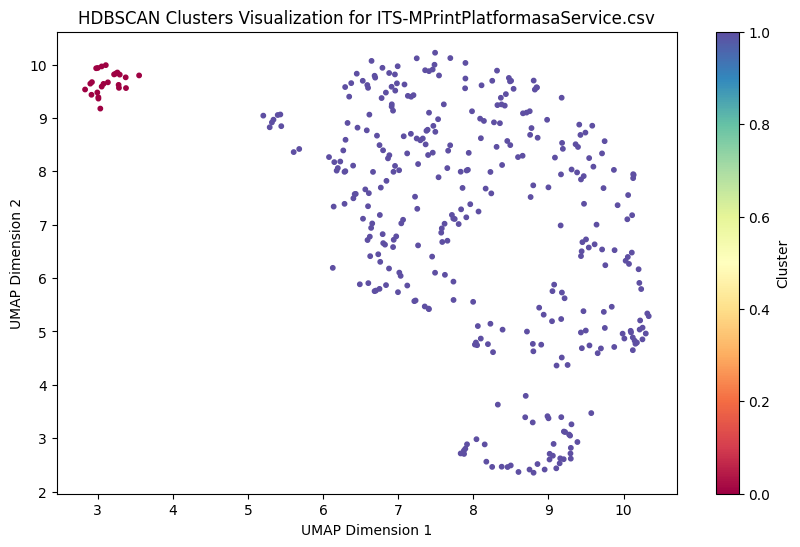

Number of clusters found in ITS-MPrintPlatformasaService.csv: 2
Cluster
1    342
0     24
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MPrintPlatformasaService.csv

Processing: ITS-MySQLDatabase.csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 15.09it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 29.64it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:01<00:00,  2.94it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


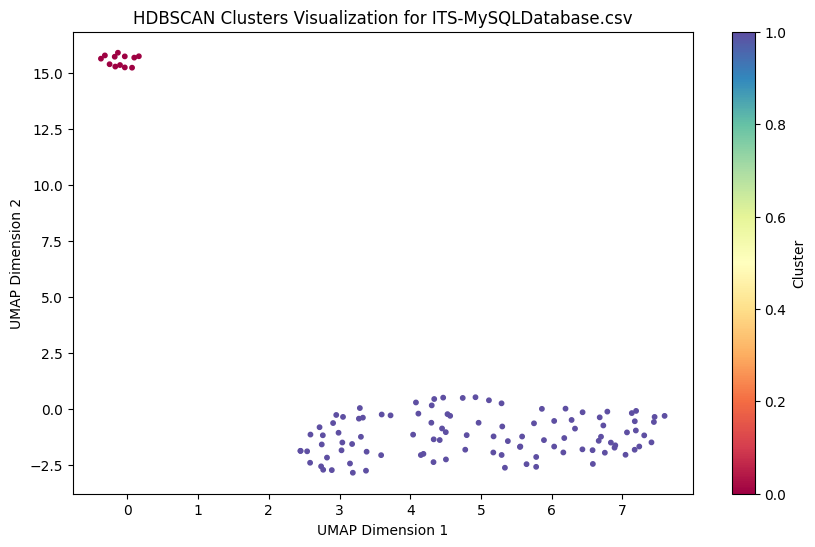

Number of clusters found in ITS-MySQLDatabase.csv: 2
Cluster
1    102
0     12
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-MySQLDatabase.csv

Processing: ITS-Nagios.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00,  6.99it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 15.96it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.28it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:00<00:00,  3.53it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


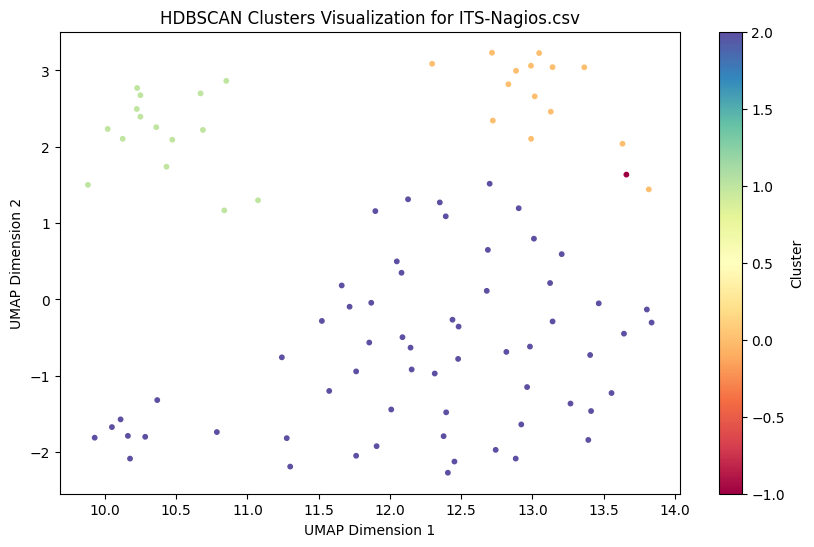

Number of clusters found in ITS-Nagios.csv: 3
Cluster
 2    61
 1    15
 0    14
-1     1
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Nagios.csv

Processing: ITS-NameCoachSalutation.csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00, 21.51it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 48.78it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.59it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.50it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-NameCoachSalutation.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-NetworkVulnerabilityScanning.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 16.95it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 32.36it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.30it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


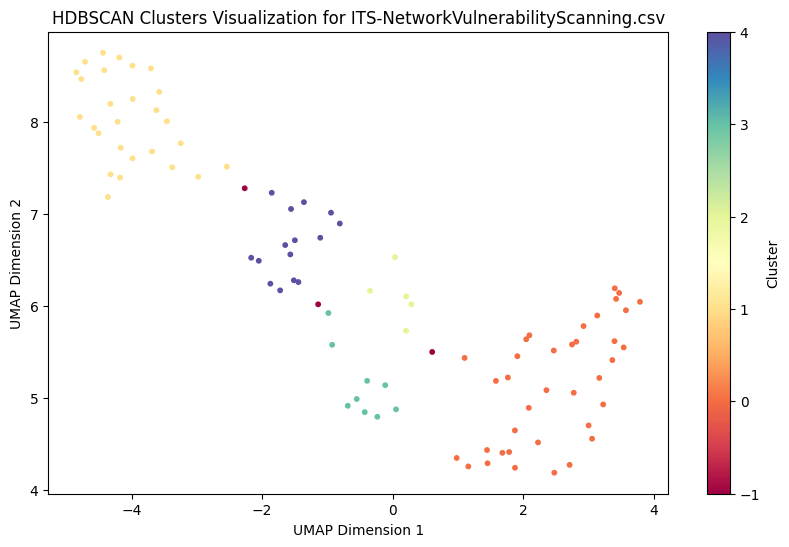

Number of clusters found in ITS-NetworkVulnerabilityScanning.csv: 5
Cluster
 0    37
 1    27
 4    15
 3     9
 2     5
-1     3
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-NetworkVulnerabilityScanning.csv

Processing: ITS-NextGenerationFirewalls.csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00, 13.30it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 31.70it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-NextGenerationFirewalls.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-Office365atU-M.csv
Embedding column: Title


Batches: 100%|██████████| 93/93 [00:05<00:00, 17.19it/s]


Embedding column: Servicename


Batches: 100%|██████████| 93/93 [00:03<00:00, 25.10it/s]


Embedding column: Description


Batches: 100%|██████████| 93/93 [00:20<00:00,  4.48it/s]


Embedding column: Feed


Batches: 100%|██████████| 93/93 [00:55<00:00,  1.68it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


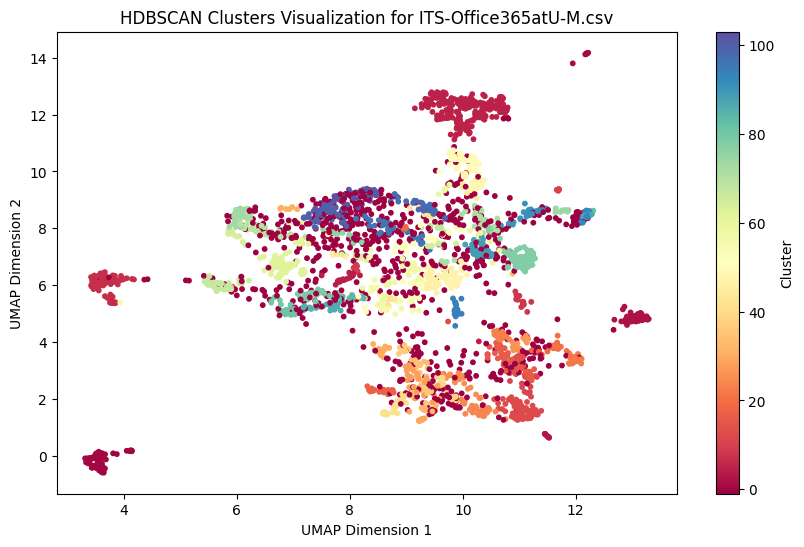

Number of clusters found in ITS-Office365atU-M.csv: 104
Cluster
-1     787
 5     241
 0      88
 7      85
 12     81
      ... 
 45      5
 90      5
 80      5
 87      5
 13      5
Name: count, Length: 105, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Office365atU-M.csv

Processing: ITS-OnlineAccessRequestSystem(OARS).csv
Embedding column: Title


Batches: 100%|██████████| 90/90 [00:05<00:00, 15.36it/s]


Embedding column: Servicename


Batches: 100%|██████████| 90/90 [00:03<00:00, 25.43it/s]


Embedding column: Description


Batches: 100%|██████████| 90/90 [00:26<00:00,  3.41it/s]


Embedding column: Feed


Batches: 100%|██████████| 90/90 [00:49<00:00,  1.82it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


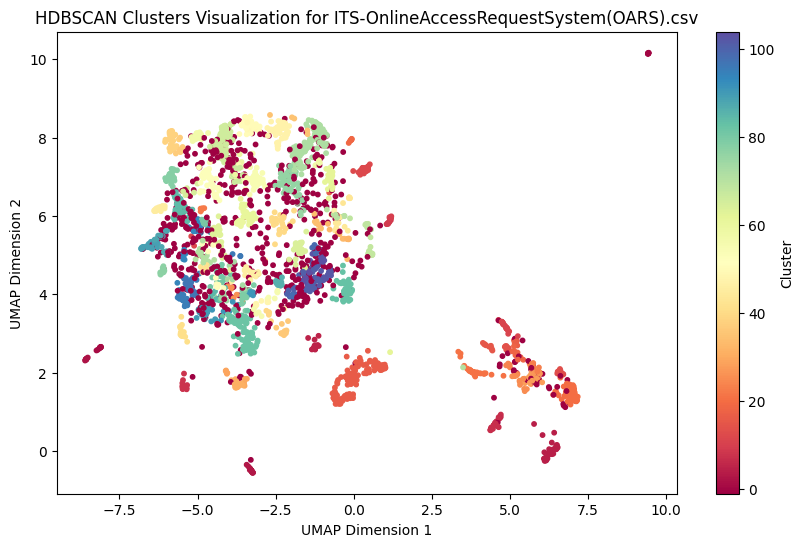

Number of clusters found in ITS-OnlineAccessRequestSystem(OARS).csv: 105
Cluster
-1     638
 16    140
 72    119
 20     95
 82     87
      ... 
 92      5
 29      5
 65      5
 35      5
 98      5
Name: count, Length: 106, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-OnlineAccessRequestSystem(OARS).csv

Processing: ITS-OracleDatabase.csv
Embedding column: Title


Batches: 100%|██████████| 18/18 [00:00<00:00, 19.01it/s]


Embedding column: Servicename


Batches: 100%|██████████| 18/18 [00:00<00:00, 43.90it/s]


Embedding column: Description


Batches: 100%|██████████| 18/18 [00:06<00:00,  2.92it/s]


Embedding column: Feed


Batches: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


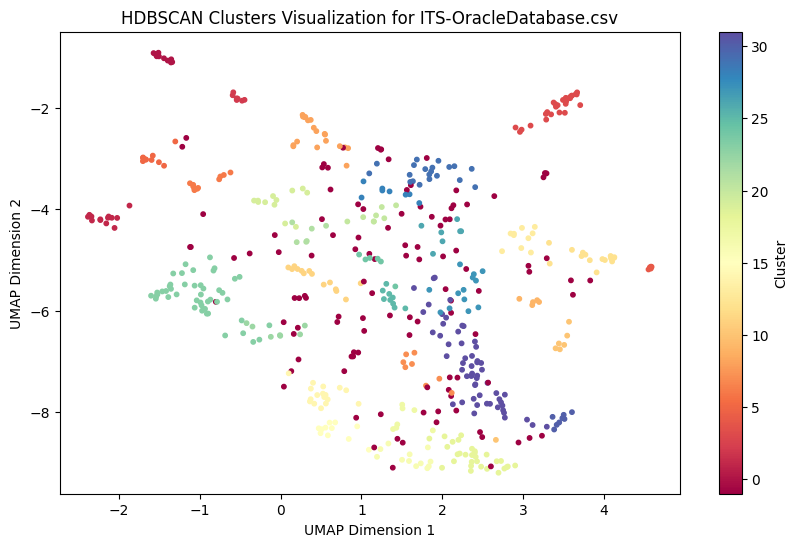

Number of clusters found in ITS-OracleDatabase.csv: 32
Cluster
-1     112
 31     57
 23     46
 18     30
 3      27
 29     20
 8      19
 14     17
 12     16
 11     14
 1      13
 27     13
 19     12
 16     12
 0      12
 6      11
 15     11
 13     10
 5      10
 25      9
 20      8
 2       8
 28      8
 7       8
 30      8
 10      7
 26      7
 17      7
 22      7
 24      6
 21      6
 9       5
 4       5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-OracleDatabase.csv

Processing: ITS-OracleDatabaseSupport-ResetPasswordsandUnlockAccounts.csv
Embedding column: Title


Batches: 100%|██████████| 16/16 [00:01<00:00, 14.51it/s]


Embedding column: Servicename


Batches: 100%|██████████| 16/16 [00:00<00:00, 25.55it/s]


Embedding column: Description


Batches: 100%|██████████| 16/16 [00:01<00:00,  8.65it/s]


Embedding column: Feed


Batches: 100%|██████████| 16/16 [00:09<00:00,  1.68it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


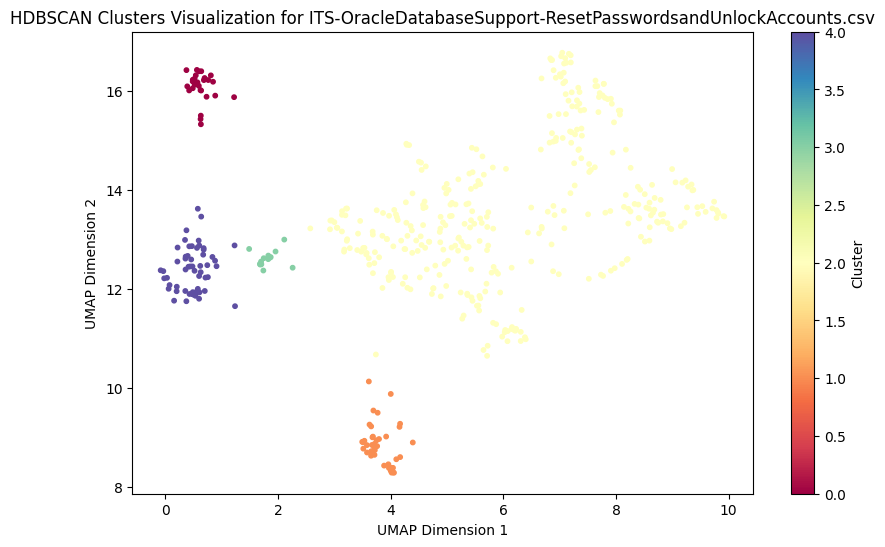

Number of clusters found in ITS-OracleDatabaseSupport-ResetPasswordsandUnlockAccounts.csv: 5
Cluster
2    351
4     57
1     40
0     28
3     14
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-OracleDatabaseSupport-ResetPasswordsandUnlockAccounts.csv

Processing: ITS-Passwords(KerberosatU-M).csv
Embedding column: Title


Batches: 100%|██████████| 575/575 [00:27<00:00, 20.73it/s]


Embedding column: Servicename


Batches: 100%|██████████| 575/575 [00:32<00:00, 17.72it/s]


Embedding column: Description


Batches: 100%|██████████| 575/575 [01:14<00:00,  7.67it/s]


Embedding column: Feed


Batches: 100%|██████████| 575/575 [05:24<00:00,  1.77it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


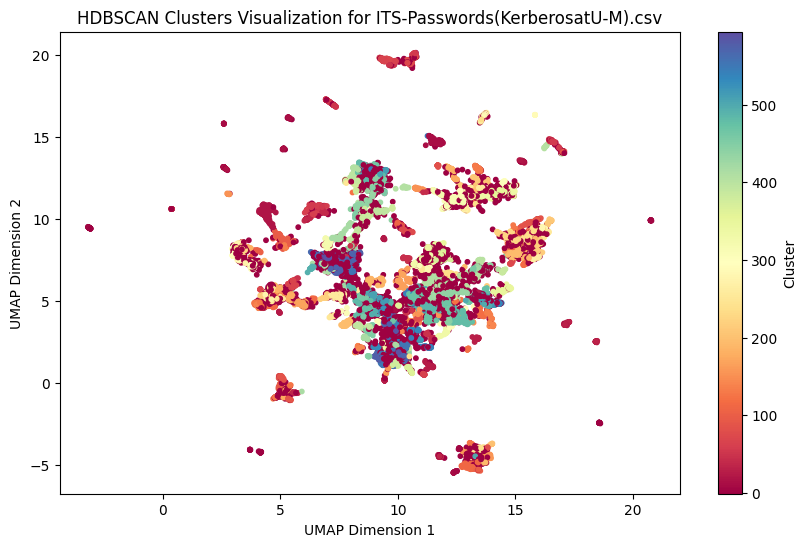

Number of clusters found in ITS-Passwords(KerberosatU-M).csv: 595
Cluster
-1      5192
 478     346
 18      281
 507     235
 193     195
        ... 
 317       5
 559       5
 455       5
 106       5
 144       5
Name: count, Length: 596, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Passwords(KerberosatU-M).csv

Processing: ITS-PayrollTime&LaborModule.csv
Embedding column: Title


Batches: 100%|██████████| 58/58 [00:03<00:00, 17.11it/s]


Embedding column: Servicename


Batches: 100%|██████████| 58/58 [00:02<00:00, 27.40it/s]


Embedding column: Description


Batches: 100%|██████████| 58/58 [00:19<00:00,  2.98it/s]


Embedding column: Feed


Batches: 100%|██████████| 58/58 [00:33<00:00,  1.75it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


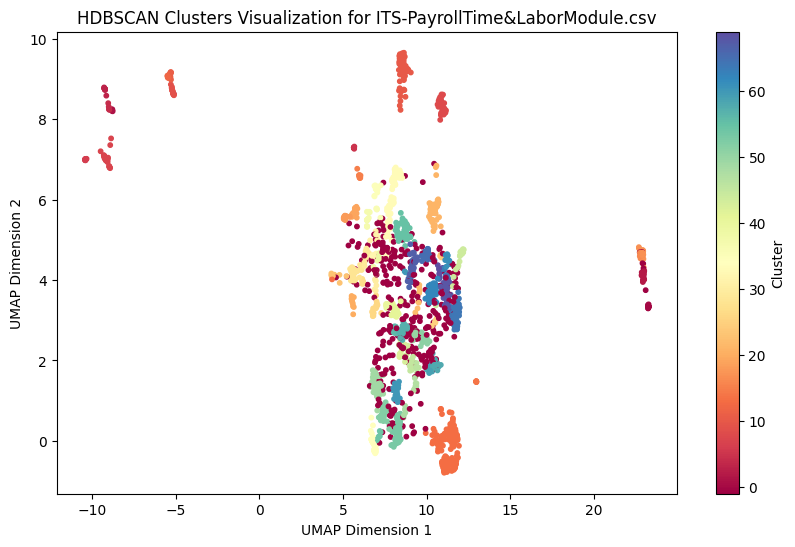

Number of clusters found in ITS-PayrollTime&LaborModule.csv: 70
Cluster
-1     366
 13    145
 33     71
 10     70
 53     57
      ... 
 66      6
 16      5
 24      5
 4       5
 36      5
Name: count, Length: 71, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-PayrollTime&LaborModule.csv

Processing: ITS-PCI-InterstitialGateway.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 24.22it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 27.52it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


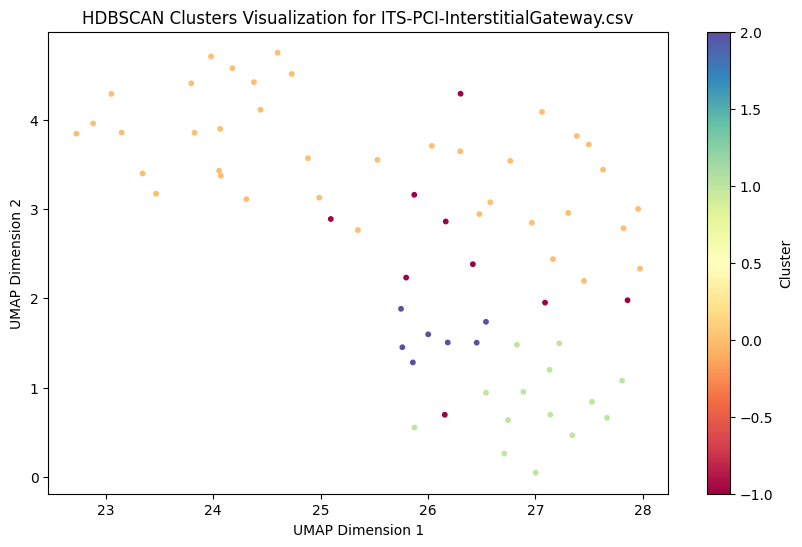

Number of clusters found in ITS-PCI-InterstitialGateway.csv: 3
Cluster
 0    38
 1    14
-1     9
 2     7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-PCI-InterstitialGateway.csv

Processing: ITS-PCI-SecureDataEnclave.csv
Embedding column: Title


Batches: 100%|██████████| 56/56 [00:04<00:00, 11.26it/s]


Embedding column: Servicename


Batches: 100%|██████████| 56/56 [00:01<00:00, 28.16it/s]


Embedding column: Description


Batches: 100%|██████████| 56/56 [00:31<00:00,  1.76it/s]


Embedding column: Feed


Batches: 100%|██████████| 56/56 [00:07<00:00,  7.72it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


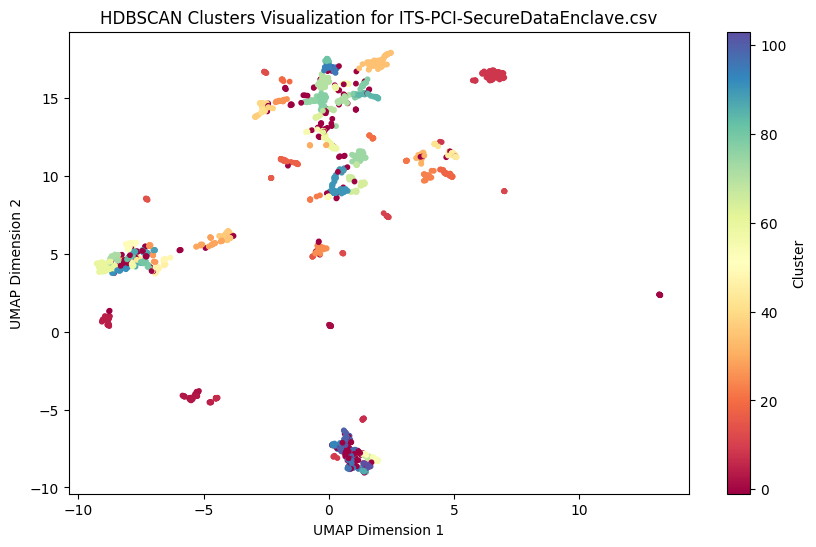

Number of clusters found in ITS-PCI-SecureDataEnclave.csv: 104
Cluster
-1     222
 8     105
 34     98
 60     53
 90     49
      ... 
 28      5
 38      5
 62      5
 82      5
 52      5
Name: count, Length: 105, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-PCI-SecureDataEnclave.csv

Processing: ITS-Pinnacle.csv
Embedding column: Title


Batches: 100%|██████████| 17/17 [00:00<00:00, 26.57it/s]


Embedding column: Servicename


Batches: 100%|██████████| 17/17 [00:00<00:00, 40.81it/s]


Embedding column: Description


Batches: 100%|██████████| 17/17 [00:07<00:00,  2.18it/s]


Embedding column: Feed


Batches: 100%|██████████| 17/17 [00:04<00:00,  3.64it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


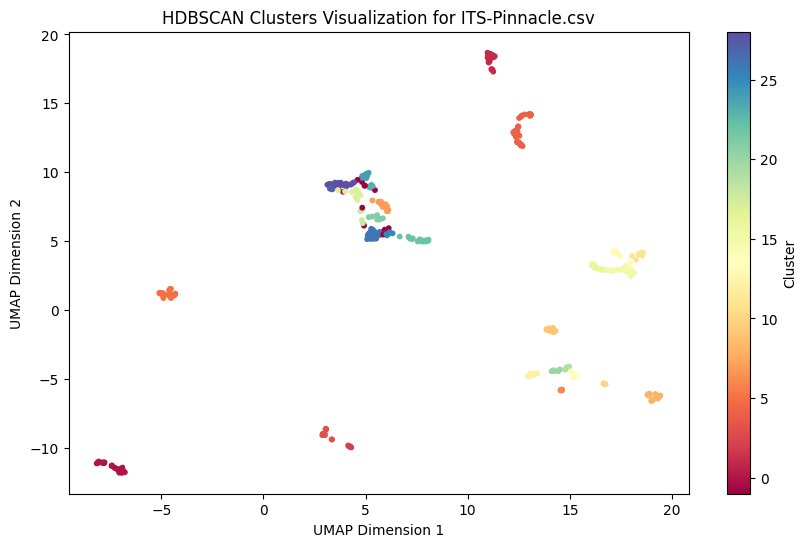

Number of clusters found in ITS-Pinnacle.csv: 29
Cluster
 4     43
 0     36
 5     33
 28    30
 15    30
 1     29
 22    24
 26    24
 8     24
 7     23
 9     21
 3     19
 12    19
 24    17
 16    17
 11    14
-1     13
 17    13
 13    11
 14     9
 21     9
 2      8
 19     8
 6      8
 10     7
 23     7
 25     7
 20     6
 27     5
 18     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Pinnacle.csv

Processing: ITS-ProcurementModule.csv
Embedding column: Title


Batches: 100%|██████████| 33/33 [00:01<00:00, 21.30it/s]


Embedding column: Servicename


Batches: 100%|██████████| 33/33 [00:01<00:00, 30.99it/s]


Embedding column: Description


Batches: 100%|██████████| 33/33 [00:08<00:00,  4.04it/s]


Embedding column: Feed


Batches: 100%|██████████| 33/33 [00:17<00:00,  1.85it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


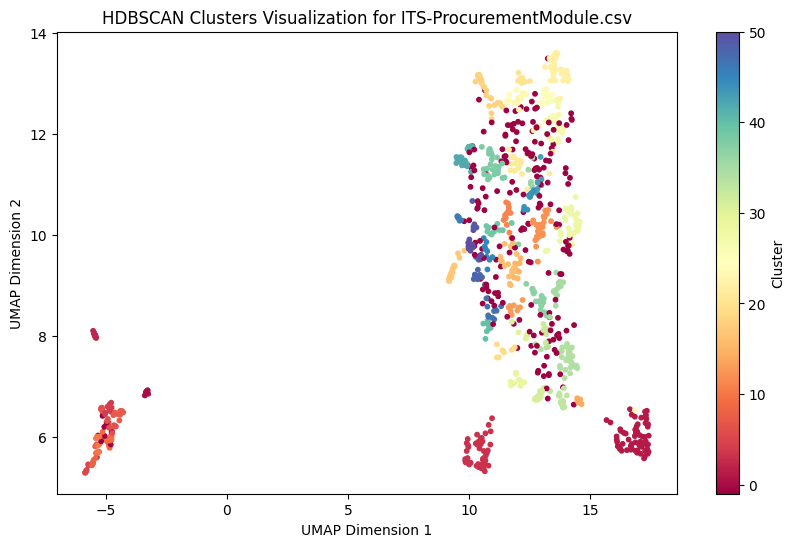

Number of clusters found in ITS-ProcurementModule.csv: 51
Cluster
-1     201
 1      71
 3      59
 22     42
 28     42
 34     36
 12     31
 18     30
 38     26
 27     24
 17     22
 16     21
 31     20
 37     19
 21     19
 42     18
 9      17
 6      17
 33     15
 35     14
 50     13
 2      13
 11     13
 4      13
 48     12
 0      12
 39     12
 25     11
 44     11
 8      10
 20     10
 47     10
 13     10
 15      9
 23      9
 29      9
 24      9
 45      9
 46      9
 10      8
 5       8
 41      8
 19      8
 43      8
 40      8
 7       8
 32      7
 14      6
 36      5
 30      5
 26      5
 49      5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ProcurementModule.csv

Processing: ITS-ProjectManagementOffice.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 25.21it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 38.49it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:00<00:00,  3.10it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


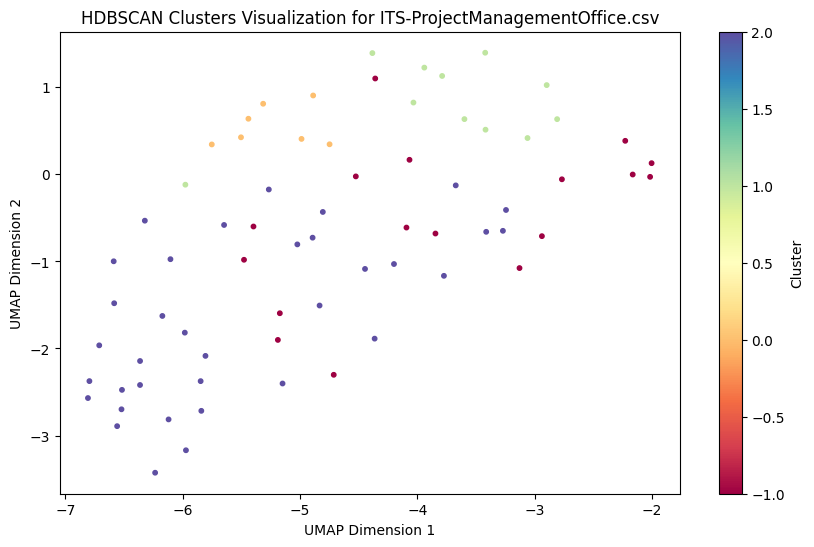

Number of clusters found in ITS-ProjectManagementOffice.csv: 3
Cluster
 2    35
-1    17
 1    11
 0     7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ProjectManagementOffice.csv

Processing: ITS-ProjectRequest.csv
Embedding column: Title


Batches: 100%|██████████| 4/4 [00:00<00:00, 23.55it/s]


Embedding column: Servicename


Batches: 100%|██████████| 4/4 [00:00<00:00, 40.41it/s]


Embedding column: Description


Batches: 100%|██████████| 4/4 [00:00<00:00,  4.11it/s]


Embedding column: Feed


Batches: 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


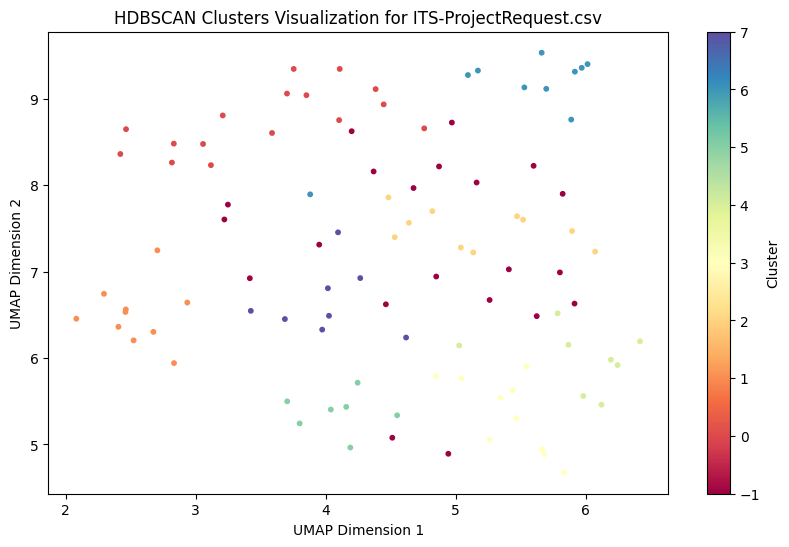

Number of clusters found in ITS-ProjectRequest.csv: 8
Cluster
-1    21
 0    16
 1    10
 6    10
 2    10
 3    10
 7     8
 4     8
 5     7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ProjectRequest.csv

Processing: ITS-Qualtrics.csv
Embedding column: Title


Batches: 100%|██████████| 61/61 [00:03<00:00, 19.97it/s]


Embedding column: Servicename


Batches: 100%|██████████| 61/61 [00:01<00:00, 30.87it/s]


Embedding column: Description


Batches: 100%|██████████| 61/61 [00:21<00:00,  2.89it/s]


Embedding column: Feed


Batches: 100%|██████████| 61/61 [00:36<00:00,  1.67it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


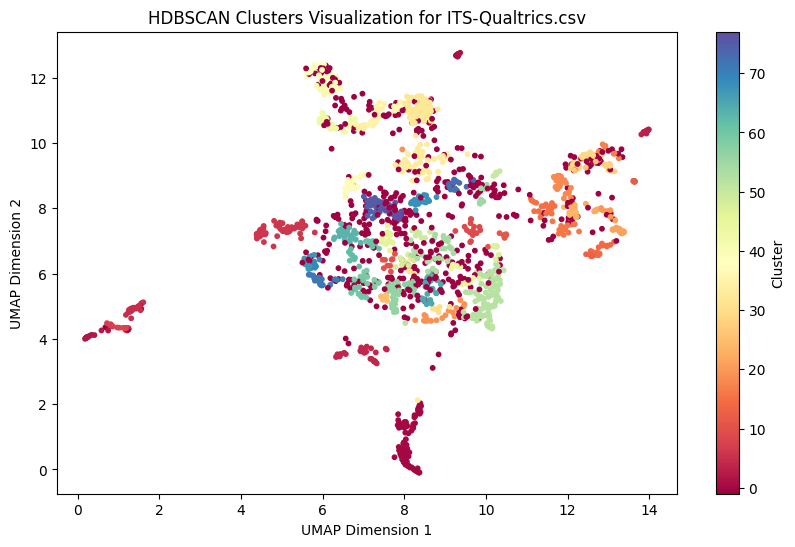

Number of clusters found in ITS-Qualtrics.csv: 78
Cluster
-1     512
 0     113
 52    106
 32     87
 6      67
      ... 
 70      5
 51      5
 22      5
 34      5
 50      5
Name: count, Length: 79, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-Qualtrics.csv

Processing: ITS-RADARWindowsApplicationSupport.csv
Embedding column: Title


Batches: 100%|██████████| 9/9 [00:00<00:00, 20.20it/s]


Embedding column: Servicename


Batches: 100%|██████████| 9/9 [00:00<00:00, 32.85it/s]


Embedding column: Description


Batches: 100%|██████████| 9/9 [00:02<00:00,  3.43it/s]


Embedding column: Feed


Batches: 100%|██████████| 9/9 [00:04<00:00,  2.06it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


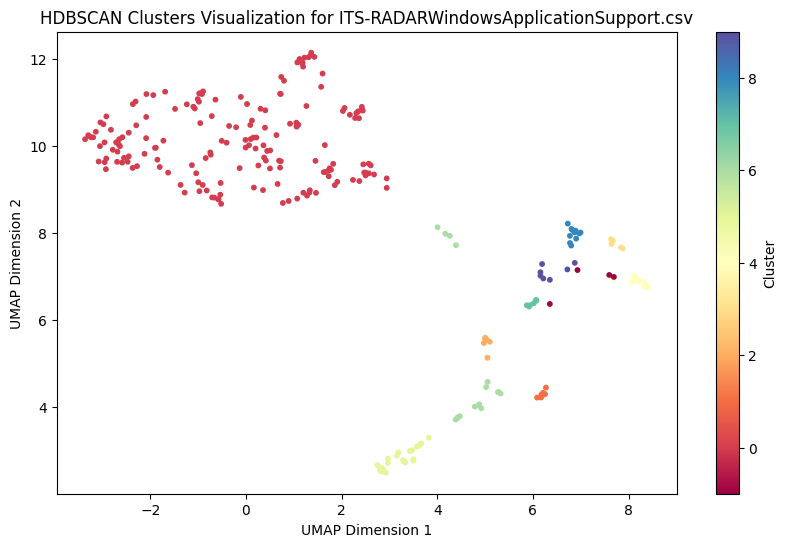

Number of clusters found in ITS-RADARWindowsApplicationSupport.csv: 10
Cluster
 0    171
 5     22
 6     17
 8     12
 4     12
 2      8
 9      7
 1      7
 7      6
 3      5
-1      4
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-RADARWindowsApplicationSupport.csv

Processing: ITS-RECONRiskAssessment.csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 34.49it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


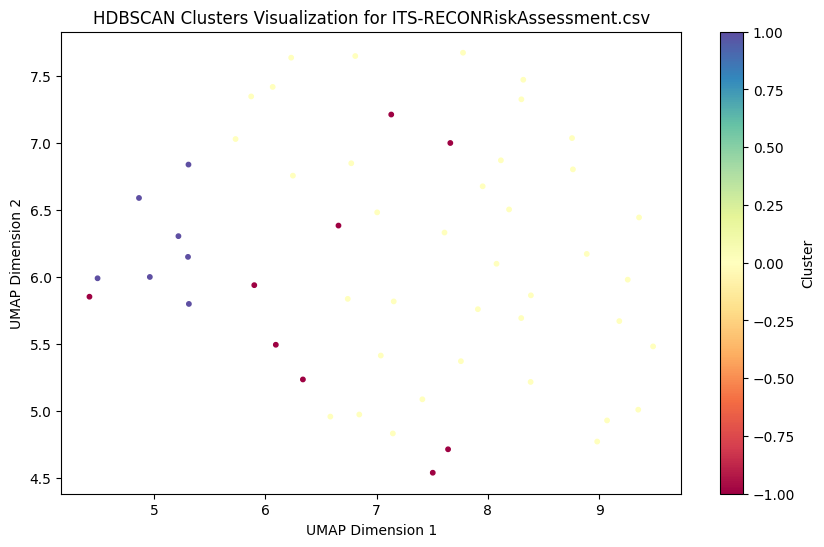

Number of clusters found in ITS-RECONRiskAssessment.csv: 2
Cluster
 0    38
-1     9
 1     7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-RECONRiskAssessment.csv

Processing: ITS-RecruitingandAdmissionsModule.csv
Embedding column: Title


Batches: 100%|██████████| 31/31 [00:01<00:00, 15.84it/s]


Embedding column: Servicename


Batches: 100%|██████████| 31/31 [00:01<00:00, 29.52it/s]


Embedding column: Description


Batches: 100%|██████████| 31/31 [00:11<00:00,  2.80it/s]


Embedding column: Feed


Batches: 100%|██████████| 31/31 [00:16<00:00,  1.87it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


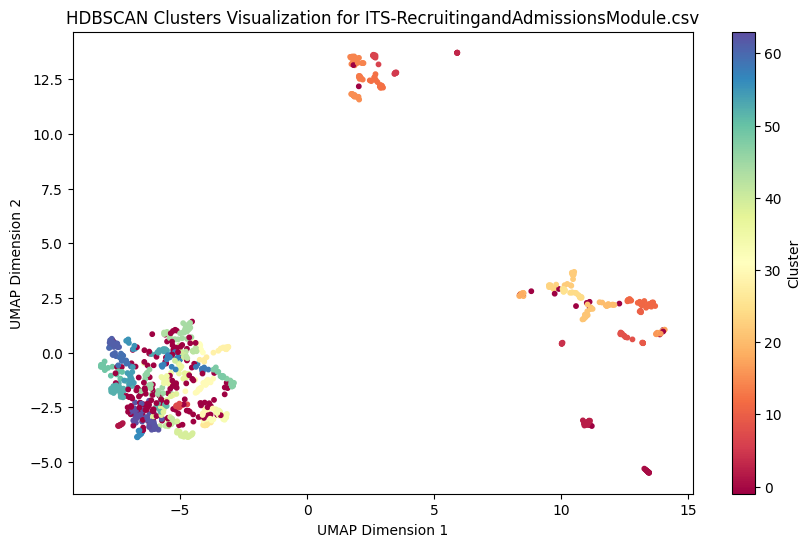

Number of clusters found in ITS-RecruitingandAdmissionsModule.csv: 64
Cluster
-1     175
 11     35
 44     29
 52     28
 62     28
      ... 
 37      6
 46      5
 27      5
 10      5
 36      5
Name: count, Length: 65, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-RecruitingandAdmissionsModule.csv

Processing: ITS-RedHatSatelliteatU-M.csv
Embedding column: Title


Batches: 100%|██████████| 2/2 [00:00<00:00, 11.98it/s]


Embedding column: Servicename


Batches: 100%|██████████| 2/2 [00:00<00:00, 32.80it/s]


Embedding column: Description


Batches: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]


Embedding column: Feed


Batches: 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\umap\spectral.py:519: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(


Error processing ITS-RedHatSatelliteatU-M.csv: Cannot use scipy.linalg.eigh for sparse A with k >= N. Use scipy.linalg.eigh(A.toarray()) or reduce k.

Processing: ITS-RemoteOfficeHours.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 19.40it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 32.62it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.76it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:02<00:00,  1.43it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


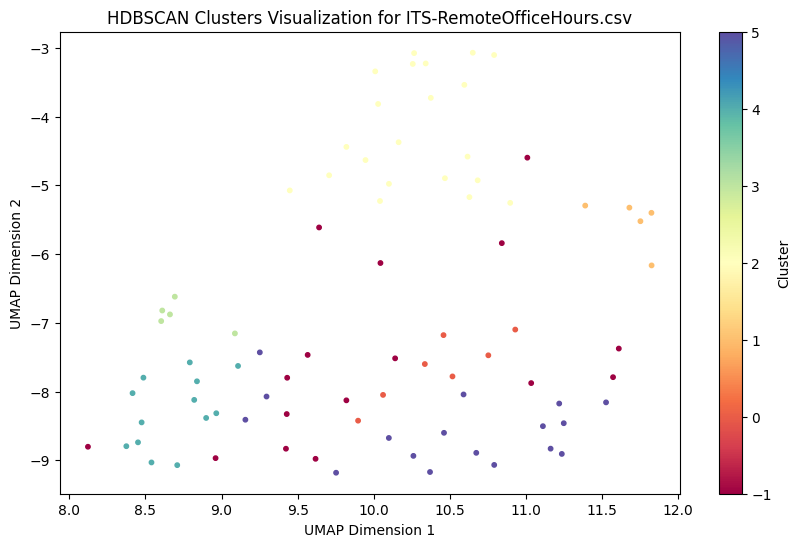

Number of clusters found in ITS-RemoteOfficeHours.csv: 6
Cluster
 2    21
 5    17
-1    16
 4    13
 0     7
 3     5
 1     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-RemoteOfficeHours.csv

Processing: ITS-RequestCanvasExternalApp.csv
Embedding column: Title


Batches: 100%|██████████| 3/3 [00:00<00:00, 20.99it/s]


Embedding column: Servicename


Batches: 100%|██████████| 3/3 [00:00<00:00, 30.30it/s]


Embedding column: Description


Batches: 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]


Embedding column: Feed


Batches: 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


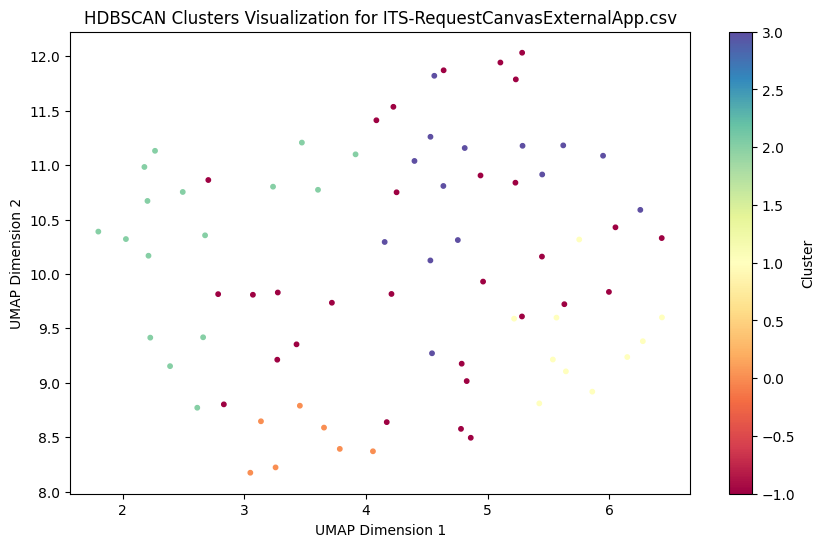

Number of clusters found in ITS-RequestCanvasExternalApp.csv: 4
Cluster
-1    30
 2    16
 3    14
 1    10
 0     7
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-RequestCanvasExternalApp.csv

Processing: ITS-ResponsiBLUE.csv
Embedding column: Title


Batches: 100%|██████████| 5/5 [00:00<00:00, 21.65it/s]


Embedding column: Servicename


Batches: 100%|██████████| 5/5 [00:00<00:00, 27.93it/s]


Embedding column: Description


Batches: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]


Embedding column: Feed


Batches: 100%|██████████| 5/5 [00:02<00:00,  1.80it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


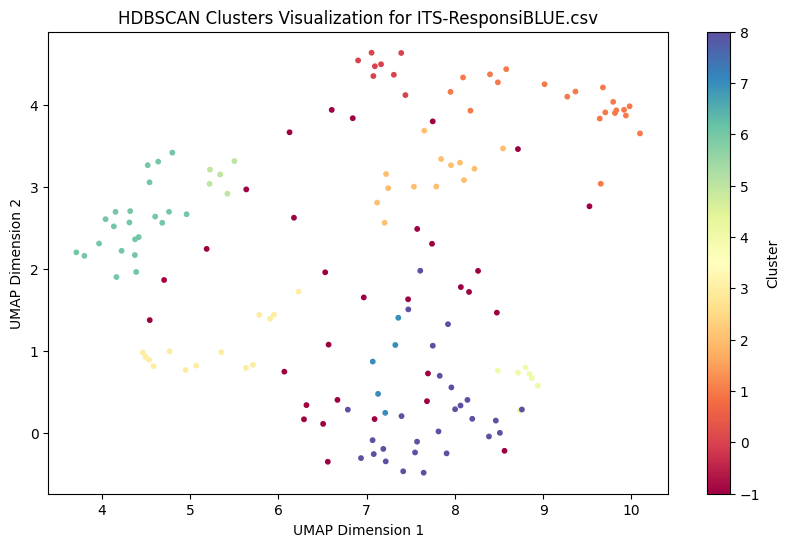

Number of clusters found in ITS-ResponsiBLUE.csv: 9
Cluster
-1    31
 8    27
 6    22
 1    20
 3    14
 2    13
 0     8
 4     7
 5     5
 7     5
Name: count, dtype: int64
Saved clustered file: Denodo_services_cluster\clustered_ITS-ResponsiBLUE.csv

Processing: ITS-RunMyJobs(RMJ).csv
Embedding column: Title


Batches: 100%|██████████| 256/256 [00:12<00:00, 21.16it/s]


Embedding column: Servicename


Batches: 100%|██████████| 256/256 [00:11<00:00, 21.72it/s]


Embedding column: Description


Batches: 100%|██████████| 256/256 [00:39<00:00,  6.41it/s]


Embedding column: Feed


Batches: 100%|██████████| 256/256 [02:35<00:00,  1.65it/s]
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\jsandeep\Desktop\MiniProject\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
import os
import pandas as pd
import numpy as np
import hdbscan
import umap
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
from sklearn.preprocessing import StandardScaler

# Define paths
input_folder = "Denodo_services"  # Folder with input CSV files
output_folder = "Denodo_services_cluster"  # Folder to store results

# Ensure the output folder exists
os.makedirs(output_folder, exist_ok=True)

# Text columns for embedding
text_columns = ["Title", "Servicename", "Description", "Feed"]  # Adjust based on actual dataset

# Load BERT model (Sentence-BERT for semantic similarity)
model = SentenceTransformer("all-MiniLM-L6-v2")

# Loop through all CSV files in the input folder
for file_name in os.listdir(input_folder):
    if file_name.endswith(".csv"):  # Process only CSV files
        file_path = os.path.join(input_folder, file_name)
        print(f"\nProcessing: {file_name}")

        try:
            df = pd.read_csv(file_path)

            # Drop rows with missing text data
            df.dropna(subset=text_columns, inplace=True)

            if df.empty:
                print(f"Skipping {file_name} (no valid data after dropping NaNs)")
                continue

            # Generate embeddings for each column separately
            column_embeddings = {}
            for col in text_columns:
                print(f"Embedding column: {col}")
                column_embeddings[col] = model.encode(df[col].astype(str).tolist(), show_progress_bar=True)

            # Combine embeddings from all text columns
            final_embeddings = np.hstack([column_embeddings[col] for col in text_columns])

            # Apply UMAP for dimensionality reduction
            umap_model = umap.UMAP(n_neighbors=15, n_components=50, metric="cosine").fit_transform(final_embeddings)
            scaler = StandardScaler()
            umap_embeddings = scaler.fit_transform(umap_model)

            # HDBSCAN clustering
            clusterer = hdbscan.HDBSCAN(min_cluster_size=5, min_samples=3, metric="euclidean", cluster_selection_method="eom")
            cluster_labels = clusterer.fit_predict(umap_embeddings)

            # Assign cluster labels to DataFrame
            df["Cluster"] = cluster_labels

            # Visualize clusters in 2D
            umap_2d = umap.UMAP(n_neighbors=15, n_components=2, metric="cosine").fit_transform(final_embeddings)

            plt.figure(figsize=(10, 6))
            plt.scatter(umap_2d[:, 0], umap_2d[:, 1], c=df["Cluster"], cmap="Spectral", s=10)
            plt.colorbar(label="Cluster")
            plt.title(f"HDBSCAN Clusters Visualization for {file_name}")
            plt.xlabel("UMAP Dimension 1")
            plt.ylabel("UMAP Dimension 2")
            plt.show()

            # Count clusters
            num_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
            print(f"Number of clusters found in {file_name}: {num_clusters}")
            print(df["Cluster"].value_counts())

            # Save clustered results
            output_file = os.path.join(output_folder, f"clustered_{file_name}")
            df.to_csv(output_file, index=False)
            print(f"Saved clustered file: {output_file}")

        except Exception as e:
            print(f"Error processing {file_name}: {e}")

print("\n All files processed! Clustered results saved in:", output_folder)
